# Setup

In [5]:
%pip install torch
%pip install transformer_lens
%pip install matplotlib
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [6]:
%pip install datasets
%pip install tiktoken
%pip install numpy
%pip install tqdm
%pip install circuitsvis

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [7]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
import datasets
from datasets import load_dataset
import tiktoken
import os
from tqdm.notebook import tqdm
import math
import time
from transformers import GPT2Tokenizer
from transformer_lens import HookedTransformer, HookedTransformerConfig
from typing import List, Dict, Any
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import circuitsvis as cv
from IPython.display import display

/Users/luhan/PycharmProjects/self-ablating-transformers/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Model Imports

In [ ]:
from model.gpt_neo import GPTNeo
from model.config import GPTNeoConfig

# Loading Pre-trained models

In [8]:
config = GPTNeoConfig(hidden_size=128)
model = GPTNeo(config)
model.load_state_dict(torch.load('best_model_128width_120000batches.pt', map_location=torch.device('cpu')))
model.eval()

/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/ipykernel_56036/1600929890.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model_

GPTNeo(
  (transformer): ModuleDict(
    (wte): Embedding(50257, 128)
    (wpe): Embedding(2048, 128)
    (h): ModuleList(
      (0-7): 8 x GPTNeoBlock(
        (ln_1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): Attention(
          (attention): ModuleDict(
            (k_proj): Linear(in_features=128, out_features=128, bias=False)
            (v_proj): Linear(in_features=128, out_features=128, bias=False)
            (q_proj): Linear(in_features=128, out_features=128, bias=False)
            (out_proj): Linear(in_features=128, out_features=128, bias=True)
          )
        )
        (ln_2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (c_fc): Linear(in_features=128, out_features=512, bias=True)
          (c_proj): Linear(in_features=512, out_features=128, bias=True)
          (act): NewGELUActivation()
        )
      )
    )
    (ln_f): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_

## TinyStories 3M

In [9]:
# Load model directly
from transformers import AutoTokenizer, AutoModelForCausalLM

tokenizer = AutoTokenizer.from_pretrained("roneneldan/TinyStories-3M")
TM3_model = AutoModelForCausalLM.from_pretrained("roneneldan/TinyStories-3M")

/Users/luhan/PycharmProjects/self-ablating-transformers/.venv/lib/python3.12/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


# Wrapper

### Model Structure:

```plaintext
GPTNeo(
  (transformer): ModuleDict(
    (wte): Embedding(50257, 128)
    (wpe): Embedding(2048, 128)
    (h): ModuleList(
      (0-7): 8 x GPTNeoBlock(
        (ln_1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): Attention(
          (attention): ModuleDict(
            (k_proj): Linear(in_features=128, out_features=128, bias=False)
            (v_proj): Linear(in_features=128, out_features=128, bias=False)
            (q_proj): Linear(in_features=128, out_features=128, bias=False)
            (out_proj): Linear(in_features=128, out_features=128, bias=True)
          )
        )
        (ln_2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (c_fc): Linear(in_features=128, out_features=512, bias=True)
          (c_proj): Linear(in_features=512, out_features=128, bias=True)
          (act): NewGELUActivation()
        )
      )
    )
    (ln_f): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    ...
  )
)


In [10]:
class PreTrainedGPTNeoWrapper(HookedTransformer):
    def __init__(self, gpt_neo_model, is_ablated=True):
        cfg = self.extract_config(gpt_neo_model.config)
        
        # Might be a good idea to add to config
        self.is_ablated = is_ablated
        
        hooked_cfg = HookedTransformerConfig(
            n_layers=cfg["n_layers"],
            d_model=cfg["d_model"],
            d_head=cfg["d_head"],
            n_heads=cfg["n_heads"],
            d_mlp=cfg["d_mlp"],
            d_vocab=cfg["d_vocab"],
            n_ctx=cfg["n_ctx"],
            act_fn="gelu",
            tokenizer_name="gpt2",
        )
        
        tokenizer = GPT2Tokenizer.from_pretrained('gpt2')
        
        super().__init__(cfg=hooked_cfg, tokenizer=tokenizer, move_to_device=False)
        
        self.gpt_neo = gpt_neo_model
        self.setup_hooks()

    @staticmethod
    def extract_config(config):
        return {
            "d_model": config.hidden_size,
            "d_head": config.hidden_size // config.num_heads,
            "n_heads": config.num_heads,
            "d_mlp": config.mlp_hidden_size,
            "n_layers": config.num_layers,
            "n_ctx": config.max_position_embeddings,
            "d_vocab": config.vocab_size,
        }

    def setup_hooks(self):
        self.hook_dict = {}
        for i in range(self.cfg.n_layers):
            self.hook_dict[f"blocks.{i}.attn"] = self.gpt_neo.transformer.h[i].attn
            self.hook_dict[f"blocks.{i}.mlp"] = self.gpt_neo.transformer.h[i].mlp
            
        if self.is_ablated:
            
            # Add ablation hooks
            self.hook_dict[f"attention ablations"] = self.gpt_neo.attention_ablations_head
            self.hook_dict[f"mlp ablations"] = self.gpt_neo.neuron_ablations_head

    def forward(self, input_ids):
        return self.gpt_neo(input_ids)

    def run_with_hooks(
        self, 
        input_ids, 
        fwd_hooks: List[tuple] = [], 
        return_type: str = "logits",
    ) -> Dict[str, Any]:
        hook_output = {}
        
        def create_hook(layer_name):
            def hook(module, input, output):
                print(f"Hook triggered for {layer_name}")
                if isinstance(output, tuple):
                    attn_output = output[-1].detach()
                else:
                    attn_output = output.detach()
                print(f"Hook captured output with shape: {attn_output.shape}")
                hook_output[layer_name] = attn_output
            return hook

        hooks = []
        for name, module in self.hook_dict.items():
            print(f"Registering hook on {name}")
            hooks.append(module.register_forward_hook(create_hook(name)))

        try:
            print("Running model with hooks...")
            output = self.forward(input_ids)
            print("Model run completed.")

            if isinstance(output, dict):
                if return_type == "logits":
                    return output.get("logits", None)
                elif return_type == "loss":
                    logits = output.get("logits", None)
                    if logits is not None:
                        return self.compute_loss(logits, input_ids)
                    else:
                        raise ValueError("No logits found in the model output.")
                elif return_type == "both":
                    logits = output.get("logits", None)
                    if logits is not None:
                        return logits, self.compute_loss(logits, input_ids)
                    else:
                        raise ValueError("No logits found in the model output.")
                elif return_type == "hook_data":
                    return hook_output
                else:
                    raise ValueError(f"Invalid return_type: {return_type}")
            else:
                if return_type == "logits":
                    return output
                elif return_type == "loss":
                    return self.compute_loss(output, input_ids)
                elif return_type == "both":
                    return output, self.compute_loss(output, input_ids)
                elif return_type == "hook_data":
                    return hook_output
                else:
                    raise ValueError(f"Invalid return_type: {return_type}")

        finally:
            for hook in hooks:
                hook.remove()

    def run_with_cache(
        self, 
        input_ids, 
        return_type: str = "logits",
    ) -> Dict[str, Any]:
        cache = {}
        
        def create_cache_hook(layer_name):
            def hook(module, input, output):
                if isinstance(output, tuple):
                    cache[layer_name] = output[-1].detach()
                else:
                    cache[layer_name] = output.detach()
            return hook

        hooks = []
        for name, module in self.hook_dict.items():
            hooks.append(module.register_forward_hook(create_cache_hook(name)))

        try:
            output = self.forward(input_ids)

            if isinstance(output, dict):
                logits = output.get("logits", None)
            else:
                logits = output

            if return_type == "logits":
                return logits, cache
            elif return_type == "loss":
                if logits is not None:
                    loss = self.compute_loss(logits, input_ids)
                    return loss, cache
                else:
                    raise ValueError("No logits found in the model output.")
            elif return_type == "both":
                if logits is not None:
                    loss = self.compute_loss(logits, input_ids)
                    return logits, loss, cache
                else:
                    raise ValueError("No logits found in the model output.")
            else:
                raise ValueError(f"Invalid return_type: {return_type}")

        finally:
            for hook in hooks:
                hook.remove()

    def compute_loss(self, logits, targets):
        return torch.nn.functional.cross_entropy(
            logits.view(-1, logits.size(-1)), 
            targets.view(-1), 
            ignore_index=-100
        )


In [11]:
# Initialize the wrapper with the pre-trained model
wrapped_model = PreTrainedGPTNeoWrapper(model)

# Interpretability Experiment 1

## Visualizations

In [23]:
def get_attention_patterns(model, input_ids):
    attention_patterns = []
    
    def attention_hook(module, input, output):
        # The output is the attended information
        attention_patterns.append(output.detach())

    hooks = [layer.attn.register_forward_hook(attention_hook) for layer in model.transformer.h]
    
    with torch.no_grad():
        model(input_ids)
    
    for hook in hooks:
        hook.remove()
    
    return torch.stack(attention_patterns)

def visualize_attention(attention_patterns, tokens):
    num_layers, batch_size, seq_len, hidden_size = attention_patterns.shape
    
    fig, axes = plt.subplots(4, 2, figsize=(20, 30))
    fig.suptitle('Attention Output Magnitudes Across Layers')
    
    for layer in range(num_layers):
        ax = axes[layer // 2, layer % 2]
        
        # Calculate the magnitude of attention outputs
        attn_magnitude = attention_patterns[layer, 0].norm(dim=-1).cpu().numpy()
        
        sns.heatmap(attn_magnitude.reshape(1, -1), ax=ax, cmap='viridis', xticklabels=tokens, yticklabels=['Magnitude'])
        ax.set_title(f'Layer {layer}')
        ax.set_xlabel('Token Position')
    
    plt.tight_layout()
    plt.show()


def get_attention_info(model, input_ids):
    layer_inputs = []
    layer_outputs = []
    
    def attention_hook(module, input, output):
        layer_inputs.append(input[0].detach())
        if isinstance(output, tuple):
            layer_outputs.append(output[0].detach())  # Assuming the first element is the main output
        else:
            layer_outputs.append(output.detach())

    hooks = [layer.attn.register_forward_hook(attention_hook) for layer in model.transformer.h]
    
    with torch.no_grad():
        model(input_ids)
    
    for hook in hooks:
        hook.remove()
    
    print("Number of captured outputs:", len(layer_outputs))
    print("Input shape for first layer:", layer_inputs[0].shape)
    print("Output shape for first layer:", layer_outputs[0].shape)
    
    # Combine every 3 outputs into a single layer output
    attention_inputs = layer_inputs[::3]  # Take every 3rd input
    attention_outputs = [torch.stack(layer_outputs[i:i+3]).sum(0) for i in range(0, len(layer_outputs), 3)]
    
    print("Number of processed layers:", len(attention_outputs))
    
    return attention_inputs, attention_outputs



def analyze_attention(attention_inputs, attention_outputs, tokens):
    num_layers = len(attention_outputs)
    assert num_layers == 8, f"Expected 8 layers, got {num_layers}"
    
    fig, axes = plt.subplots(4, 2, figsize=(20, 40))
    fig.suptitle('Attention Analysis Across Layers')
    
    for layer in range(num_layers):
        ax = axes[layer // 2, layer % 2]
        
        # Compute the change in representation
        input_norm = attention_inputs[layer].norm(dim=-1)
        output_norm = attention_outputs[layer].norm(dim=-1)
        
        change = (output_norm - input_norm).cpu().numpy()
        
        sns.heatmap(change, ax=ax, cmap='coolwarm', center=0, 
                    xticklabels=tokens, yticklabels=tokens)
        ax.set_title(f'Layer {layer}')
        ax.set_xlabel('Token Position')
        ax.set_ylabel('Token Position')
        
        # Rotate x-axis labels for better readability
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()




def analyze_mlp_activations(hook_data):
    
    # We should probably not use global variables.
    # Might be better if these functions are part of a class.
    for layer in range(wrapped_model.cfg.n_layers):
        mlp_activations = hook_data[f"blocks.{layer}.mlp"]
        print(f"Layer {layer} MLP Activations Shape:", mlp_activations.shape)
        
        activations = mlp_activations.detach().cpu().numpy()
        print(f"Layer {layer} MLP Activation Stats:")
        print(f"  Mean: {activations.mean():.4f}")
        print(f"  Std Dev: {activations.std():.4f}")
        print(f"  Min: {activations.min():.4f}")
        print(f"  Max: {activations.max():.4f}")
        
        plt.figure(figsize=(10, 6))
        plt.hist(activations.flatten(), bins=50)
        plt.title(f'Distribution of MLP Activations - Layer {layer}')
        plt.xlabel('Activation Value')
        plt.ylabel('Frequency')
        plt.show()



In [20]:
# Sanity Testing
input_text = "Once upon a time, in a land far away, there lived a brave little mouse."
input_ids = wrapped_model.tokenizer(input_text, return_tensors="pt").input_ids
tokens = wrapped_model.tokenizer.convert_ids_to_tokens(input_ids[0])
print(f"Number of tokens: {len(tokens)}")
print(f"Tokens: {tokens}")

Number of tokens: 18
Tokens: ['Once', 'Ġupon', 'Ġa', 'Ġtime', ',', 'Ġin', 'Ġa', 'Ġland', 'Ġfar', 'Ġaway', ',', 'Ġthere', 'Ġlived', 'Ġa', 'Ġbrave', 'Ġlittle', 'Ġmouse', '.']


In [21]:
# Run with hooks and get various outputs
logits = wrapped_model.run_with_hooks(input_ids, return_type="logits")
loss = wrapped_model.run_with_hooks(input_ids, return_type="loss")
hook_data = wrapped_model.run_with_hooks(input_ids, return_type="hook_data")

# Run with cache
logits, cache = wrapped_model.run_with_cache(input_ids, return_type="logits")

Registering hook on blocks.0.attn
Registering hook on blocks.0.mlp
Registering hook on blocks.1.attn
Registering hook on blocks.1.mlp
Registering hook on blocks.2.attn
Registering hook on blocks.2.mlp
Registering hook on blocks.3.attn
Registering hook on blocks.3.mlp
Registering hook on blocks.4.attn
Registering hook on blocks.4.mlp
Registering hook on blocks.5.attn
Registering hook on blocks.5.mlp
Registering hook on blocks.6.attn
Registering hook on blocks.6.mlp
Registering hook on blocks.7.attn
Registering hook on blocks.7.mlp
Registering hook on attention ablations
Registering hook on mlp ablations
Running model with hooks...
Hook triggered for blocks.0.attn
Hook captured output with shape: torch.Size([1, 18, 128])
Hook triggered for blocks.0.mlp
Hook captured output with shape: torch.Size([1, 18, 128])
Hook triggered for blocks.1.attn
Hook captured output with shape: torch.Size([1, 18, 128])
Hook triggered for blocks.1.mlp
Hook captured output with shape: torch.Size([1, 18, 128])


places where ablation_mask is nonzero: [[0, 0, 76], [0, 0, 79], [0, 1, 76], [0, 2, 76], [0, 2, 127], [0, 3, 76], [0, 3, 84], [0, 3, 117], [0, 4, 76], [0, 5, 65], [0, 5, 76], [0, 6, 76], [0, 7, 65], [0, 7, 76], [0, 7, 84], [0, 8, 65], [0, 8, 76], [0, 9, 65], [0, 9, 76], [0, 10, 65], [0, 10, 76], [0, 11, 76], [0, 11, 84], [0, 12, 76], [0, 12, 84], [0, 12, 117], [0, 13, 76], [0, 13, 84], [0, 13, 115], [0, 14, 74], [0, 14, 76], [0, 14, 84], [0, 14, 115], [0, 15, 76], [0, 15, 115], [0, 16, 76], [0, 16, 115], [0, 16, 127], [0, 17, 4], [0, 17, 15], [0, 17, 65], [0, 17, 74], [0, 17, 76], [0, 17, 86], [0, 17, 92], [0, 17, 97], [0, 17, 127]]
places where ablation_mask is nonzero: [[0, 2, 104], [0, 17, 106]]
places where ablation_mask is nonzero: []
places where ablation_mask is nonzero: [[0, 2, 71], [0, 3, 71], [0, 6, 71], [0, 13, 71], [0, 14, 71], [0, 15, 71], [0, 16, 71], [0, 17, 71]]
places where ablation_mask is nonzero: [[0, 8, 19], [0, 13, 19], [0, 14, 19], [0, 15, 19]]
places where ablati

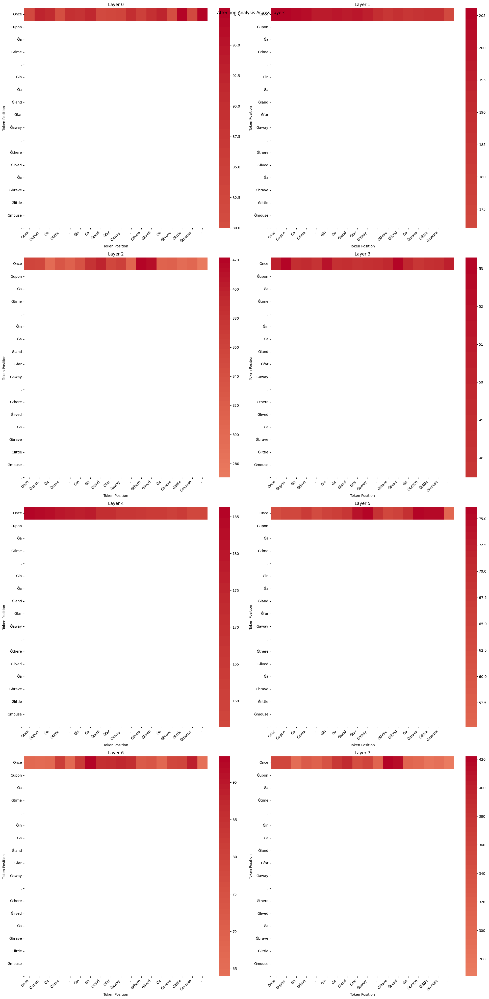

In [40]:
# Attention analysis
attention_inputs, attention_outputs = get_attention_info(model, input_ids)
analyze_attention(attention_inputs, attention_outputs, tokens)


Analyzing MLP Activations:
Layer 0 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 0 MLP Activation Stats:
  Mean: -0.6594
  Std Dev: 18.0370
  Min: -281.4922
  Max: 74.8826


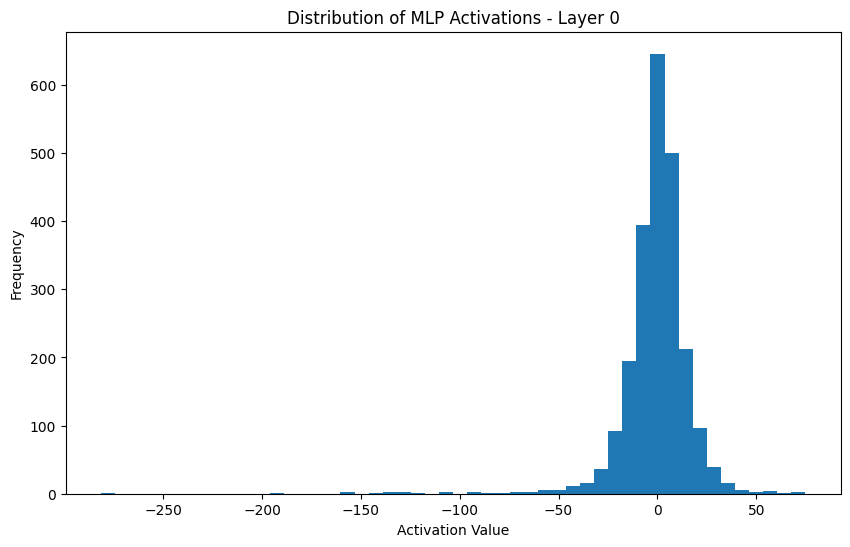

Layer 1 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 1 MLP Activation Stats:
  Mean: -0.6072
  Std Dev: 22.1063
  Min: -257.9714
  Max: 135.0710


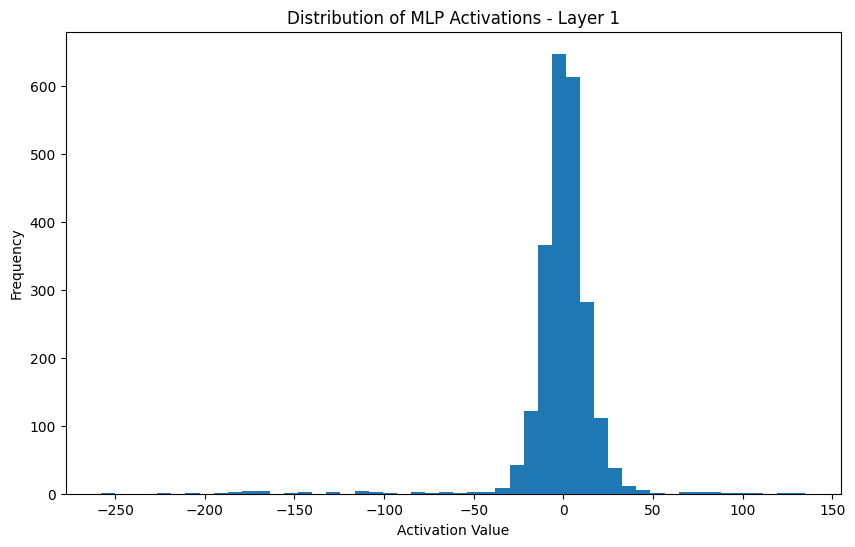

Layer 2 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 2 MLP Activation Stats:
  Mean: -1.0713
  Std Dev: 22.9268
  Min: -264.8664
  Max: 103.0386


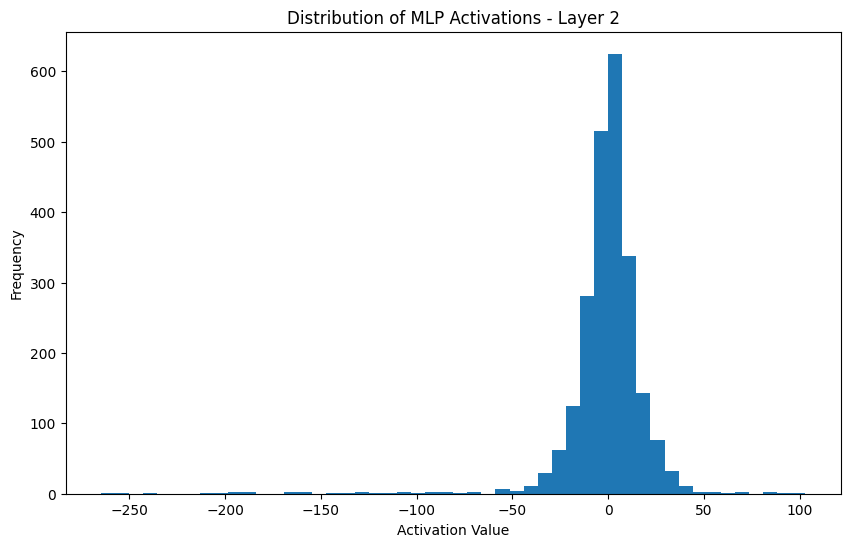

Layer 3 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 3 MLP Activation Stats:
  Mean: -0.5333
  Std Dev: 12.1075
  Min: -144.5983
  Max: 37.8220


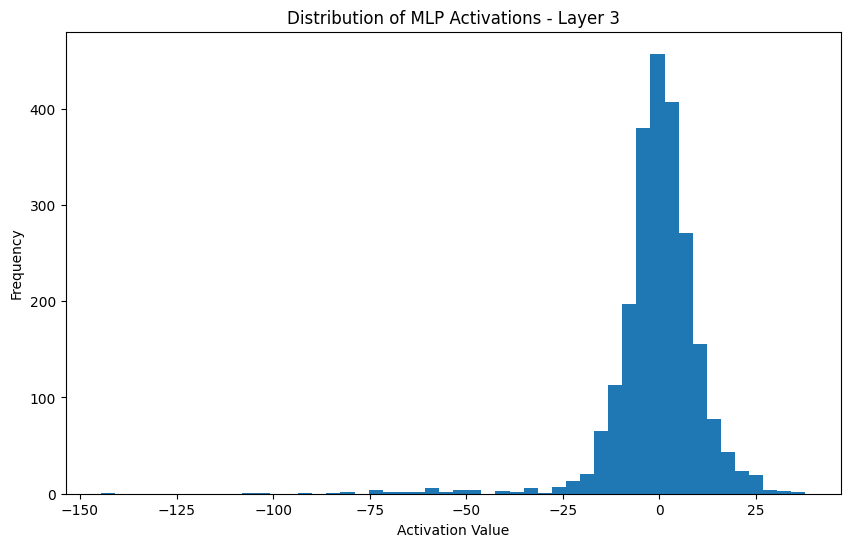

Layer 4 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 4 MLP Activation Stats:
  Mean: 0.0051
  Std Dev: 13.3441
  Min: -97.6191
  Max: 63.8956


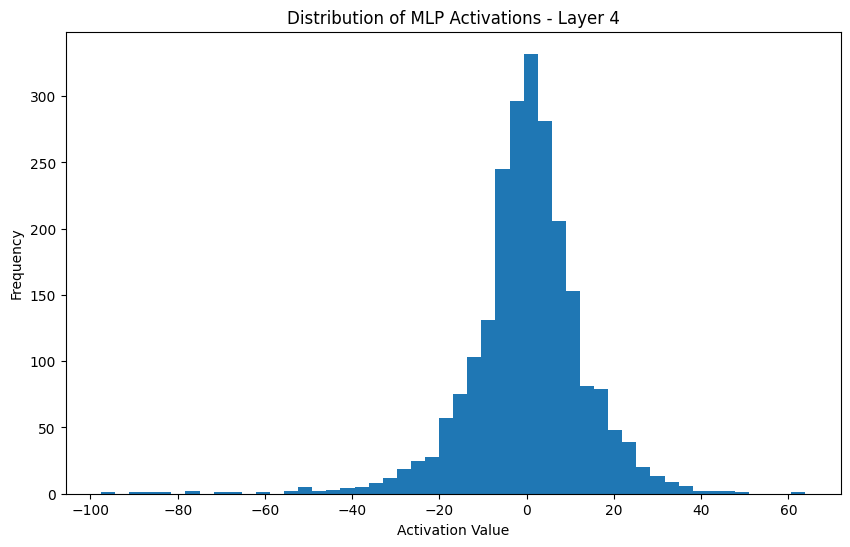

Layer 5 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 5 MLP Activation Stats:
  Mean: -0.0323
  Std Dev: 10.1266
  Min: -69.2825
  Max: 49.5754


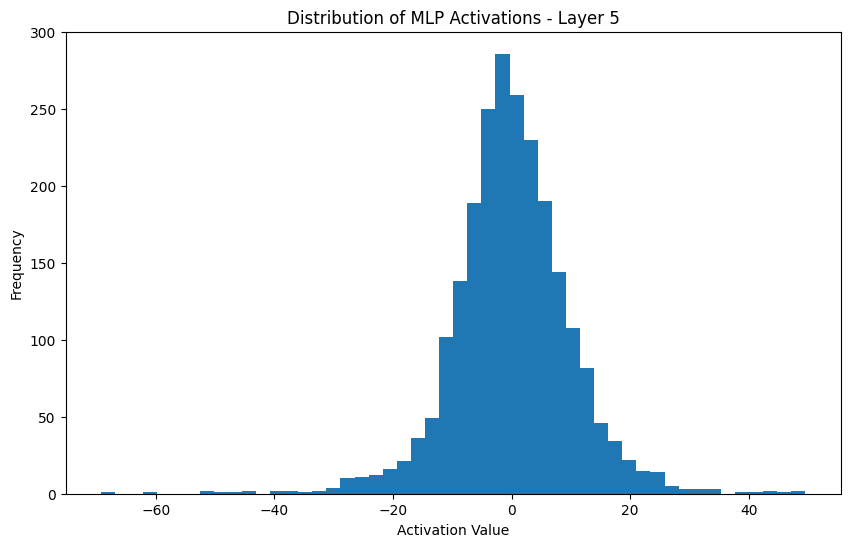

Layer 6 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 6 MLP Activation Stats:
  Mean: -0.0748
  Std Dev: 9.3169
  Min: -37.2436
  Max: 43.0939


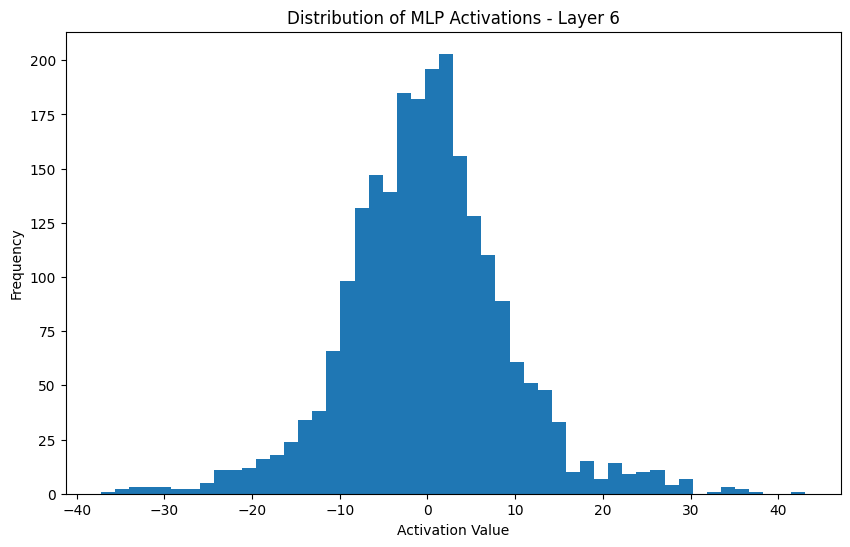

Layer 7 MLP Activations Shape: torch.Size([1, 18, 128])
Layer 7 MLP Activation Stats:
  Mean: 2.9788
  Std Dev: 64.8707
  Min: -426.0628
  Max: 949.9709


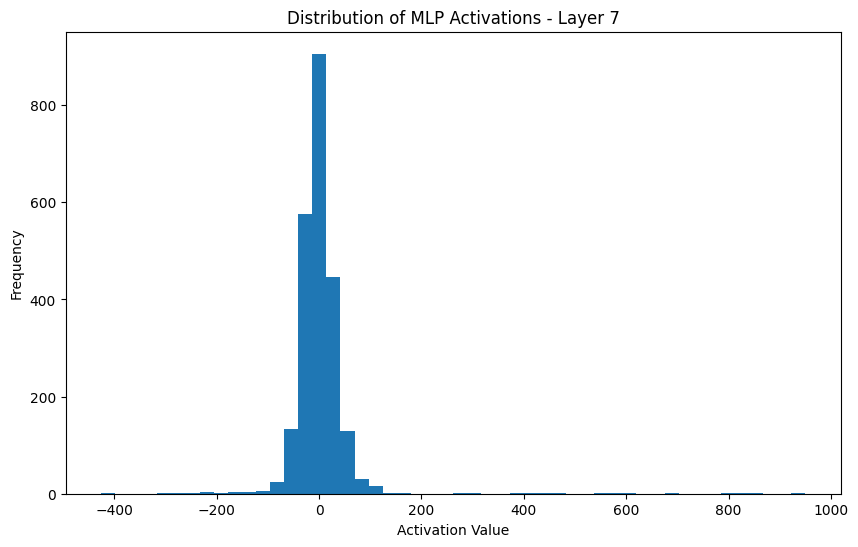


Analyzing Ablation Patterns:
Attention Ablations Shape: (1024, 128)
Neuron Ablations Shape: (4096, 128)


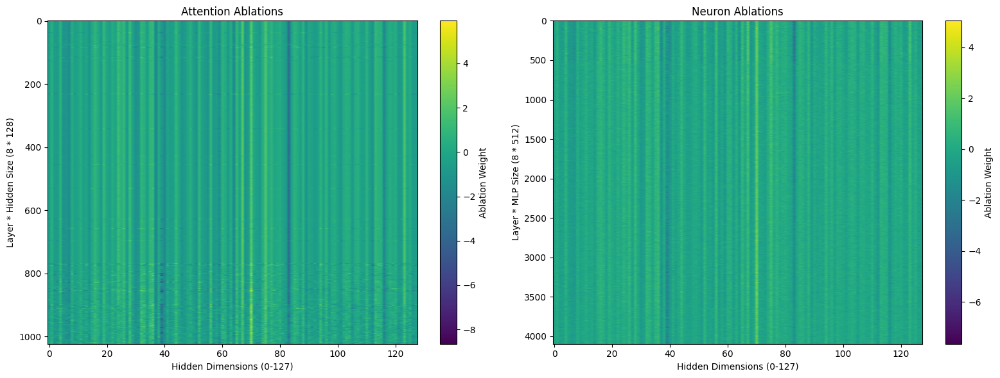


Attention Ablations Stats:
  Mean: -0.1107
  Std Dev: 0.9126
  Min: -8.6540
  Max: 5.9265

Neuron Ablations Stats:
  Mean: -0.0703
  Std Dev: 0.7238
  Min: -7.6510
  Max: 5.0362

Examining cached activations:
blocks.0.attn: torch.Size([1, 18, 128])
blocks.0.mlp: torch.Size([1, 18, 128])
blocks.1.attn: torch.Size([1, 18, 128])
blocks.1.mlp: torch.Size([1, 18, 128])
blocks.2.attn: torch.Size([1, 18, 128])
blocks.2.mlp: torch.Size([1, 18, 128])
blocks.3.attn: torch.Size([1, 18, 128])
blocks.3.mlp: torch.Size([1, 18, 128])
blocks.4.attn: torch.Size([1, 18, 128])
blocks.4.mlp: torch.Size([1, 18, 128])
blocks.5.attn: torch.Size([1, 18, 128])
blocks.5.mlp: torch.Size([1, 18, 128])
blocks.6.attn: torch.Size([1, 18, 128])
blocks.6.mlp: torch.Size([1, 18, 128])
blocks.7.attn: torch.Size([1, 18, 128])
blocks.7.mlp: torch.Size([1, 18, 128])
attention ablations: torch.Size([1, 18, 1024])
mlp ablations: torch.Size([1, 18, 4096])


In [24]:
# Analysis
print("\nAnalyzing MLP Activations:")
analyze_mlp_activations(hook_data)


print("\nExamining cached activations:")
for name, activation in cache.items():
    print(f"{name}: {activation.shape}")

## CircuitViz Visualizations (Attempted)
So far it requires more compatible implementation of the wrapper with the pre-loaded models in transformer_lens <br />
Feasibility: Unknown

In [41]:
import einops 
import torch as t
from torch import Tensor
import circuitsvis as cv
from jaxtyping import Float
from IPython.display import clear_output, display, HTML
from transformer_lens import HookedTransformer

In [42]:
# Model loading

t.set_grad_enabled(False)
# Load the pre-trained model
config = GPTNeoConfig(hidden_size=128)
model = GPTNeo(config)
model.load_state_dict(torch.load('best_model_128width_120000batches.pt', map_location=torch.device('cpu')))
model.eval()
wrapped_model = PreTrainedGPTNeoWrapper(model)

/home/jazhyc/miniconda3/envs/ablation/lib/python3.11/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [43]:
gpt_neo_c = wrapped_model
input_text = "Once upon a time, in a land far away, there lived a brave little mouse."

input_ids = gpt_neo_c.tokenizer(input_text, return_tensors="pt").input_ids

In [44]:
names_filter = lambda name: any(name.endswith(f"hook_{s}") for s in ["pattern", "q", "k", "v"])
logits, cache = gpt_neo_c.run_with_cache(input_ids)

places where ablation_mask is nonzero: [[0, 0, 76], [0, 0, 79], [0, 1, 76], [0, 2, 76], [0, 2, 127], [0, 3, 76], [0, 3, 84], [0, 3, 117], [0, 4, 76], [0, 5, 65], [0, 5, 76], [0, 6, 76], [0, 7, 65], [0, 7, 76], [0, 7, 84], [0, 8, 65], [0, 8, 76], [0, 9, 65], [0, 9, 76], [0, 10, 65], [0, 10, 76], [0, 11, 76], [0, 11, 84], [0, 12, 76], [0, 12, 84], [0, 12, 117], [0, 13, 76], [0, 13, 84], [0, 13, 115], [0, 14, 74], [0, 14, 76], [0, 14, 84], [0, 14, 115], [0, 15, 76], [0, 15, 115], [0, 16, 76], [0, 16, 115], [0, 16, 127], [0, 17, 4], [0, 17, 15], [0, 17, 65], [0, 17, 74], [0, 17, 76], [0, 17, 86], [0, 17, 92], [0, 17, 97], [0, 17, 127]]
places where ablation_mask is nonzero: [[0, 2, 104], [0, 17, 106]]
places where ablation_mask is nonzero: []
places where ablation_mask is nonzero: [[0, 2, 71], [0, 3, 71], [0, 6, 71], [0, 13, 71], [0, 14, 71], [0, 15, 71], [0, 16, 71], [0, 17, 71]]
places where ablation_mask is nonzero: [[0, 8, 19], [0, 13, 19], [0, 14, 19], [0, 15, 19]]
places where ablati

In [45]:
cache.keys()

dict_keys(['blocks.0.attn', 'blocks.0.mlp', 'blocks.1.attn', 'blocks.1.mlp', 'blocks.2.attn', 'blocks.2.mlp', 'blocks.3.attn', 'blocks.3.mlp', 'blocks.4.attn', 'blocks.4.mlp', 'blocks.5.attn', 'blocks.5.mlp', 'blocks.6.attn', 'blocks.6.mlp', 'blocks.7.attn', 'blocks.7.mlp', 'attention ablations', 'mlp ablations'])

In [52]:
_attention = cache['attention ablations']
_tokens = gpt_neo_c.tokenizer.convert_ids_to_tokens(input_ids[0])

cv.attention.attention_pattern(
    attention = _attention,
    tokens = _tokens,
)

## Draft version of experiment 1

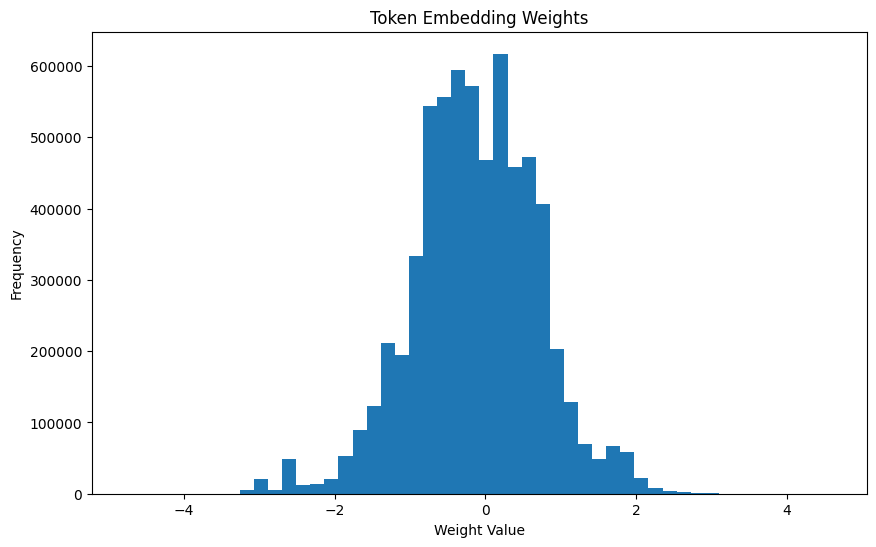

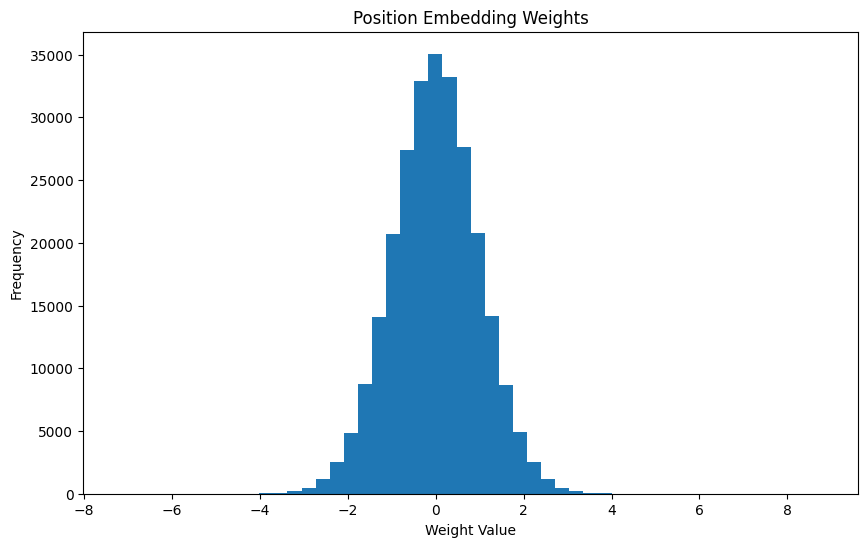

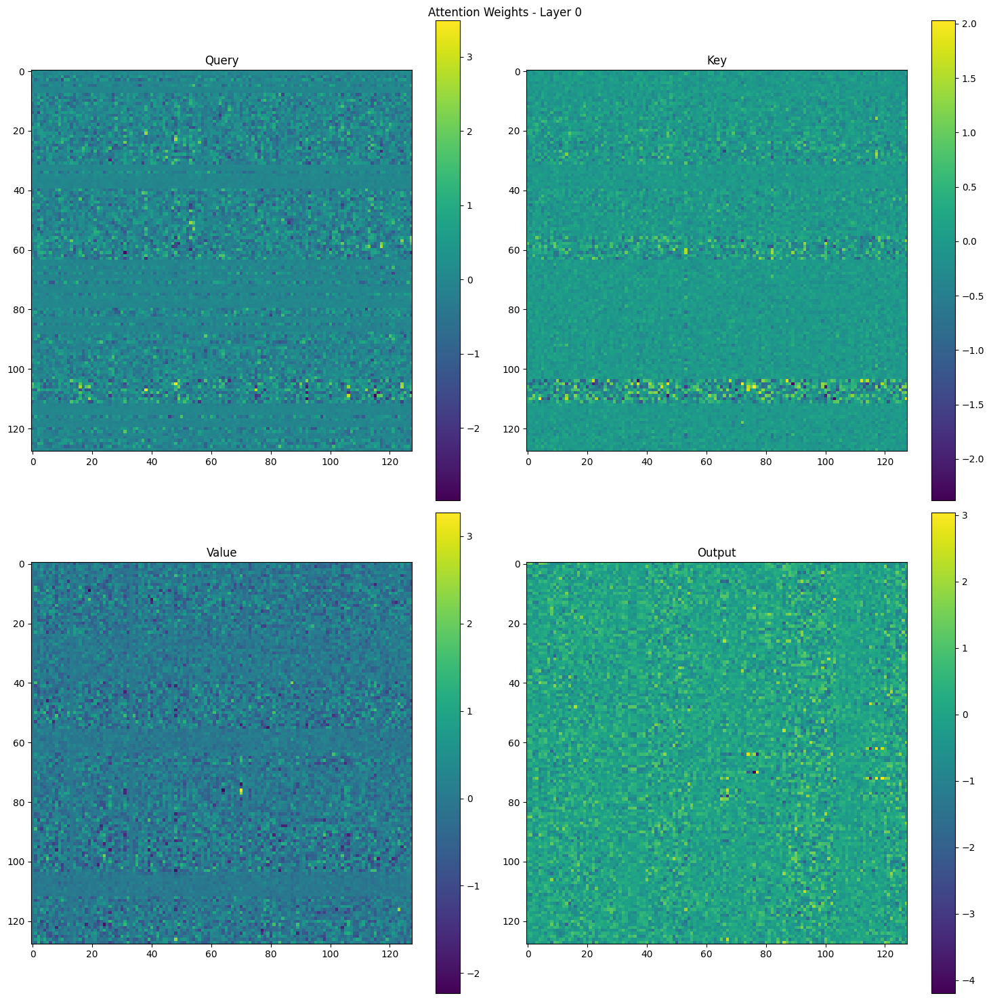

MLP Analysis - Layer 0
Input dimension: 128
Hidden dimension: 512
Output dimension: 128


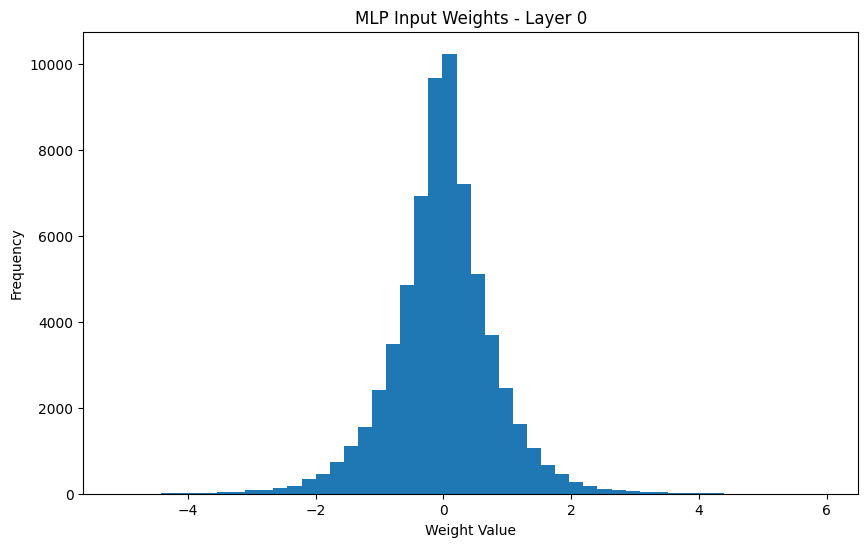

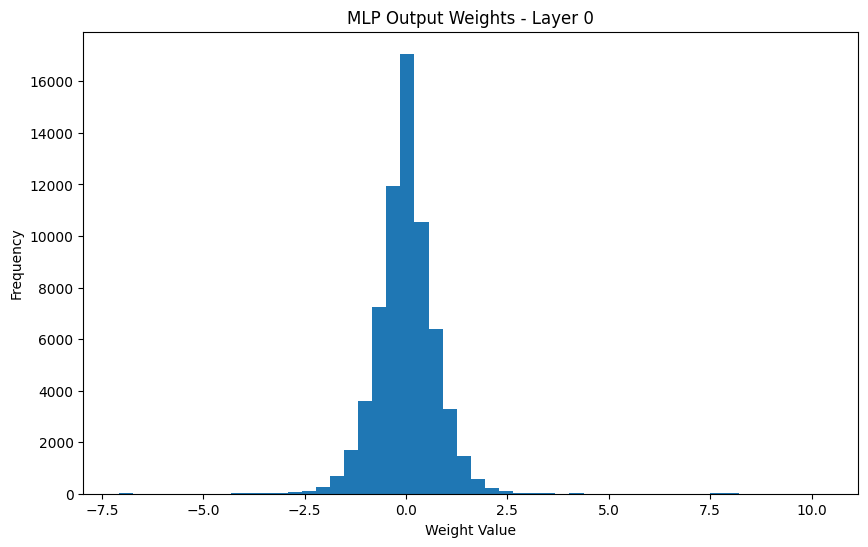

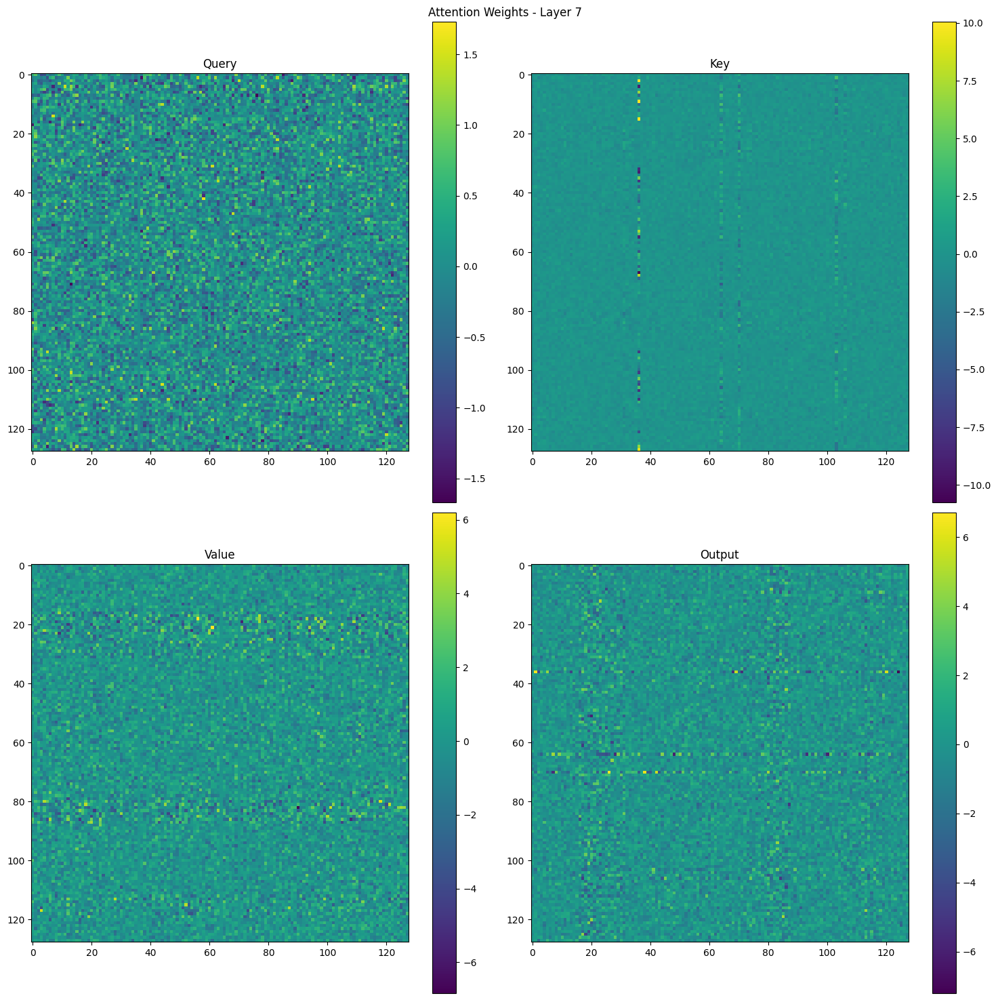

MLP Analysis - Layer 7
Input dimension: 128
Hidden dimension: 512
Output dimension: 128


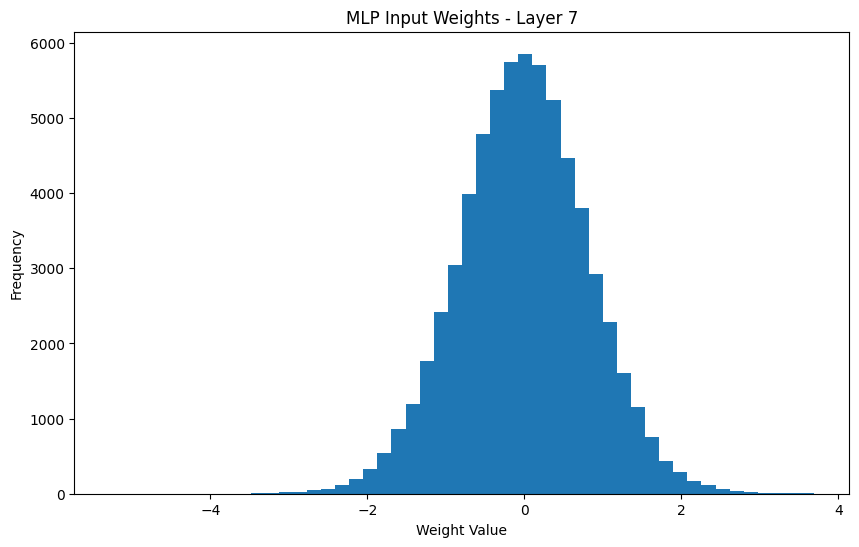

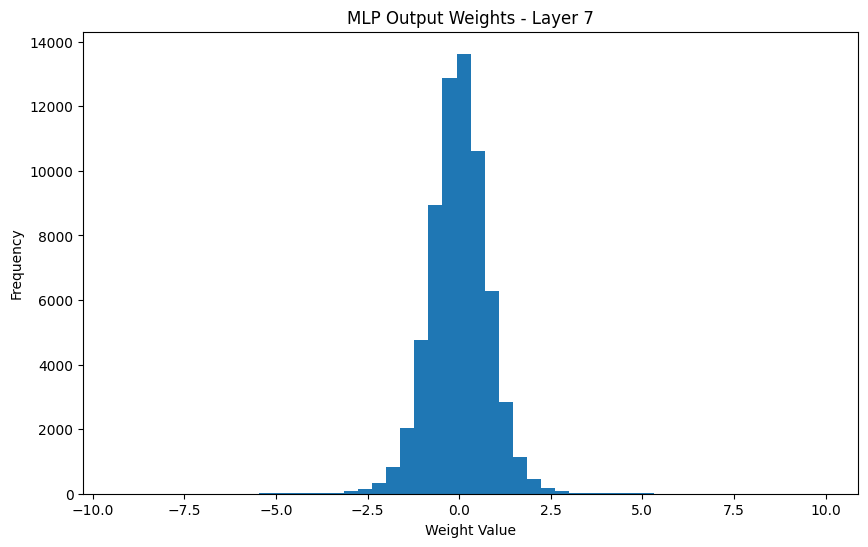

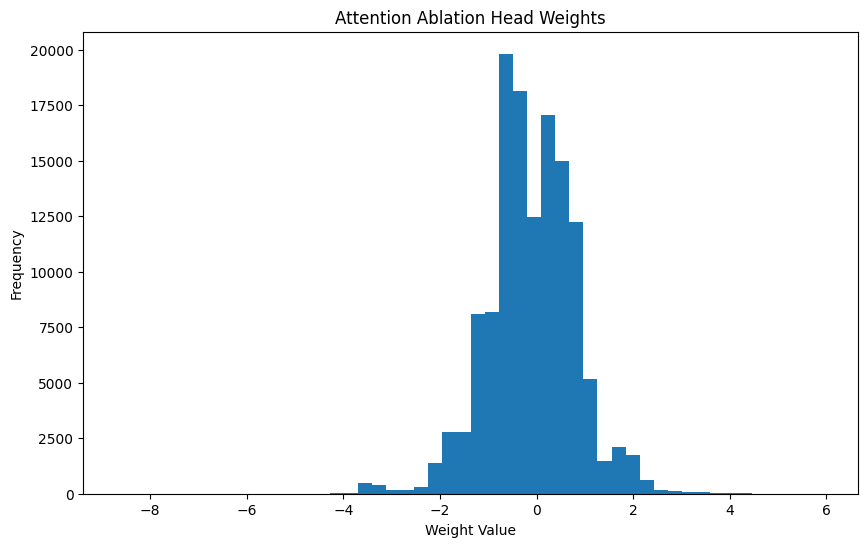

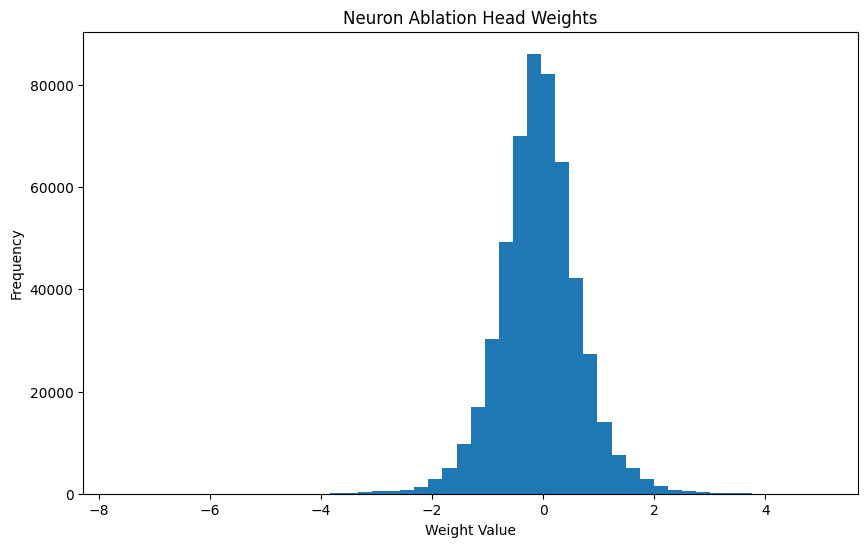

Analysis complete. Check the generated plots for visualizations.


In [24]:

def visualize_weight_distribution(weight, title):
    """Visualize the distribution of weights in a parameter."""
    plt.figure(figsize=(10, 6))
    plt.hist(weight.detach().cpu().numpy().flatten(), bins=50)
    plt.title(title)
    plt.xlabel('Weight Value')
    plt.ylabel('Frequency')
    plt.show()

def visualize_attention_weights(model, layer_idx):
    """Visualize attention weights for a specific layer."""
    attention = model.transformer.h[layer_idx].attn.attention
    weights = {
        'Query': attention.q_proj.weight,
        'Key': attention.k_proj.weight,
        'Value': attention.v_proj.weight,
        'Output': attention.out_proj.weight
    }
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    fig.suptitle(f'Attention Weights - Layer {layer_idx}')
    
    for (name, weight), ax in zip(weights.items(), axes.flatten()):
        im = ax.imshow(weight.detach().cpu().numpy(), cmap='viridis')
        ax.set_title(name)
        fig.colorbar(im, ax=ax)
    
    plt.tight_layout()
    plt.show()

def analyze_mlp(model, layer_idx):
    """Analyze the MLP of a specific layer."""
    mlp = model.transformer.h[layer_idx].mlp
    print(f"MLP Analysis - Layer {layer_idx}")
    print(f"Input dimension: {mlp.c_fc.in_features}")
    print(f"Hidden dimension: {mlp.c_fc.out_features}")
    print(f"Output dimension: {mlp.c_proj.out_features}")
    
    visualize_weight_distribution(mlp.c_fc.weight, f'MLP Input Weights - Layer {layer_idx}')
    visualize_weight_distribution(mlp.c_proj.weight, f'MLP Output Weights - Layer {layer_idx}')

# Analyze embedding weights
visualize_weight_distribution(model.transformer.wte.weight, 'Token Embedding Weights')
visualize_weight_distribution(model.transformer.wpe.weight, 'Position Embedding Weights')

# Analyze attention and MLP for the first and last layers
for layer_idx in [0, 7]:  # First and last layers
    visualize_attention_weights(model, layer_idx)
    analyze_mlp(model, layer_idx)

# Analyze ablation heads
visualize_weight_distribution(model.attention_ablations_head.weight, 'Attention Ablation Head Weights')
visualize_weight_distribution(model.neuron_ablations_head.weight, 'Neuron Ablation Head Weights')

print("Analysis complete. Check the generated plots for visualizations.")

/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/ipykernel_16906/2704501891.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model

places where ablation_mask is nonzero: [[0, 0, 76], [0, 0, 79], [0, 1, 76], [0, 2, 76], [0, 2, 127], [0, 3, 76], [0, 3, 84], [0, 3, 117]]
places where ablation_mask is nonzero: [[0, 2, 104]]
places where ablation_mask is nonzero: []
places where ablation_mask is nonzero: [[0, 2, 71], [0, 3, 71]]
places where ablation_mask is nonzero: []
places where ablation_mask is nonzero: []
places where ablation_mask is nonzero: [[0, 0, 2], [0, 0, 100], [0, 2, 2], [0, 2, 59], [0, 3, 7], [0, 3, 100], [0, 3, 116]]
places where ablation_mask is nonzero: [[0, 0, 3], [0, 0, 19], [0, 0, 20], [0, 0, 21], [0, 0, 30], [0, 0, 31], [0, 0, 42], [0, 0, 47], [0, 0, 71], [0, 0, 79], [0, 0, 92], [0, 0, 94], [0, 0, 113], [0, 0, 122], [0, 1, 19], [0, 1, 87], [0, 1, 92], [0, 1, 113], [0, 2, 0], [0, 2, 3], [0, 2, 5], [0, 2, 10], [0, 2, 16], [0, 2, 18], [0, 2, 19], [0, 2, 20], [0, 2, 21], [0, 2, 22], [0, 2, 24], [0, 2, 26], [0, 2, 29], [0, 2, 43], [0, 2, 48], [0, 2, 65], [0, 2, 70], [0, 2, 71], [0, 2, 78], [0, 2, 79], 

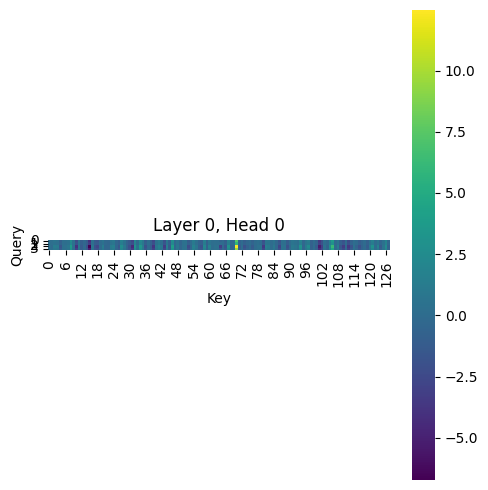

Layer 1 Attention Output Type: <class 'torch.Tensor'>
Layer 1 Attention Output Shape: torch.Size([1, 4, 128])


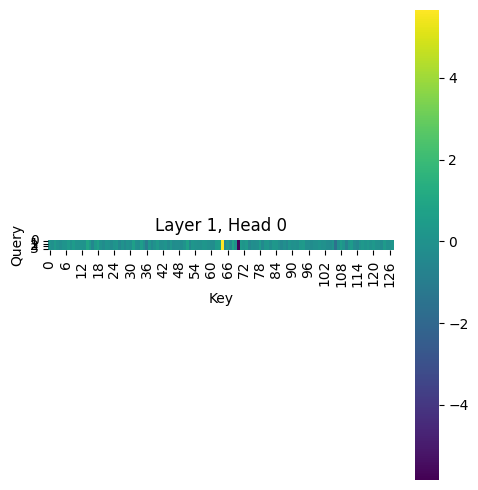

Layer 2 Attention Output Type: <class 'torch.Tensor'>
Layer 2 Attention Output Shape: torch.Size([1, 4, 128])


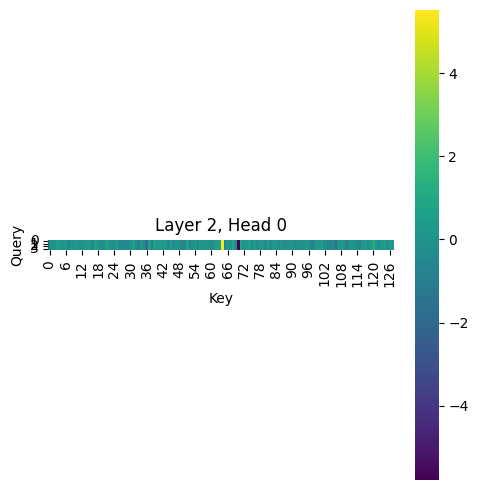

Layer 3 Attention Output Type: <class 'torch.Tensor'>
Layer 3 Attention Output Shape: torch.Size([1, 4, 128])


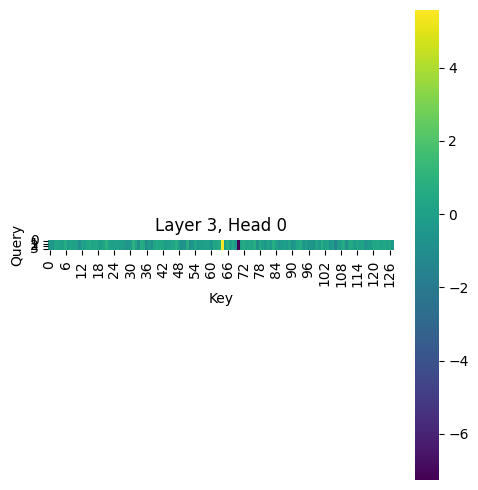

Layer 4 Attention Output Type: <class 'torch.Tensor'>
Layer 4 Attention Output Shape: torch.Size([1, 4, 128])


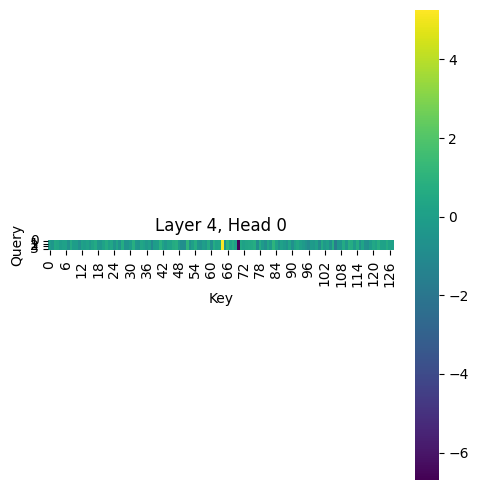

Layer 5 Attention Output Type: <class 'torch.Tensor'>
Layer 5 Attention Output Shape: torch.Size([1, 4, 128])


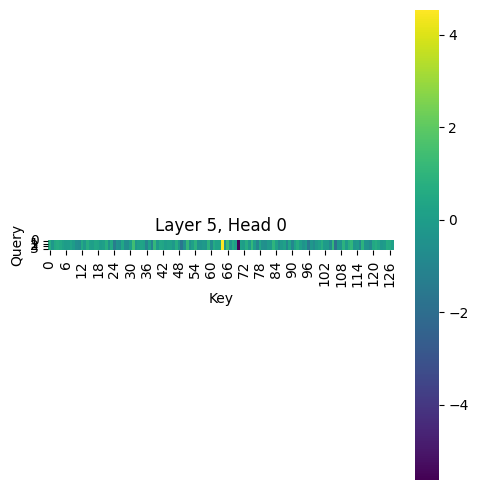

Layer 6 Attention Output Type: <class 'torch.Tensor'>
Layer 6 Attention Output Shape: torch.Size([1, 4, 128])


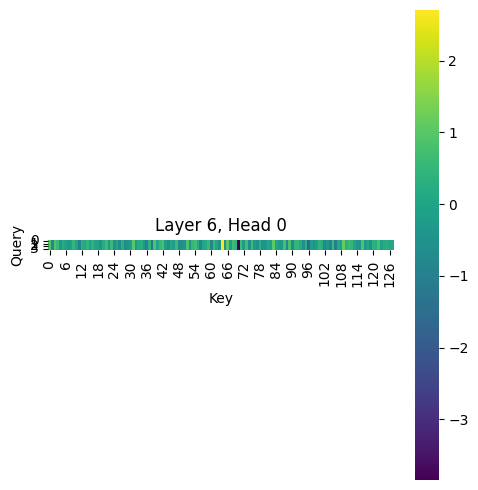

Layer 7 Attention Output Type: <class 'torch.Tensor'>
Layer 7 Attention Output Shape: torch.Size([1, 4, 128])


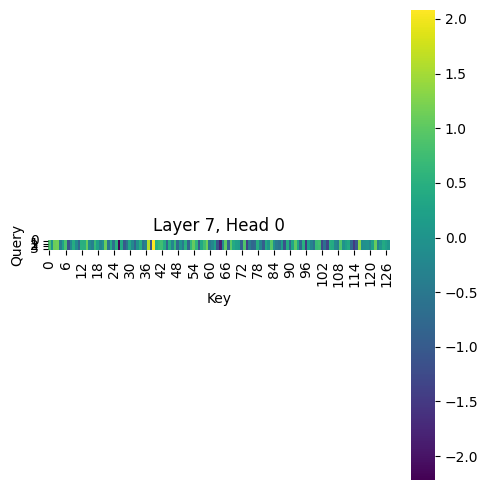


Analyzing MLP Activations:
Layer 0 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 0 MLP Activation Stats:
  Mean: -0.3775
  Std Dev: 9.5131
  Min: -91.4325
  Max: 34.2279


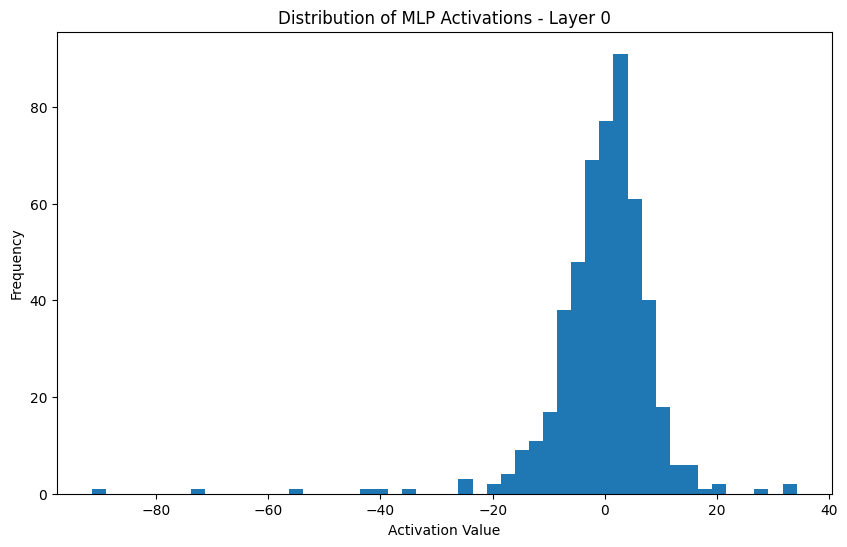

Layer 1 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 1 MLP Activation Stats:
  Mean: -0.3345
  Std Dev: 13.1445
  Min: -141.9754
  Max: 81.2478


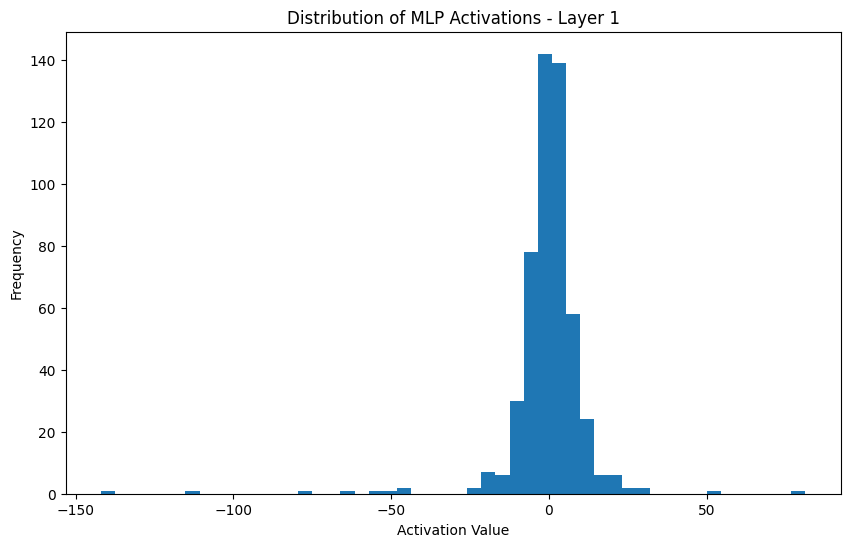

Layer 2 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 2 MLP Activation Stats:
  Mean: -0.5779
  Std Dev: 11.9063
  Min: -98.5052
  Max: 41.8011


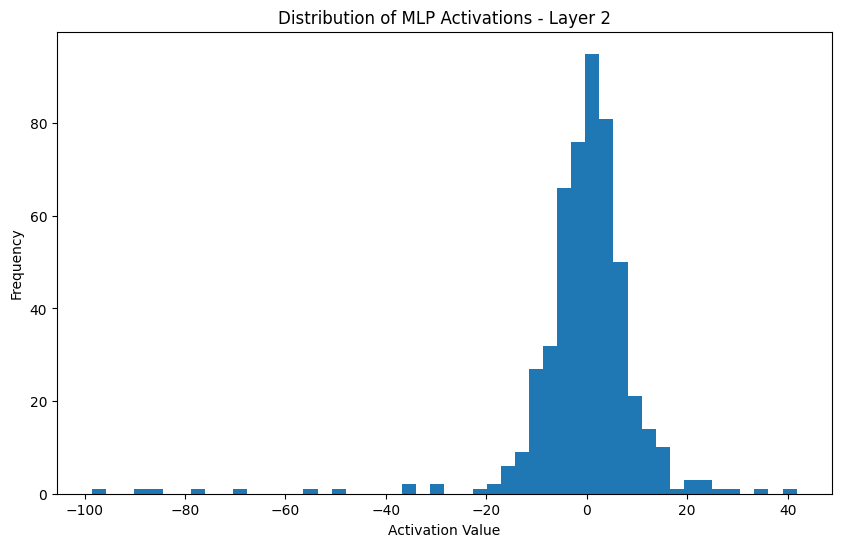

Layer 3 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 3 MLP Activation Stats:
  Mean: -0.5033
  Std Dev: 10.8872
  Min: -107.0511
  Max: 24.4853


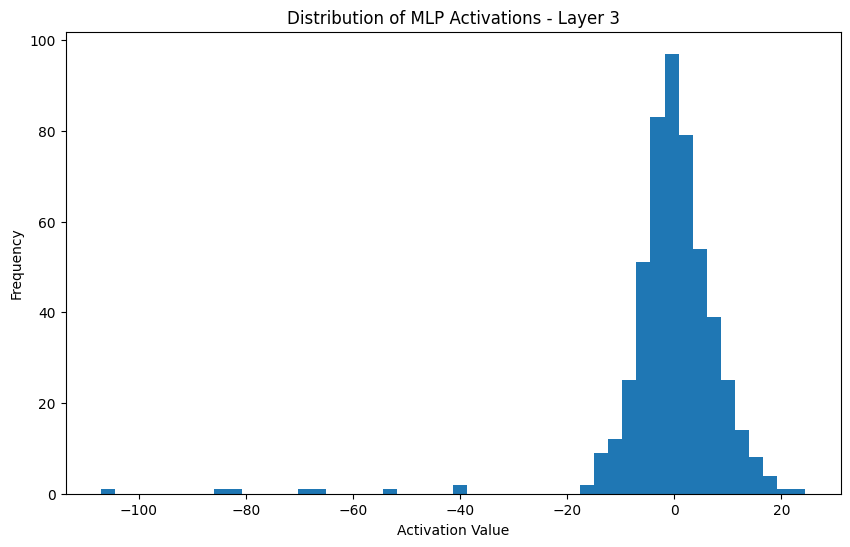

Layer 4 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 4 MLP Activation Stats:
  Mean: 0.0021
  Std Dev: 7.6051
  Min: -51.9969
  Max: 26.9494


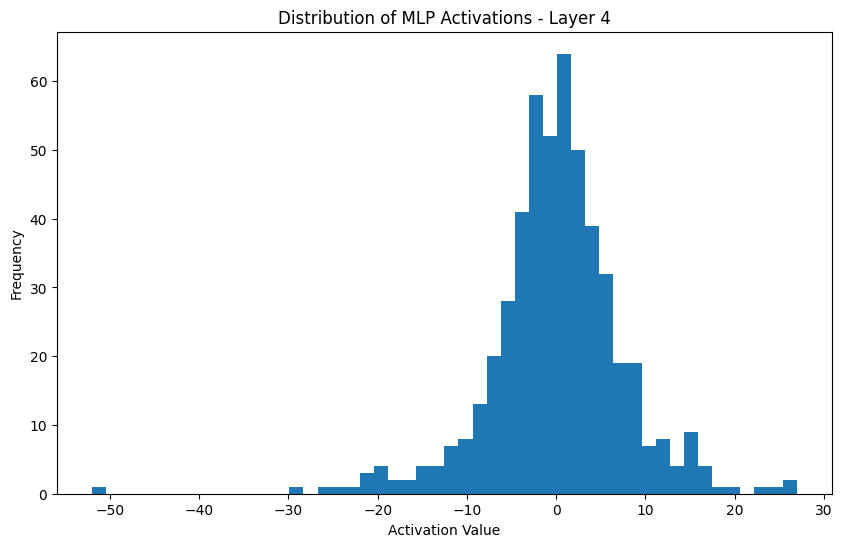

Layer 5 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 5 MLP Activation Stats:
  Mean: -0.0686
  Std Dev: 6.1314
  Min: -36.1769
  Max: 24.1865


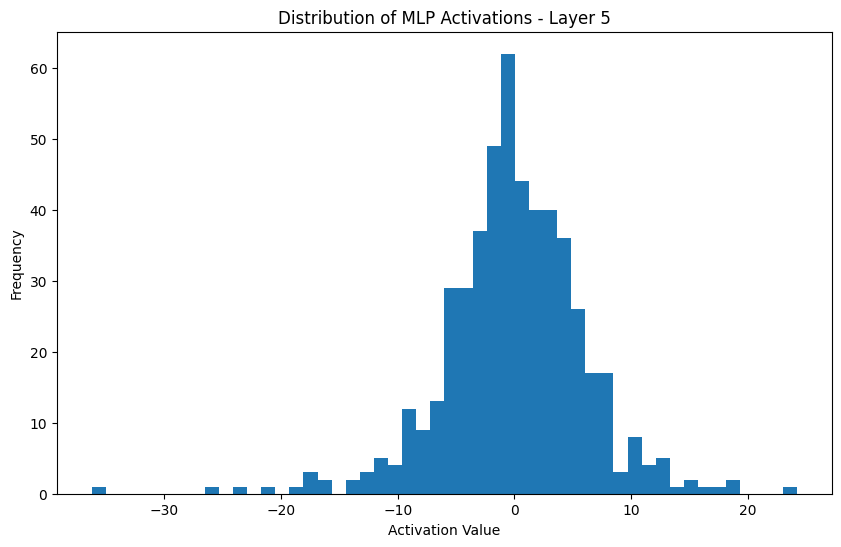

Layer 6 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 6 MLP Activation Stats:
  Mean: -0.1166
  Std Dev: 8.4425
  Min: -33.6911
  Max: 36.1603


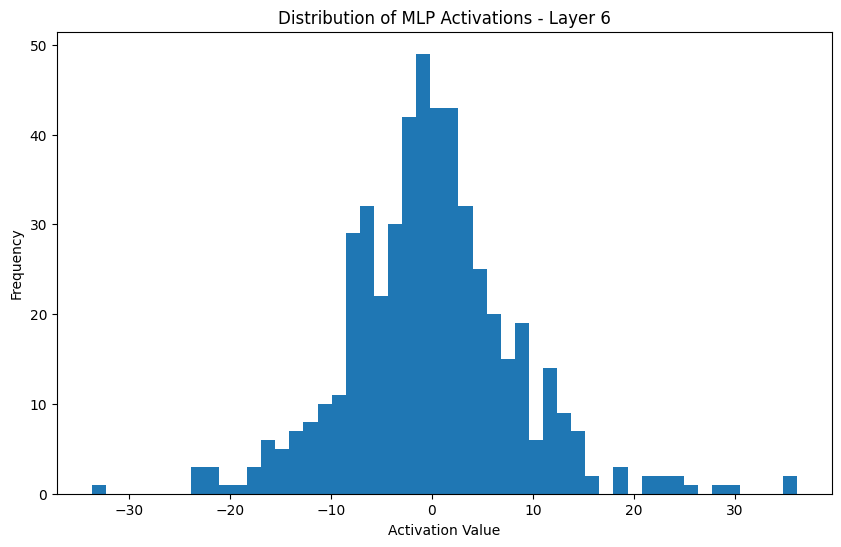

Layer 7 MLP Activations Shape: torch.Size([1, 4, 128])
Layer 7 MLP Activation Stats:
  Mean: 1.9908
  Std Dev: 43.9231
  Min: -204.5060
  Max: 609.1213


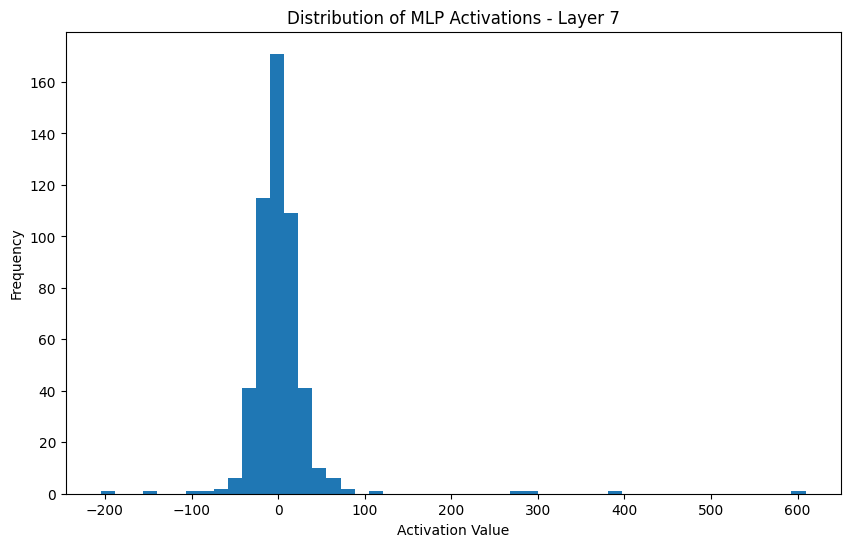


Analyzing Ablation Patterns:
Attention Ablations Shape: (1024, 128)
Neuron Ablations Shape: (4096, 128)


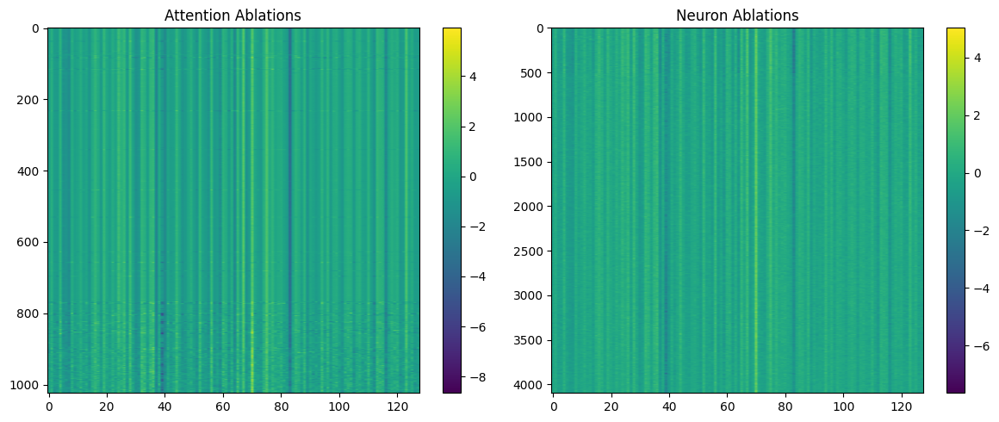

In [25]:
import torch
from transformers import GPT2Tokenizer
from transformer_lens import HookedTransformer, HookedTransformerConfig
from typing import List, Dict, Any
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ... [Previous code for PreTrainedGPTNeoWrapper remains the same] ...

# Load the pre-trained model
config = GPTNeoConfig(hidden_size=128)
model = GPTNeo(config)
model.load_state_dict(torch.load('best_model_128width_120000batches.pt', map_location=torch.device('cpu')))
model.eval()

# Initialize the wrapper with the pre-trained model
wrapped_model = PreTrainedGPTNeoWrapper(model)

# Example usage
input_text = "Once upon a time"
input_ids = wrapped_model.tokenizer(input_text, return_tensors="pt").input_ids

# Run with hooks and get various outputs
logits = wrapped_model.run_with_hooks(input_ids, return_type="logits")
loss = wrapped_model.run_with_hooks(input_ids, return_type="loss")
hook_data = wrapped_model.run_with_hooks(input_ids, return_type="hook_data")

# Analyze attention patterns
def analyze_attention(hook_data):
    for layer in range(wrapped_model.cfg.n_layers):
        attention_output = hook_data[f"blocks.{layer}.attn"]
        print(f"Layer {layer} Attention Output Type:", type(attention_output))
        print(f"Layer {layer} Attention Output Shape:", attention_output.shape if isinstance(attention_output, torch.Tensor) else [t.shape for t in attention_output])
        
        if isinstance(attention_output, tuple):
            # If it's a tuple, assume the last element is the attention weights
            attention_patterns = attention_output[-1]
        elif isinstance(attention_output, torch.Tensor):
            # If it's a tensor, assume it's already the attention weights
            attention_patterns = attention_output
        else:
            print(f"Unexpected attention output type for layer {layer}")
            continue
        
        if len(attention_patterns.shape) == 4:  # [batch, num_heads, seq_len, seq_len]
            visualize_attention(attention_patterns.squeeze(0), layer)
        elif len(attention_patterns.shape) == 3:  # [num_heads, seq_len, seq_len]
            visualize_attention(attention_patterns, layer)
        elif len(attention_patterns.shape) == 2:  # [seq_len, seq_len]
            visualize_attention(attention_patterns.unsqueeze(0), layer)
        else:
            print(f"Unexpected attention patterns shape for layer {layer}: {attention_patterns.shape}")

# Function to visualize attention patterns
def visualize_attention(attention_patterns, layer):
    num_heads = attention_patterns.shape[0]
    fig, axes = plt.subplots(1, num_heads, figsize=(5*num_heads, 5))
    if num_heads == 1:
        axes = [axes]
    for head in range(num_heads):
        attn = attention_patterns[head].detach().cpu().numpy()
        sns.heatmap(attn, cmap='viridis', ax=axes[head], square=True)
        axes[head].set_title(f'Layer {layer}, Head {head}')
        axes[head].set_xlabel('Key')
        axes[head].set_ylabel('Query')
    plt.tight_layout()
    plt.show()

# Analyze MLP activations
def analyze_mlp_activations(hook_data):
    for layer in range(wrapped_model.cfg.n_layers):
        mlp_activations = hook_data[f"blocks.{layer}.mlp"]
        print(f"Layer {layer} MLP Activations Shape:", mlp_activations.shape)
        
        activations = mlp_activations.detach().cpu().numpy()
        print(f"Layer {layer} MLP Activation Stats:")
        print(f"  Mean: {activations.mean():.4f}")
        print(f"  Std Dev: {activations.std():.4f}")
        print(f"  Min: {activations.min():.4f}")
        print(f"  Max: {activations.max():.4f}")
        
        plt.figure(figsize=(10, 6))
        plt.hist(activations.flatten(), bins=50)
        plt.title(f'Distribution of MLP Activations - Layer {layer}')
        plt.xlabel('Activation Value')
        plt.ylabel('Frequency')
        plt.show()

# Analyze ablation patterns
def analyze_ablations(model):
    attention_ablations = model.attention_ablations_head.weight.detach().cpu().numpy()
    neuron_ablations = model.neuron_ablations_head.weight.detach().cpu().numpy()
    
    print("Attention Ablations Shape:", attention_ablations.shape)
    print("Neuron Ablations Shape:", neuron_ablations.shape)
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(attention_ablations, cmap='viridis', aspect='auto')
    plt.title('Attention Ablations')
    plt.colorbar()
    
    plt.subplot(1, 2, 2)
    plt.imshow(neuron_ablations, cmap='viridis', aspect='auto')
    plt.title('Neuron Ablations')
    plt.colorbar()
    
    plt.tight_layout()
    plt.show()

print("Analyzing Attention Patterns:")
analyze_attention(hook_data)

print("\nAnalyzing MLP Activations:")
analyze_mlp_activations(hook_data)



# Interpretability Experiment 2

In [19]:
def visualize_raw_ablation_weights(model, show_layer_lines=True):
    attention_ablations = model.attention_ablations_head.weight.detach().cpu().numpy()
    neuron_ablations = model.neuron_ablations_head.weight.detach().cpu().numpy()
    
    print("Attention Ablations Shape:", attention_ablations.shape)
    print("Neuron Ablations Shape:", neuron_ablations.shape)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    
    # Attention Ablations
    im1 = ax1.imshow(attention_ablations, cmap='viridis', aspect='auto')
    ax1.set_title('Attention Ablations')
    ax1.set_xlabel('Hidden Dimensions (0-127)')
    ax1.set_ylabel('Layer * Head * Dim per Head (8 * 16 * 8)')
    fig.colorbar(im1, ax=ax1, label='Ablation Weight')
    
    # Add lines to separate layers in attention ablations
    if show_layer_lines:
        for i in range(1, 8):
            ax1.axhline(y=i*16*8, color='r', linestyle='--', linewidth=0.5)
    
    # Neuron Ablations
    im2 = ax2.imshow(neuron_ablations, cmap='viridis', aspect='auto')
    ax2.set_title('Neuron Ablations')
    ax2.set_xlabel('Hidden Dimensions (0-127)')
    ax2.set_ylabel('Layer * MLP Size (8 * 512)')
    fig.colorbar(im2, ax=ax2, label='Ablation Weight')
    
    # Add lines to separate layers in neuron ablations
    if show_layer_lines:
        for i in range(1, 8):
            ax2.axhline(y=i*512, color='r', linestyle='--', linewidth=0.5)
    
    plt.tight_layout()
    plt.show()
    
    # Additional analysis
    print("\nAttention Ablations Stats:")
    print(f" Mean: {attention_ablations.mean():.4f}")
    print(f" Std Dev: {attention_ablations.std():.4f}")
    print(f" Min: {attention_ablations.min():.4f}")
    print(f" Max: {attention_ablations.max():.4f}")
    
    print("\nNeuron Ablations Stats:")
    print(f" Mean: {neuron_ablations.mean():.4f}")
    print(f" Std Dev: {neuron_ablations.std():.4f}")
    print(f" Min: {neuron_ablations.min():.4f}")
    print(f" Max: {neuron_ablations.max():.4f}")
    
    # Analyze distribution of ablation weights
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    ax1.hist(attention_ablations.flatten(), bins=50, edgecolor='black')
    ax1.set_title('Distribution of Attention Ablation Weights')
    ax1.set_xlabel('Weight Value')
    ax1.set_ylabel('Frequency')
    
    ax2.hist(neuron_ablations.flatten(), bins=50, edgecolor='black')
    ax2.set_title('Distribution of Neuron Ablation Weights')
    ax2.set_xlabel('Weight Value')
    ax2.set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()



Attention Ablations Shape: (1024, 128)
Neuron Ablations Shape: (4096, 128)


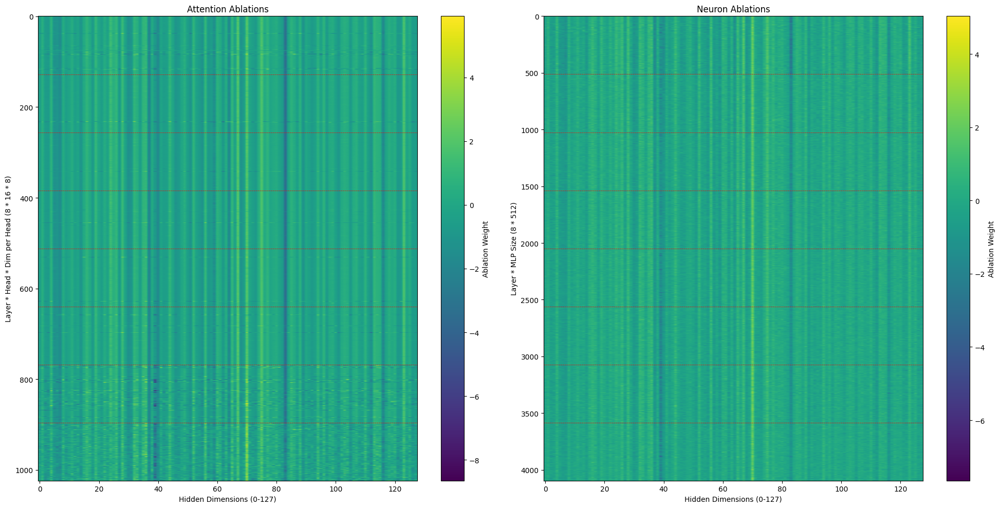


Attention Ablations Stats:
 Mean: -0.1107
 Std Dev: 0.9126
 Min: -8.6540
 Max: 5.9265

Neuron Ablations Stats:
 Mean: -0.0703
 Std Dev: 0.7238
 Min: -7.6510
 Max: 5.0362


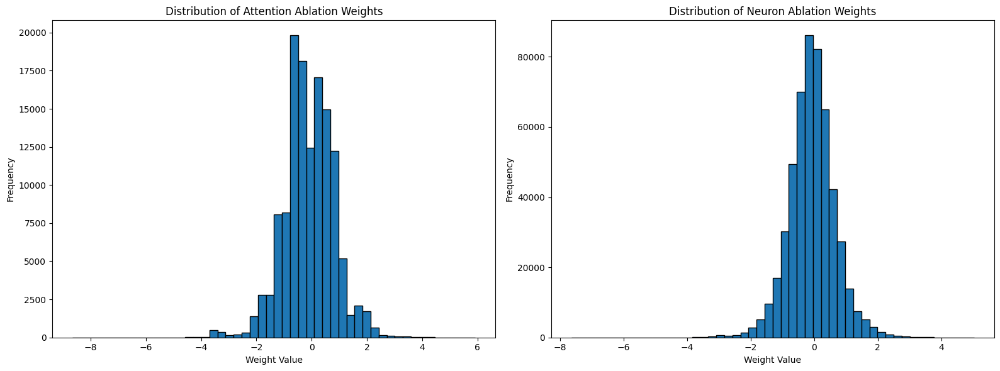

In [20]:
visualize_raw_ablation_weights(model, show_layer_lines=True)  # With layer lines

Attention Ablations Shape: (1024, 128)
Neuron Ablations Shape: (4096, 128)


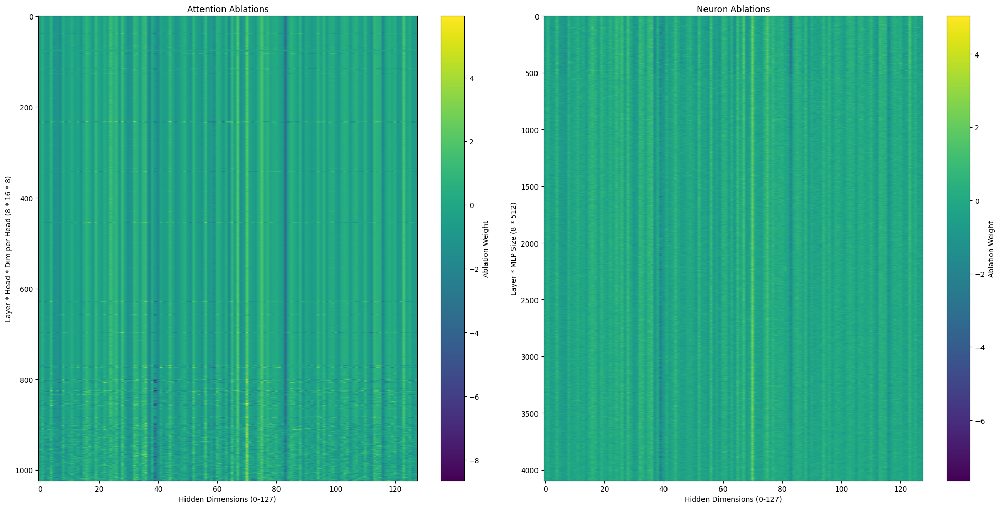


Attention Ablations Stats:
 Mean: -0.1107
 Std Dev: 0.9126
 Min: -8.6540
 Max: 5.9265

Neuron Ablations Stats:
 Mean: -0.0703
 Std Dev: 0.7238
 Min: -7.6510
 Max: 5.0362


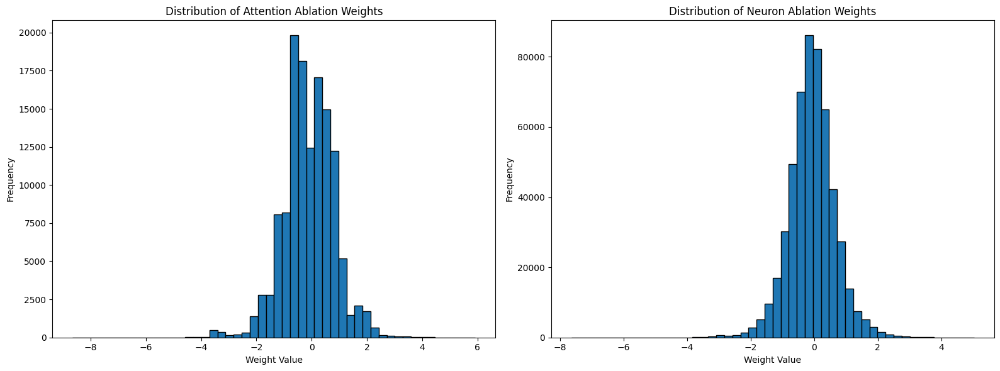

In [21]:
visualize_raw_ablation_weights(model, show_layer_lines=False)  # Without layer lines

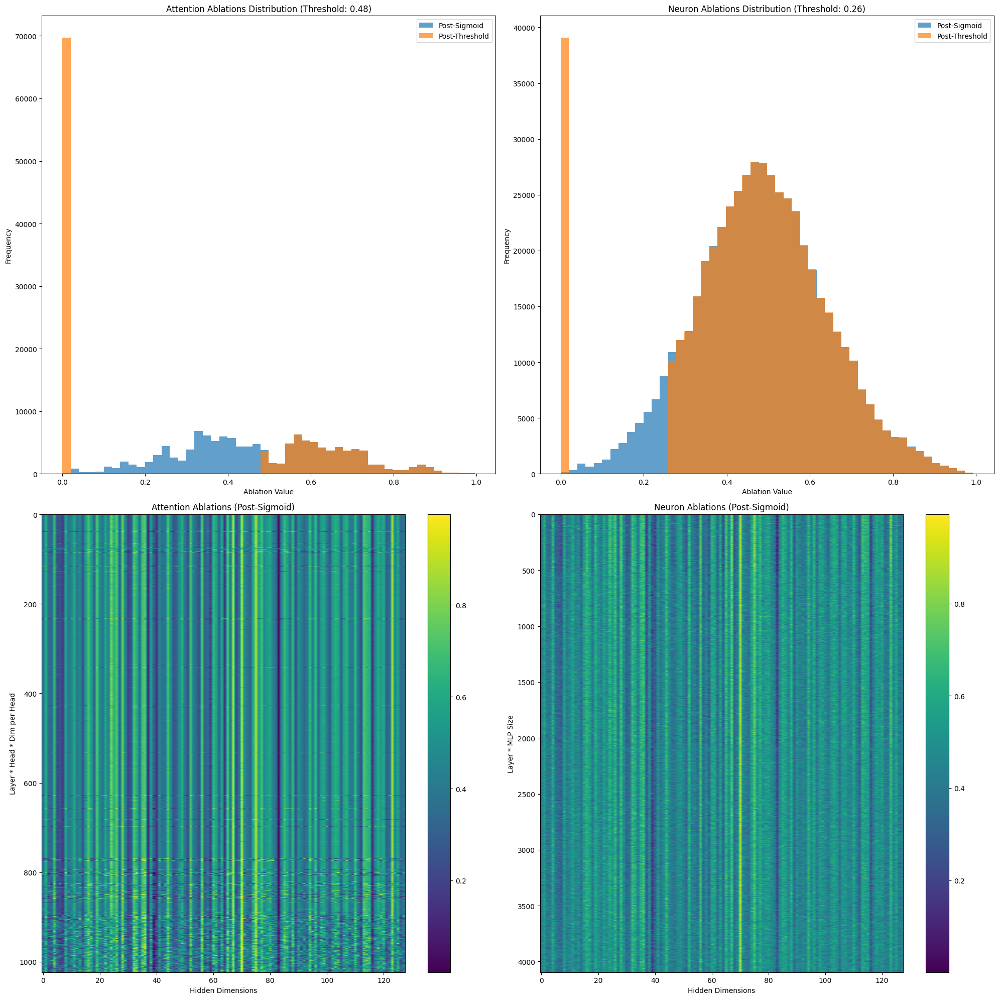

Attention Ablations (Threshold: 0.48):
  Post-Sigmoid Mean: 0.4771
  Post-Sigmoid Std: 0.1882
  Post-Threshold Mean: 0.3023
  Post-Threshold Std: 0.3298
  Fraction of non-zero values: 0.4680

Neuron Ablations (Threshold: 0.26):
  Post-Sigmoid Mean: 0.4841
  Post-Sigmoid Std: 0.1561
  Post-Threshold Mean: 0.4697
  Post-Threshold Std: 0.1873
  Fraction of non-zero values: 0.9254


In [17]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def visualize_ablation_distributions(model, attention_threshold=0.5, mlp_threshold=0.5):
    attention_ablations = model.attention_ablations_head.weight.detach().cpu().numpy()
    neuron_ablations = model.neuron_ablations_head.weight.detach().cpu().numpy()

    def process_ablations(ablations, threshold):
        sigmoid_output = 1 / (1 + np.exp(-ablations))
        thresholded_output = np.where(sigmoid_output > threshold, sigmoid_output, 0)
        return sigmoid_output, thresholded_output

    att_sigmoid, att_thresholded = process_ablations(attention_ablations, attention_threshold)
    neu_sigmoid, neu_thresholded = process_ablations(neuron_ablations, mlp_threshold)

    fig, axes = plt.subplots(2, 2, figsize=(20, 20))
    
    # Attention Ablations
    axes[0, 0].hist(att_sigmoid.flatten(), bins=50, alpha=0.7, label='Post-Sigmoid')
    axes[0, 0].hist(att_thresholded.flatten(), bins=50, alpha=0.7, label='Post-Threshold')
    axes[0, 0].set_title(f'Attention Ablations Distribution (Threshold: {attention_threshold})')
    axes[0, 0].set_xlabel('Ablation Value')
    axes[0, 0].set_ylabel('Frequency')
    axes[0, 0].legend()

    # Neuron Ablations
    axes[0, 1].hist(neu_sigmoid.flatten(), bins=50, alpha=0.7, label='Post-Sigmoid')
    axes[0, 1].hist(neu_thresholded.flatten(), bins=50, alpha=0.7, label='Post-Threshold')
    axes[0, 1].set_title(f'Neuron Ablations Distribution (Threshold: {mlp_threshold})')
    axes[0, 1].set_xlabel('Ablation Value')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].legend()

    # Attention Ablations Heatmap
    im1 = axes[1, 0].imshow(att_sigmoid, cmap='viridis', aspect='auto')
    axes[1, 0].set_title('Attention Ablations (Post-Sigmoid)')
    axes[1, 0].set_xlabel('Hidden Dimensions')
    axes[1, 0].set_ylabel('Layer * Head * Dim per Head')
    plt.colorbar(im1, ax=axes[1, 0])

    # Neuron Ablations Heatmap
    im2 = axes[1, 1].imshow(neu_sigmoid, cmap='viridis', aspect='auto')
    axes[1, 1].set_title('Neuron Ablations (Post-Sigmoid)')
    axes[1, 1].set_xlabel('Hidden Dimensions')
    axes[1, 1].set_ylabel('Layer * MLP Size')
    plt.colorbar(im2, ax=axes[1, 1])

    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"Attention Ablations (Threshold: {attention_threshold}):")
    print(f"  Post-Sigmoid Mean: {att_sigmoid.mean():.4f}")
    print(f"  Post-Sigmoid Std: {att_sigmoid.std():.4f}")
    print(f"  Post-Threshold Mean: {att_thresholded.mean():.4f}")
    print(f"  Post-Threshold Std: {att_thresholded.std():.4f}")
    print(f"  Fraction of non-zero values: {np.mean(att_thresholded > 0):.4f}")

    print(f"\nNeuron Ablations (Threshold: {mlp_threshold}):")
    print(f"  Post-Sigmoid Mean: {neu_sigmoid.mean():.4f}")
    print(f"  Post-Sigmoid Std: {neu_sigmoid.std():.4f}")
    print(f"  Post-Threshold Mean: {neu_thresholded.mean():.4f}")
    print(f"  Post-Threshold Std: {neu_thresholded.std():.4f}")
    print(f"  Fraction of non-zero values: {np.mean(neu_thresholded > 0):.4f}")

# Usage:
visualize_ablation_distributions(model, attention_threshold=0.48, mlp_threshold=0.26) # The values used to train the current model
#visualize_ablation_distributions(model, attention_threshold=0, mlp_threshold=0)

/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/ipykernel_55320/2034821998.py:63: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model


Analyzing Layer 0
  Query Weight Stats:
    Mean: -0.0012
    Std Dev: 0.4728
    Min: -2.9774
    Max: 3.4944
  Key Weight Stats:
    Mean: -0.0011
    Std Dev: 0.2676
    Min: -2.3834
    Max: 2.0326
  Value Weight Stats:
    Mean: -0.0007
    Std Dev: 0.4363
    Min: -2.2296
    Max: 3.2676
  Output Weight Stats:
    Mean: 0.0003
    Std Dev: 0.5450
    Min: -4.1976
    Max: 3.0368


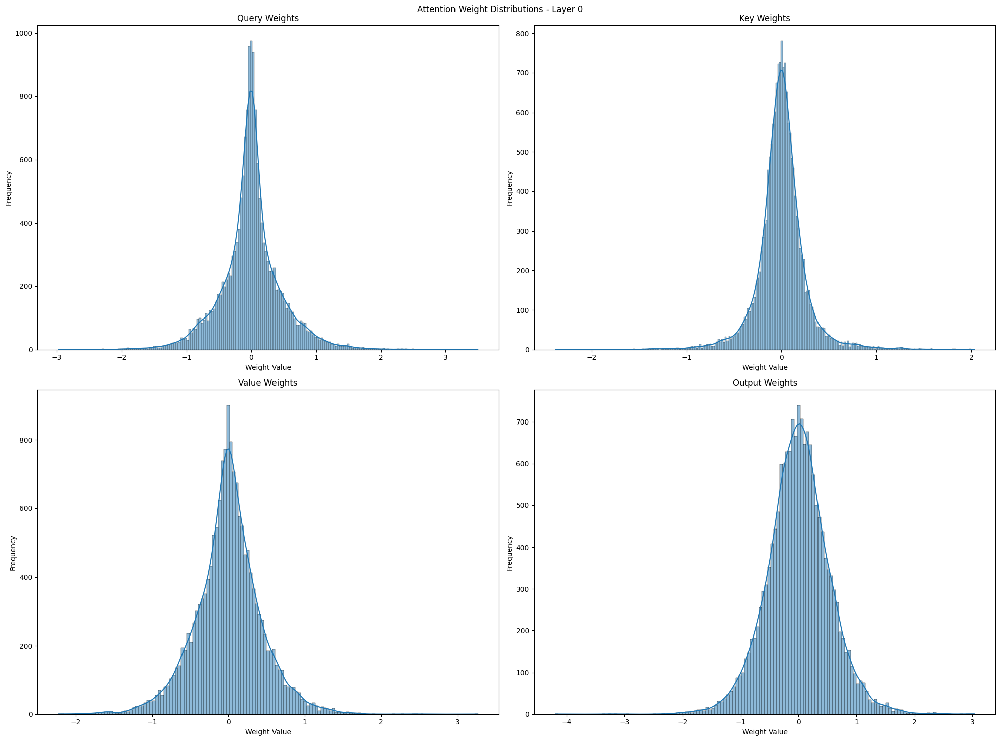

  MLP Fc Weight Stats:
    Mean: -0.0116
    Std Dev: 0.8008
    Min: -5.0845
    Max: 5.9387
  MLP Proj Weight Stats:
    Mean: 0.0006
    Std Dev: 0.7546
    Min: -7.0891
    Max: 10.2818


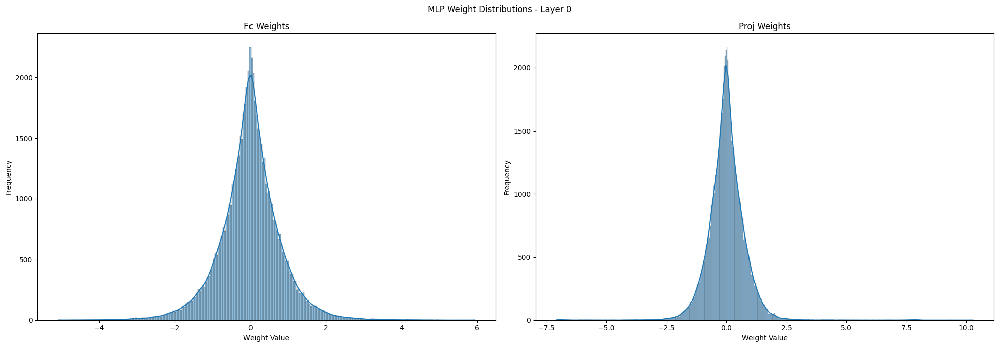


Analyzing Layer 1
  Query Weight Stats:
    Mean: 0.0010
    Std Dev: 0.3994
    Min: -2.5147
    Max: 2.2225
  Key Weight Stats:
    Mean: -0.0001
    Std Dev: 0.6027
    Min: -7.2898
    Max: 7.0608
  Value Weight Stats:
    Mean: -0.0010
    Std Dev: 0.3648
    Min: -2.2035
    Max: 3.9349
  Output Weight Stats:
    Mean: 0.0002
    Std Dev: 0.3836
    Min: -5.0230
    Max: 5.7130


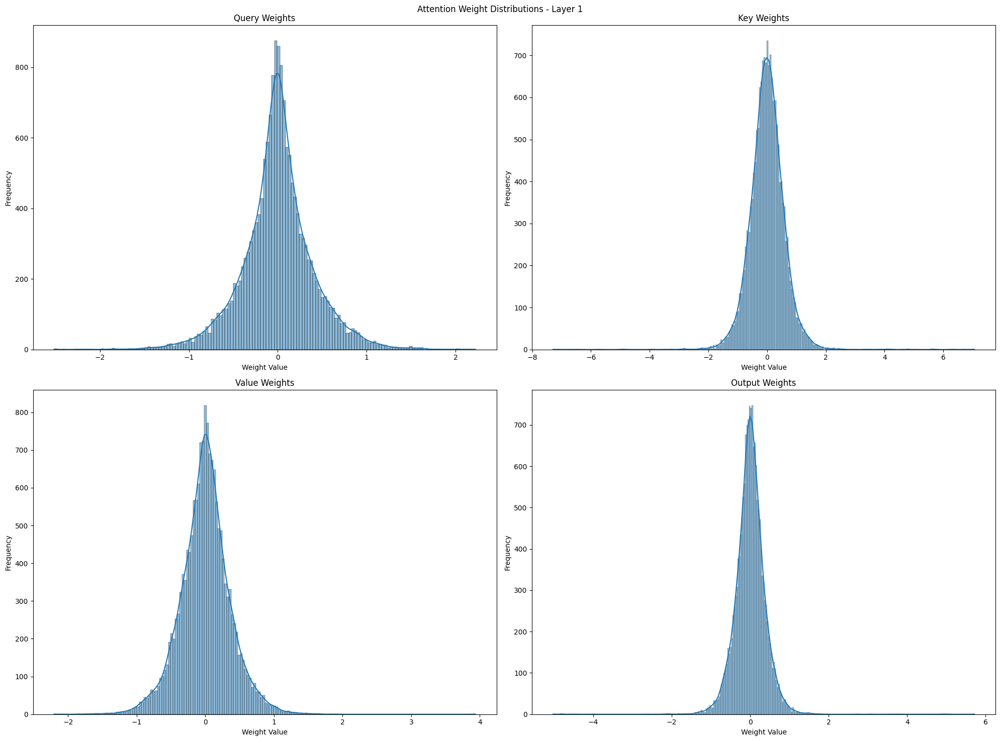

  MLP Fc Weight Stats:
    Mean: -0.0061
    Std Dev: 0.8108
    Min: -4.8366
    Max: 6.1421
  MLP Proj Weight Stats:
    Mean: -0.0015
    Std Dev: 1.0565
    Min: -8.5665
    Max: 8.4587


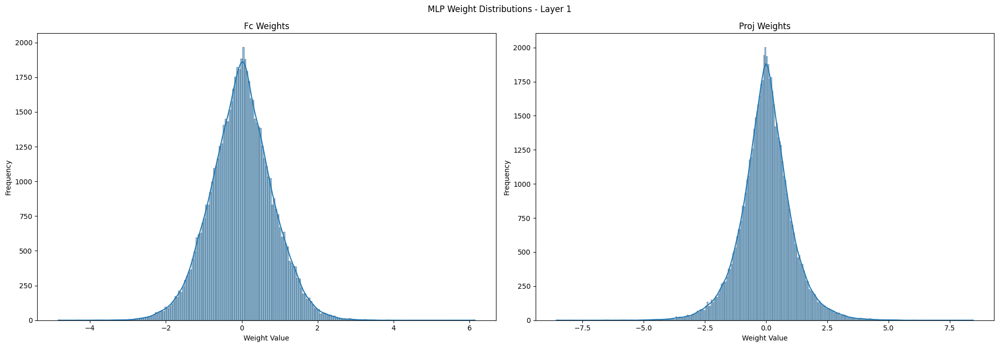


Analyzing Layer 2
  Query Weight Stats:
    Mean: -0.0034
    Std Dev: 0.5397
    Min: -2.7916
    Max: 2.4846
  Key Weight Stats:
    Mean: -0.0011
    Std Dev: 0.6283
    Min: -8.7158
    Max: 8.4645
  Value Weight Stats:
    Mean: -0.0028
    Std Dev: 0.4275
    Min: -2.1945
    Max: 3.5402
  Output Weight Stats:
    Mean: 0.0000
    Std Dev: 0.4496
    Min: -2.4231
    Max: 7.1515


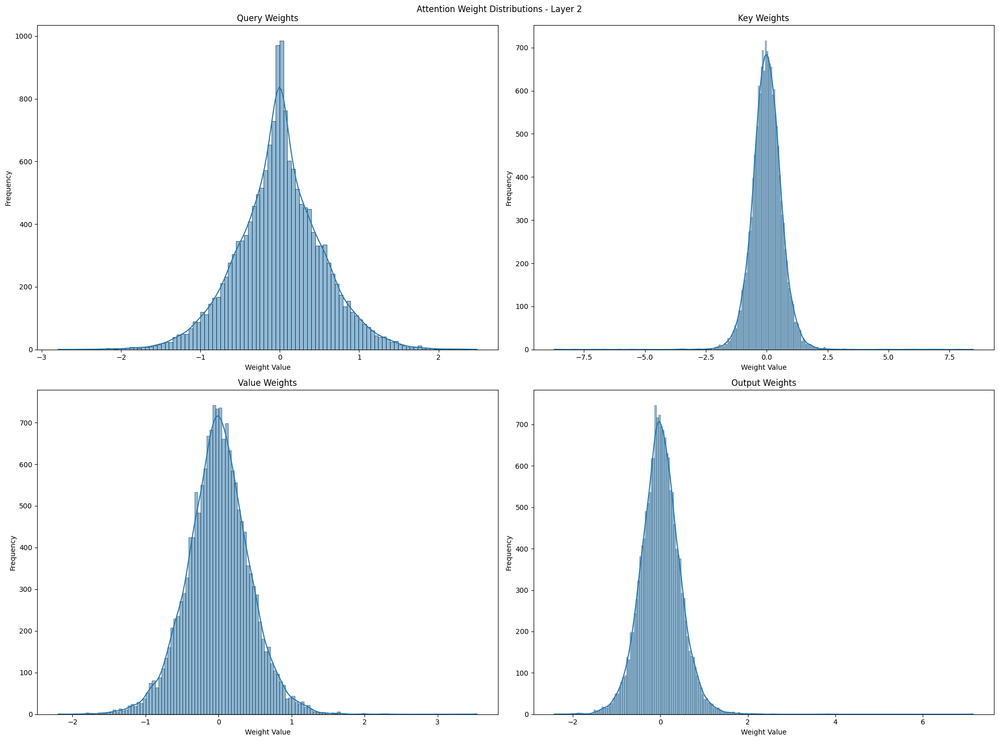

  MLP Fc Weight Stats:
    Mean: 0.0269
    Std Dev: 0.8798
    Min: -4.9900
    Max: 4.7653
  MLP Proj Weight Stats:
    Mean: -0.0037
    Std Dev: 1.1171
    Min: -9.7379
    Max: 7.5611


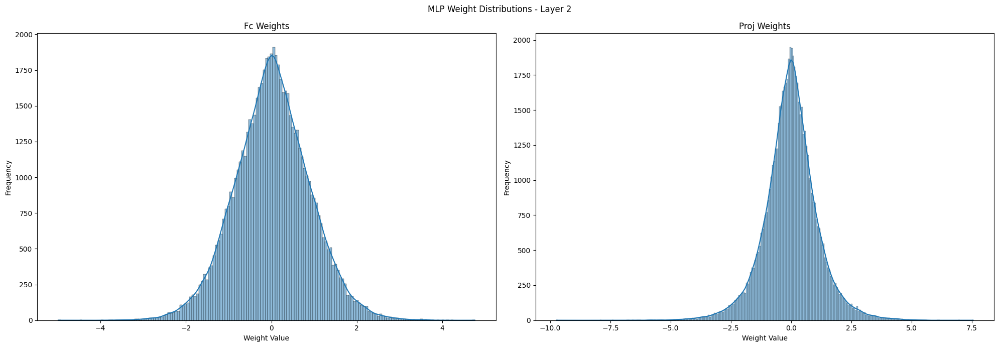


Analyzing Layer 3
  Query Weight Stats:
    Mean: 0.0010
    Std Dev: 0.6539
    Min: -3.0961
    Max: 3.5870
  Key Weight Stats:
    Mean: -0.0067
    Std Dev: 0.7083
    Min: -12.3315
    Max: 8.2524
  Value Weight Stats:
    Mean: 0.0015
    Std Dev: 0.5265
    Min: -5.6193
    Max: 3.1900
  Output Weight Stats:
    Mean: -0.0002
    Std Dev: 0.5346
    Min: -12.2327
    Max: 9.6666


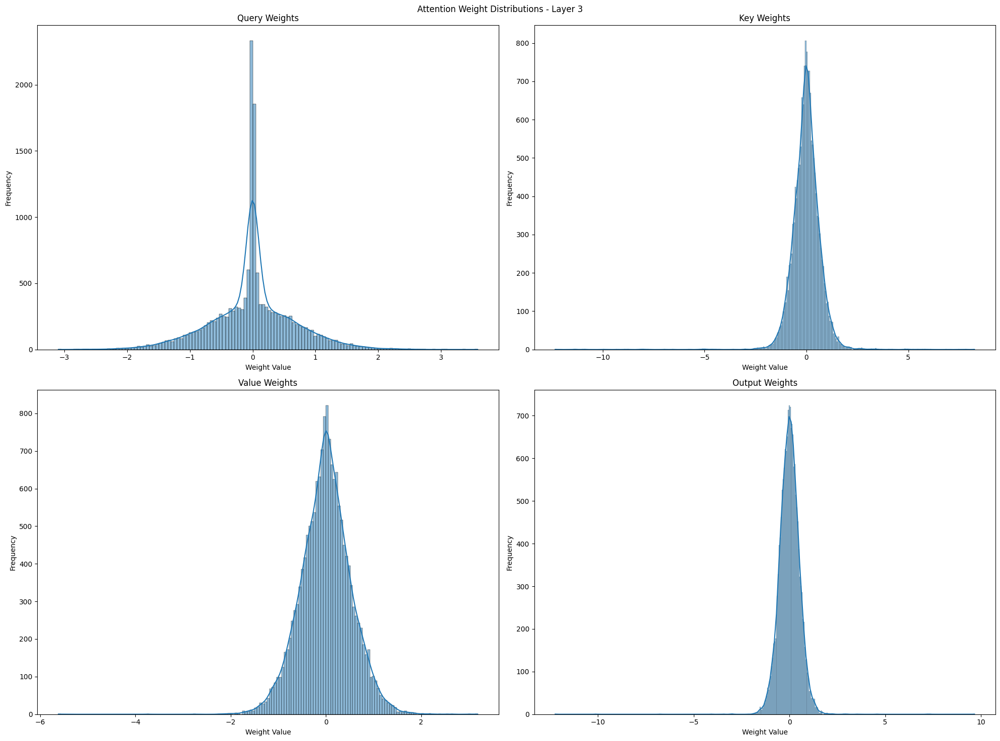

  MLP Fc Weight Stats:
    Mean: 0.0182
    Std Dev: 0.9023
    Min: -4.2093
    Max: 4.6193
  MLP Proj Weight Stats:
    Mean: -0.0019
    Std Dev: 1.0977
    Min: -8.4558
    Max: 7.5592


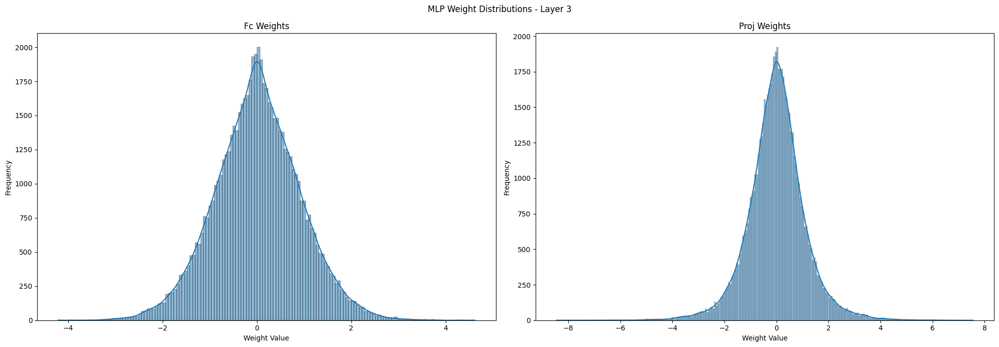


Analyzing Layer 4
  Query Weight Stats:
    Mean: -0.0023
    Std Dev: 0.5762
    Min: -2.7822
    Max: 2.5625
  Key Weight Stats:
    Mean: 0.0028
    Std Dev: 0.7418
    Min: -19.6436
    Max: 13.2518
  Value Weight Stats:
    Mean: -0.0009
    Std Dev: 0.5336
    Min: -2.5071
    Max: 2.2609
  Output Weight Stats:
    Mean: -0.0007
    Std Dev: 0.5596
    Min: -7.0370
    Max: 6.8439


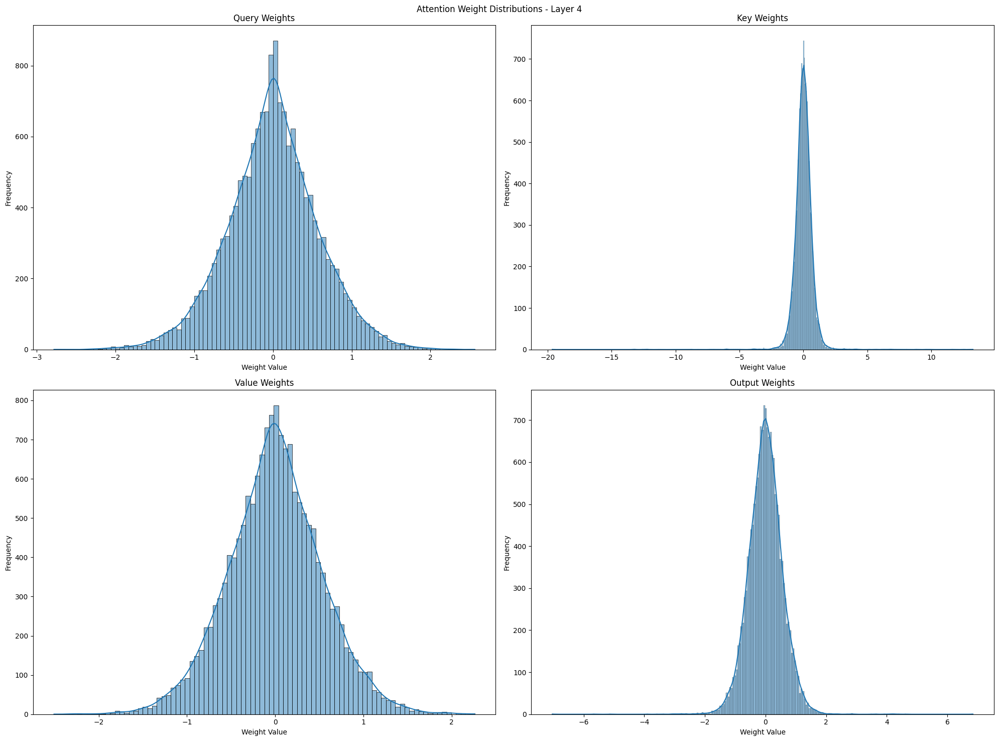

  MLP Fc Weight Stats:
    Mean: -0.0076
    Std Dev: 0.9074
    Min: -4.3618
    Max: 3.9275
  MLP Proj Weight Stats:
    Mean: -0.0012
    Std Dev: 0.9573
    Min: -6.6199
    Max: 6.2115


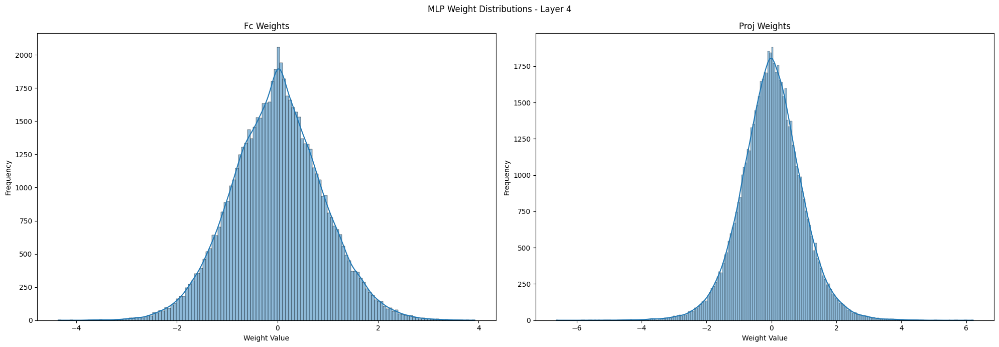


Analyzing Layer 5
  Query Weight Stats:
    Mean: -0.0008
    Std Dev: 0.5610
    Min: -3.2024
    Max: 2.3781
  Key Weight Stats:
    Mean: -0.0016
    Std Dev: 0.7711
    Min: -18.6373
    Max: 16.9694
  Value Weight Stats:
    Mean: 0.0030
    Std Dev: 0.5722
    Min: -2.1852
    Max: 2.5754
  Output Weight Stats:
    Mean: -0.0006
    Std Dev: 0.5790
    Min: -2.6022
    Max: 2.2335


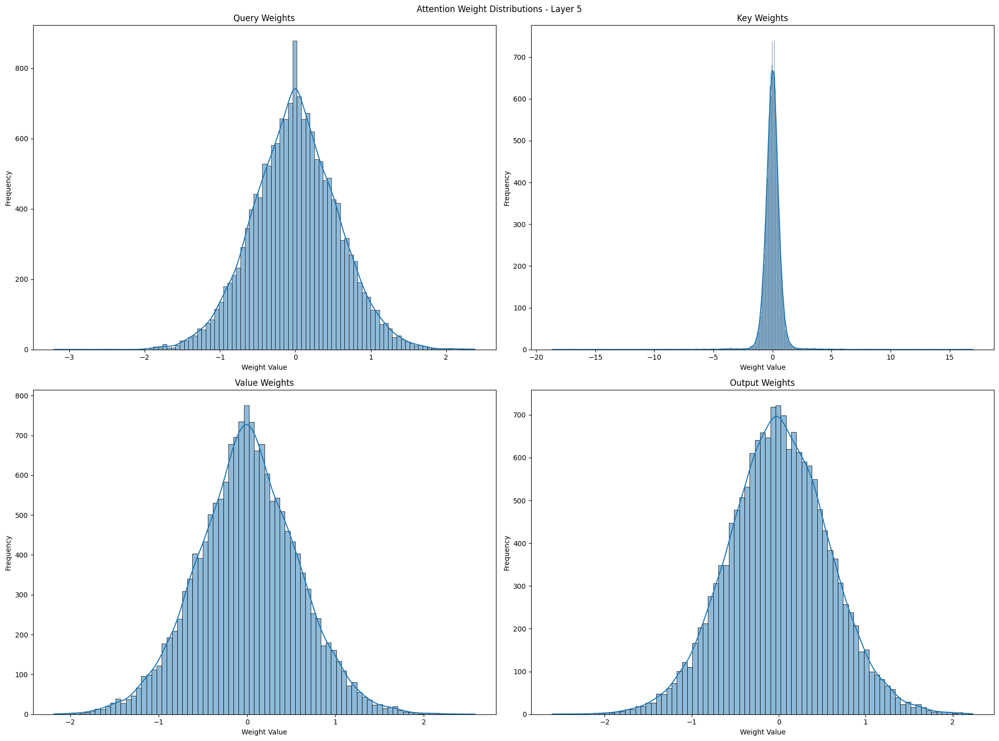

  MLP Fc Weight Stats:
    Mean: -0.0082
    Std Dev: 0.9081
    Min: -4.7419
    Max: 5.2952
  MLP Proj Weight Stats:
    Mean: 0.0006
    Std Dev: 0.9677
    Min: -6.5041
    Max: 5.9862


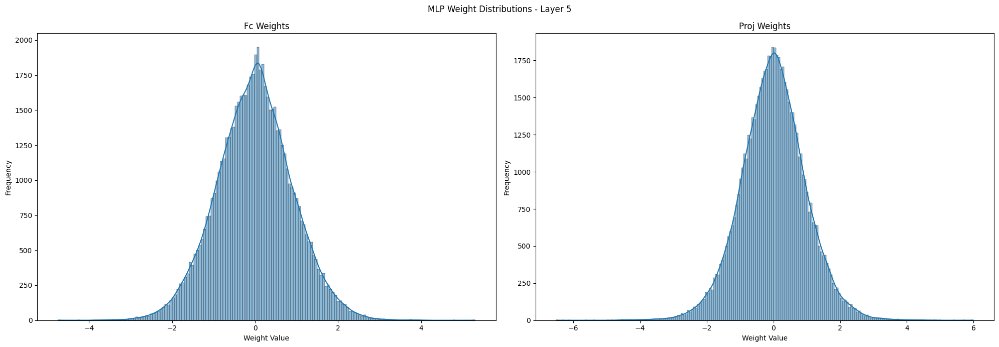


Analyzing Layer 6
  Query Weight Stats:
    Mean: -0.0005
    Std Dev: 0.5605
    Min: -2.6176
    Max: 3.3342
  Key Weight Stats:
    Mean: -0.0024
    Std Dev: 0.7531
    Min: -17.5302
    Max: 15.2580
  Value Weight Stats:
    Mean: -0.0005
    Std Dev: 0.6943
    Min: -2.7012
    Max: 2.7977
  Output Weight Stats:
    Mean: 0.0011
    Std Dev: 0.7022
    Min: -3.4223
    Max: 3.7081


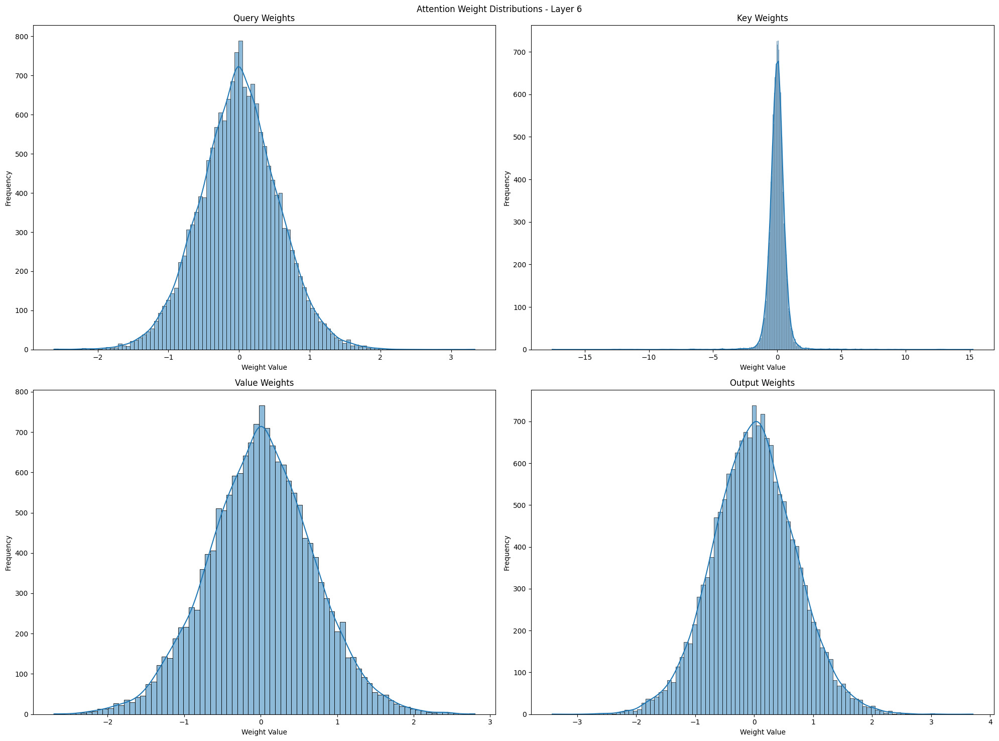

  MLP Fc Weight Stats:
    Mean: -0.0148
    Std Dev: 0.8661
    Min: -4.0938
    Max: 3.7978
  MLP Proj Weight Stats:
    Mean: -0.0008
    Std Dev: 1.0028
    Min: -6.5748
    Max: 6.1782


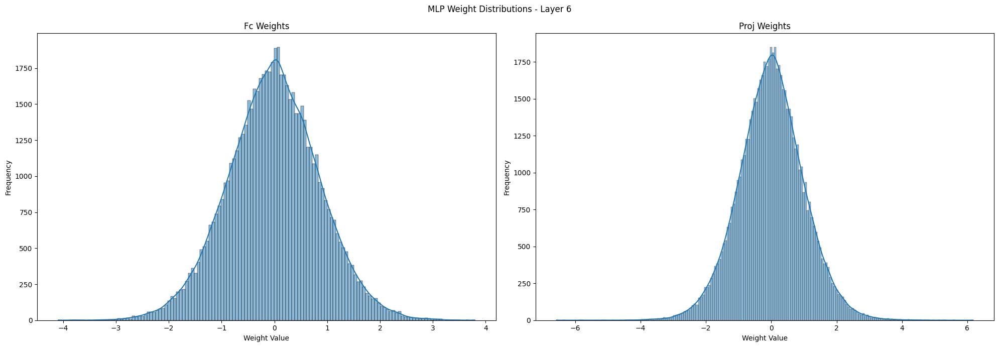


Analyzing Layer 7
  Query Weight Stats:
    Mean: 0.0046
    Std Dev: 0.4228
    Min: -1.6711
    Max: 1.7293
  Key Weight Stats:
    Mean: -0.0011
    Std Dev: 0.5889
    Min: -10.7586
    Max: 10.0460
  Value Weight Stats:
    Mean: 0.0002
    Std Dev: 1.1141
    Min: -6.8373
    Max: 6.1923
  Output Weight Stats:
    Mean: 0.0006
    Std Dev: 1.0009
    Min: -7.2053
    Max: 6.7102


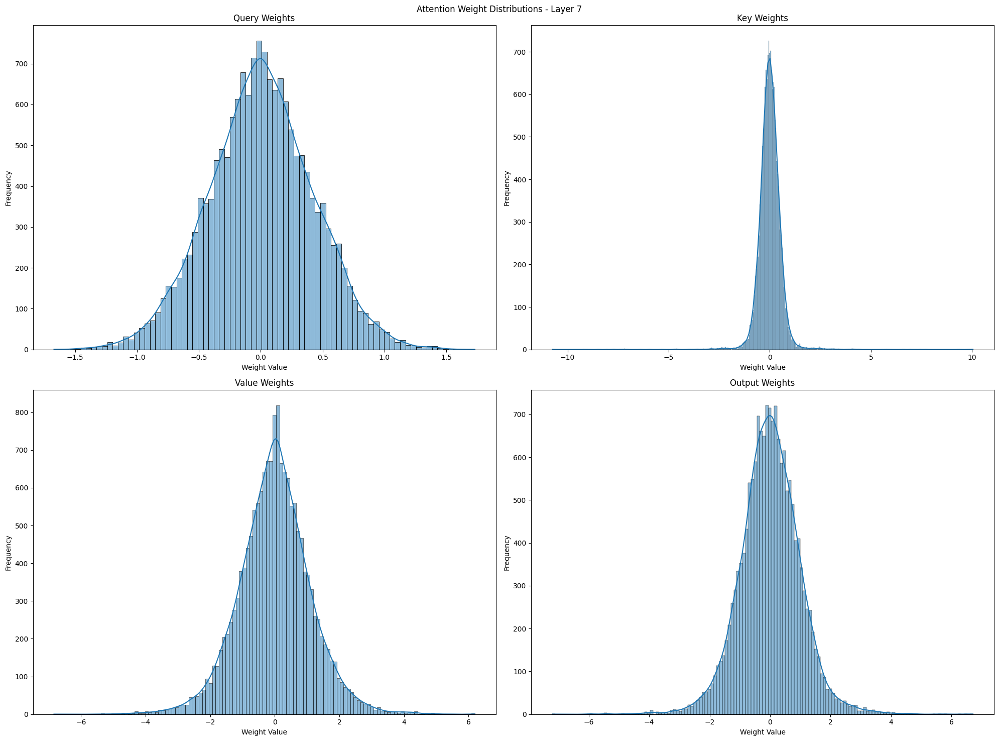

  MLP Fc Weight Stats:
    Mean: -0.0085
    Std Dev: 0.8179
    Min: -5.2819
    Max: 3.6912
  MLP Proj Weight Stats:
    Mean: -0.0017
    Std Dev: 0.8217
    Min: -9.3041
    Max: 9.9297


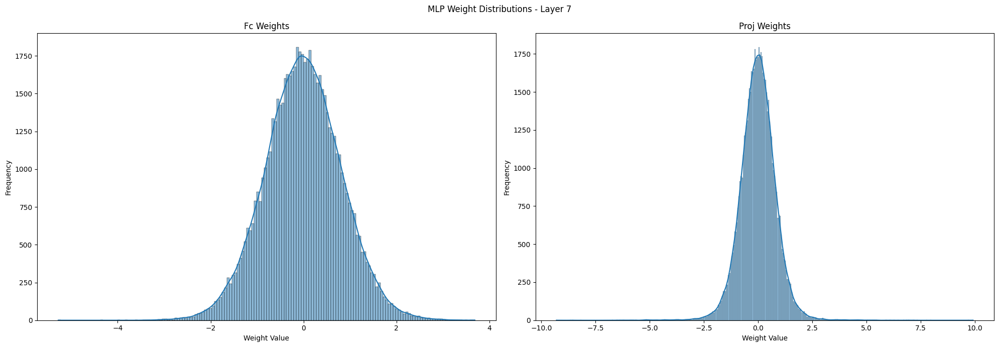

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_transformer_weight_distribution(model):
    for layer_idx, layer in enumerate(model.transformer.h):
        print(f"\nAnalyzing Layer {layer_idx}")
        
        # Analyze Attention Weights
        attention_weights = {
            'query': layer.attn.attention.q_proj.weight,
            'key': layer.attn.attention.k_proj.weight,
            'value': layer.attn.attention.v_proj.weight,
            'output': layer.attn.attention.out_proj.weight
        }
        
        fig, axes = plt.subplots(2, 2, figsize=(20, 15))
        fig.suptitle(f'Attention Weight Distributions - Layer {layer_idx}')
        
        for (name, weight), ax in zip(attention_weights.items(), axes.flatten()):
            weight_data = weight.detach().cpu().numpy().flatten()
            sns.histplot(weight_data, kde=True, ax=ax)
            ax.set_title(f'{name.capitalize()} Weights')
            ax.set_xlabel('Weight Value')
            ax.set_ylabel('Frequency')
            
            print(f"  {name.capitalize()} Weight Stats:")
            print(f"    Mean: {weight_data.mean():.4f}")
            print(f"    Std Dev: {weight_data.std():.4f}")
            print(f"    Min: {weight_data.min():.4f}")
            print(f"    Max: {weight_data.max():.4f}")
        
        plt.tight_layout()
        plt.show()
        
        # Analyze MLP Weights
        mlp_weights = {
            'fc': layer.mlp.c_fc.weight,
            'proj': layer.mlp.c_proj.weight
        }
        
        fig, axes = plt.subplots(1, 2, figsize=(20, 7))
        fig.suptitle(f'MLP Weight Distributions - Layer {layer_idx}')
        
        for (name, weight), ax in zip(mlp_weights.items(), axes):
            weight_data = weight.detach().cpu().numpy().flatten()
            sns.histplot(weight_data, kde=True, ax=ax)
            ax.set_title(f'{name.capitalize()} Weights')
            ax.set_xlabel('Weight Value')
            ax.set_ylabel('Frequency')
            
            print(f"  MLP {name.capitalize()} Weight Stats:")
            print(f"    Mean: {weight_data.mean():.4f}")
            print(f"    Std Dev: {weight_data.std():.4f}")
            print(f"    Min: {weight_data.min():.4f}")
            print(f"    Max: {weight_data.max():.4f}")
        
        plt.tight_layout()
        plt.show()

# Usage:
config = GPTNeoConfig(hidden_size=128)
model = GPTNeo(config)
model.load_state_dict(torch.load('best_model_128width_120000batches.pt', map_location=torch.device('cpu')))
model.eval()
analyze_transformer_weight_distribution(model)



Analyzing transformer.h.0.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 0.9914
  Std Dev: 0.0329
  Min: 0.9226
  Max: 1.1399


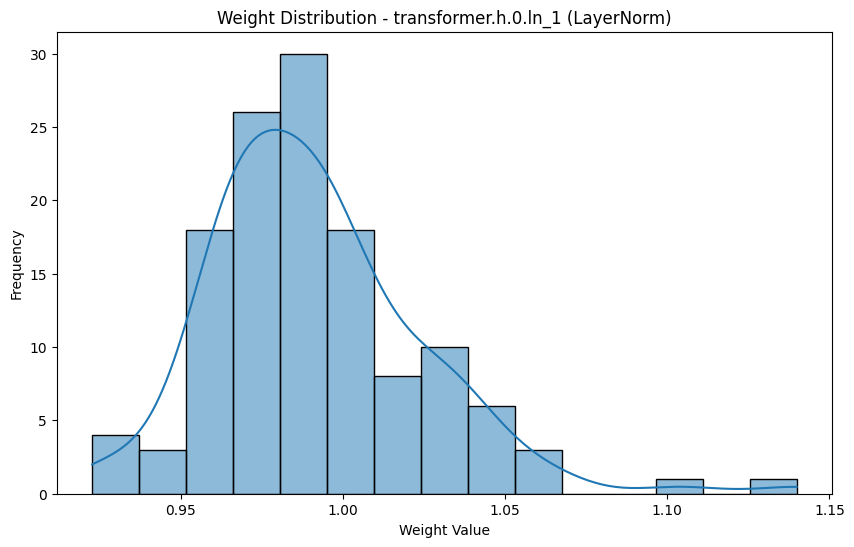


Analyzing transformer.h.0.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0303
  Min: -0.1570
  Max: 0.2204


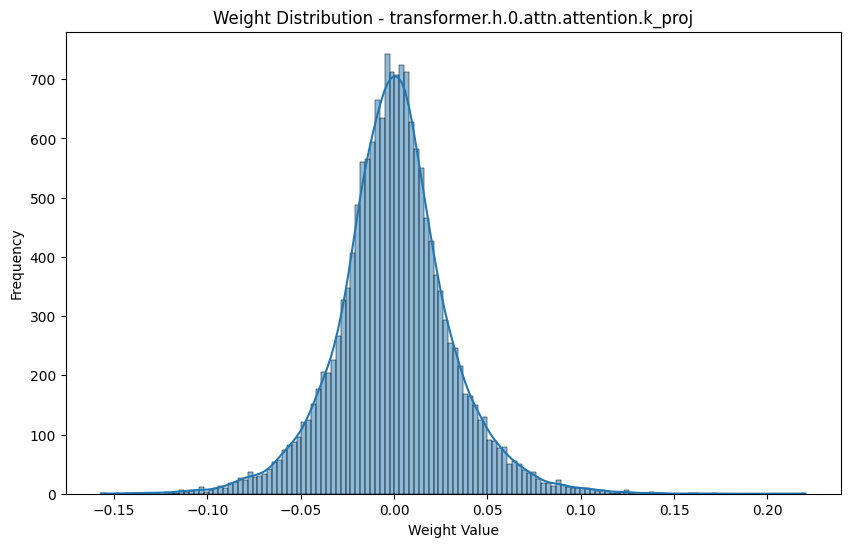


Analyzing transformer.h.0.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0147
  Min: -0.0600
  Max: 0.0809


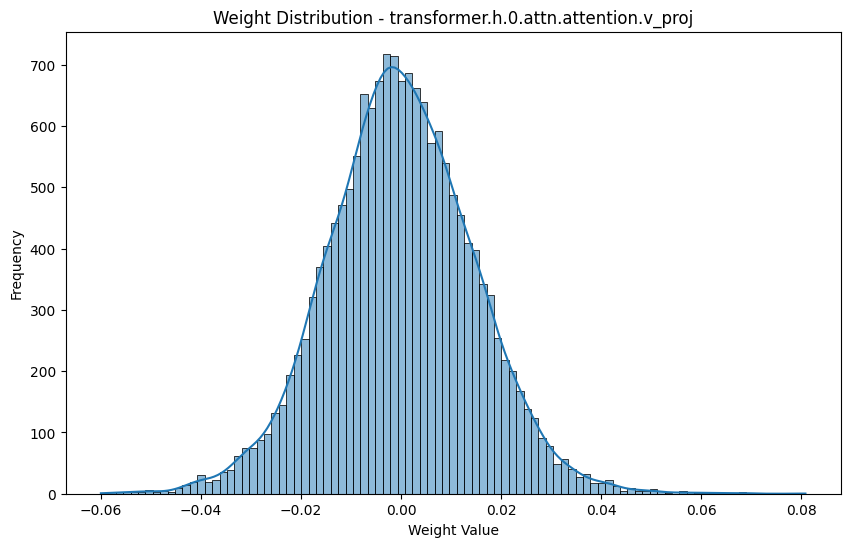


Analyzing transformer.h.0.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0328
  Min: -0.2023
  Max: 0.2206


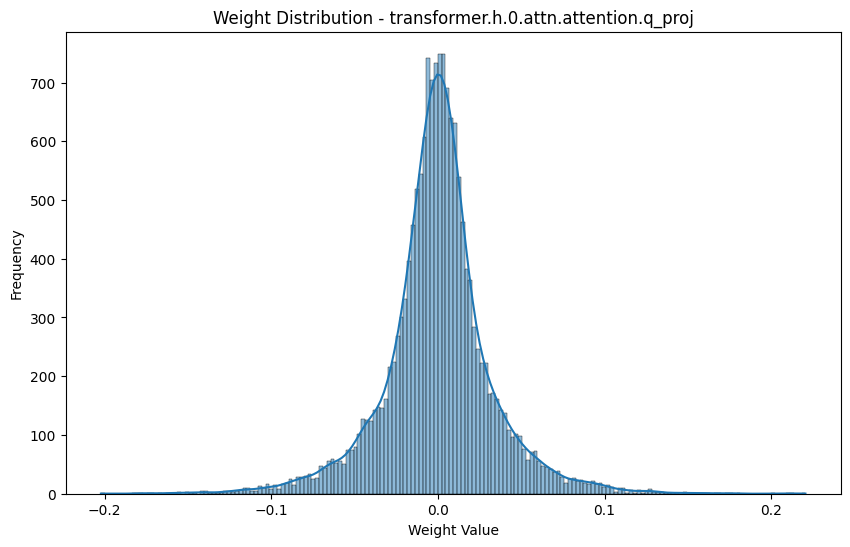


Analyzing transformer.h.0.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0169
  Min: -0.0828
  Max: 0.0881


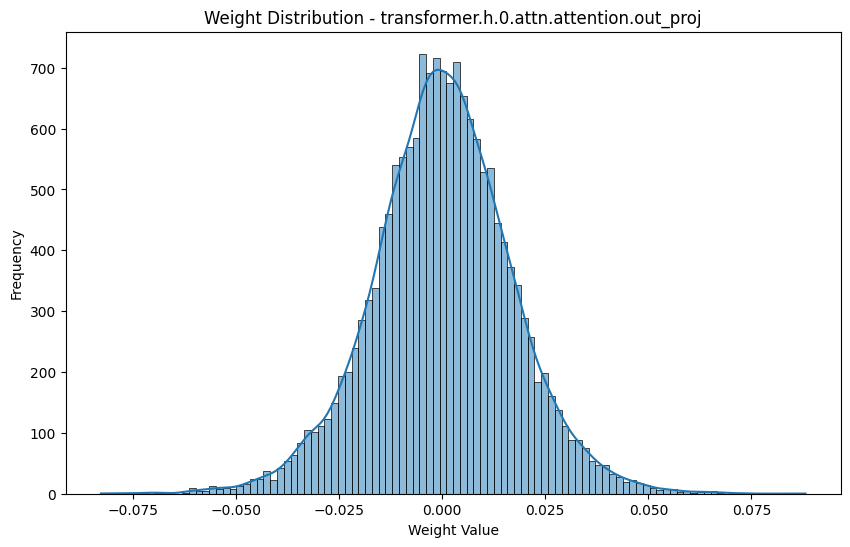


Analyzing transformer.h.0.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.0657
  Std Dev: 0.0236
  Min: 1.0176
  Max: 1.1422


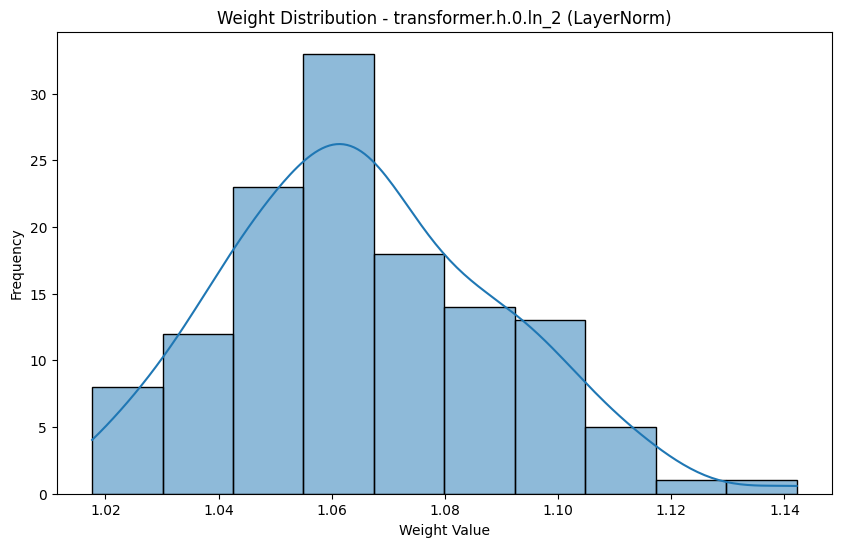


Analyzing transformer.h.0.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: -0.0002
  Std Dev: 0.0207
  Min: -0.1020
  Max: 0.0988


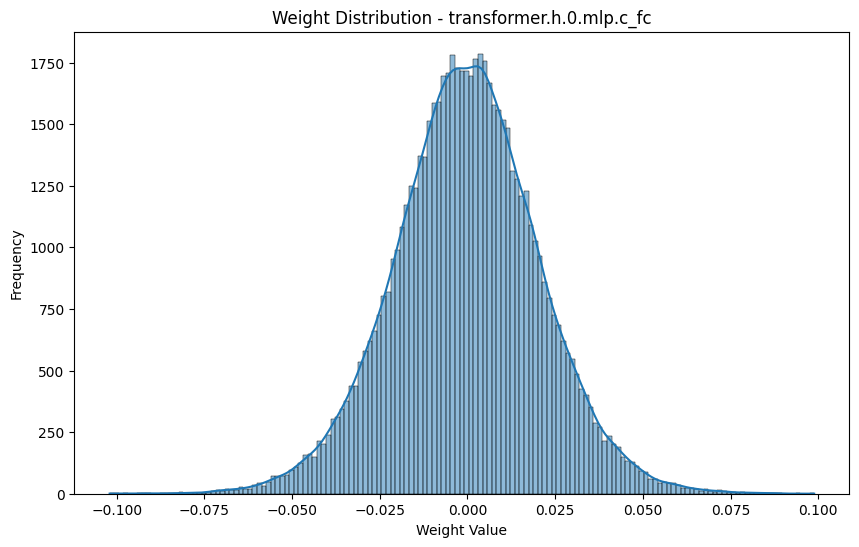


Analyzing transformer.h.0.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0175
  Min: -0.0795
  Max: 0.0908


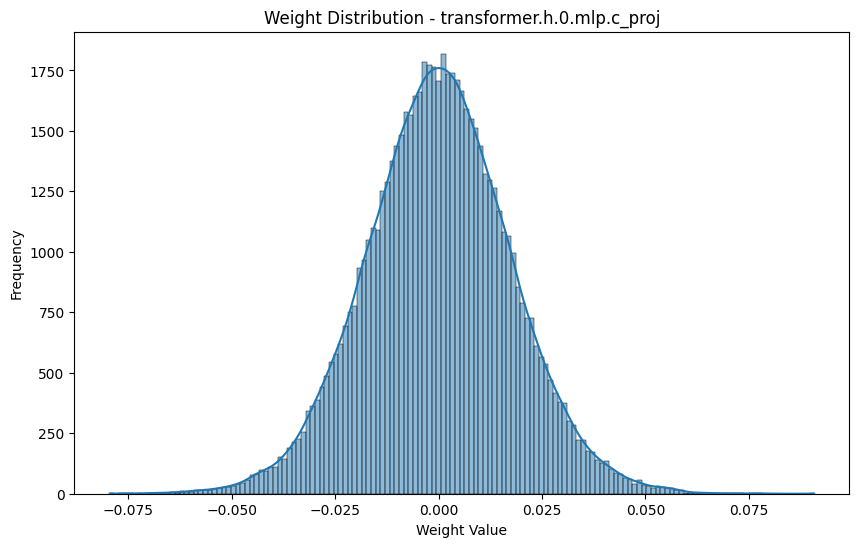


Analyzing transformer.h.1.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2157
  Std Dev: 0.0645
  Min: 1.0965
  Max: 1.4178


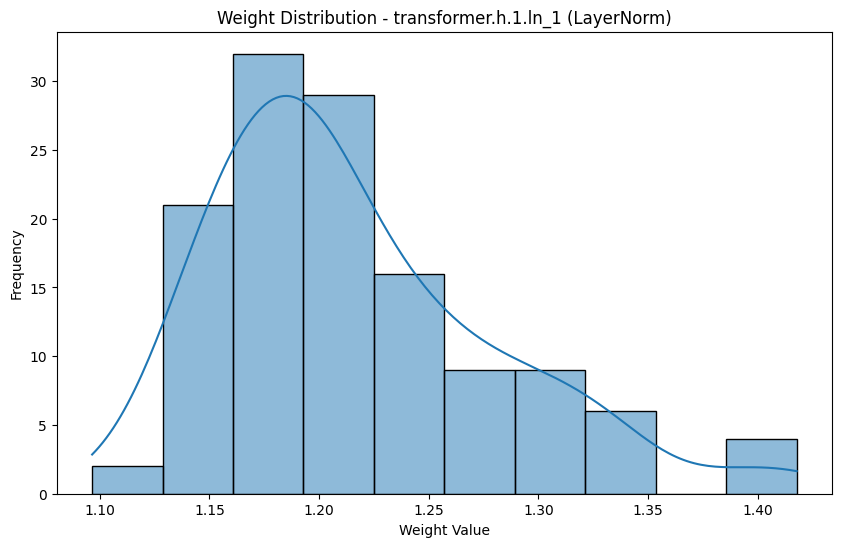


Analyzing transformer.h.1.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0375
  Min: -0.2870
  Max: 0.1868


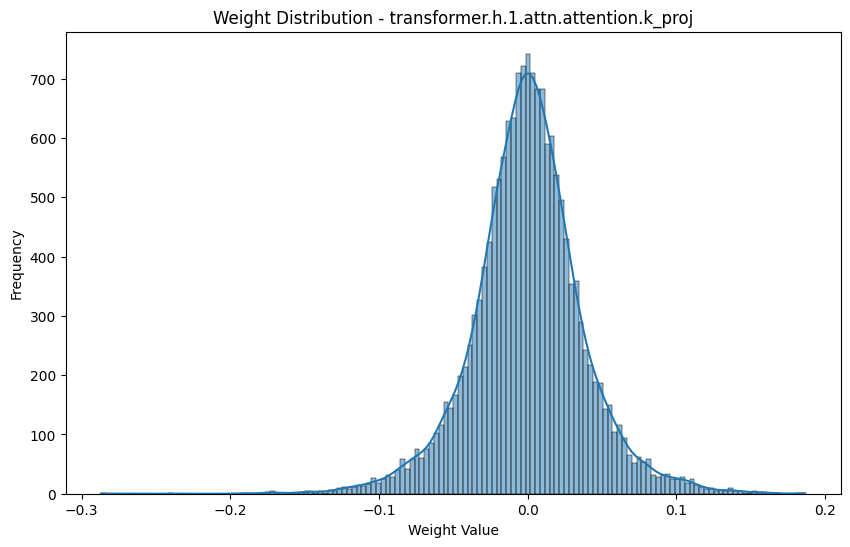


Analyzing transformer.h.1.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0220
  Min: -0.1135
  Max: 0.1276


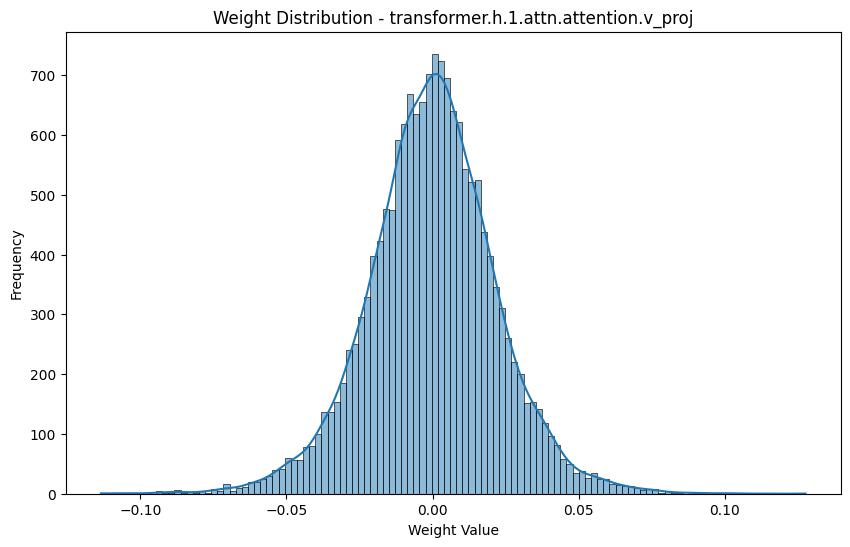


Analyzing transformer.h.1.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0003
  Std Dev: 0.0775
  Min: -0.4649
  Max: 0.5604


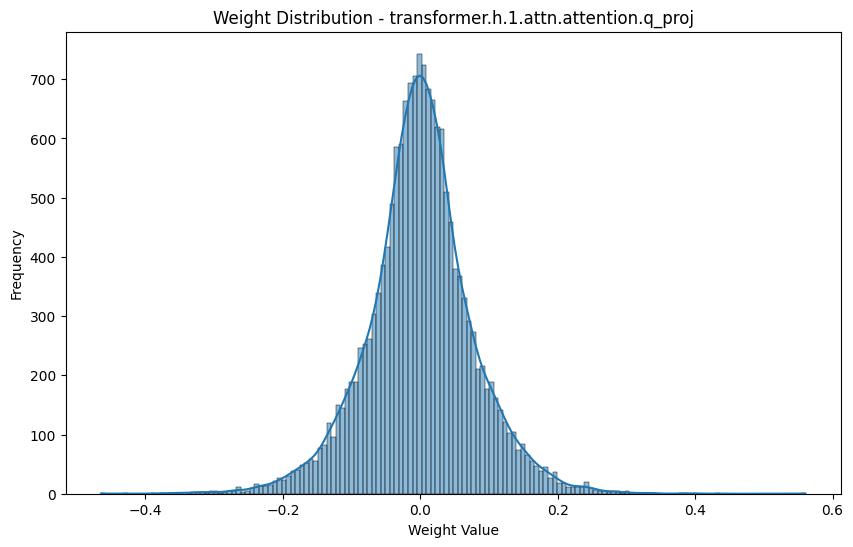


Analyzing transformer.h.1.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0228
  Min: -0.1100
  Max: 0.1181


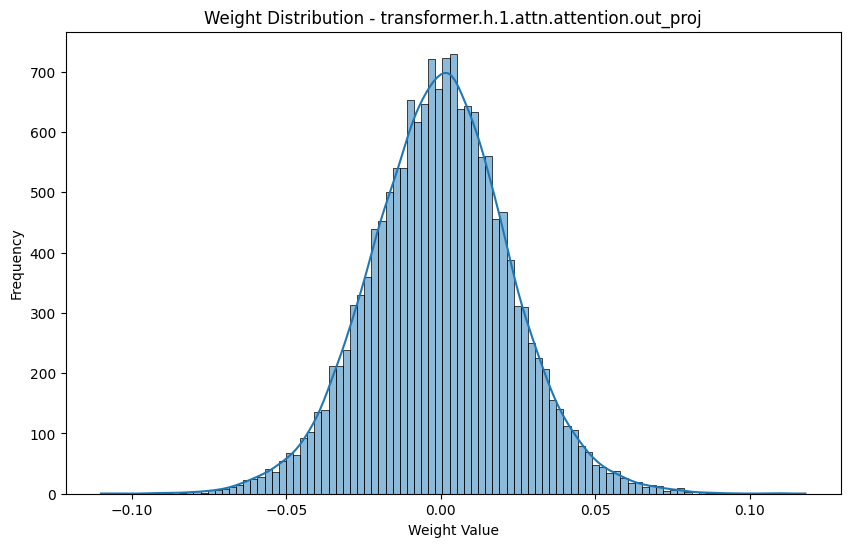


Analyzing transformer.h.1.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.1738
  Std Dev: 0.0549
  Min: 1.0439
  Max: 1.3334


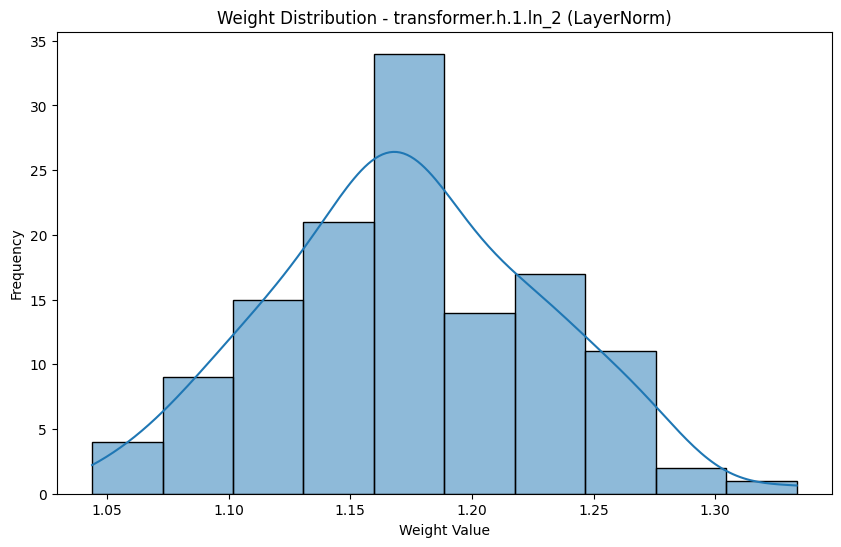


Analyzing transformer.h.1.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0235
  Min: -0.1168
  Max: 0.1109


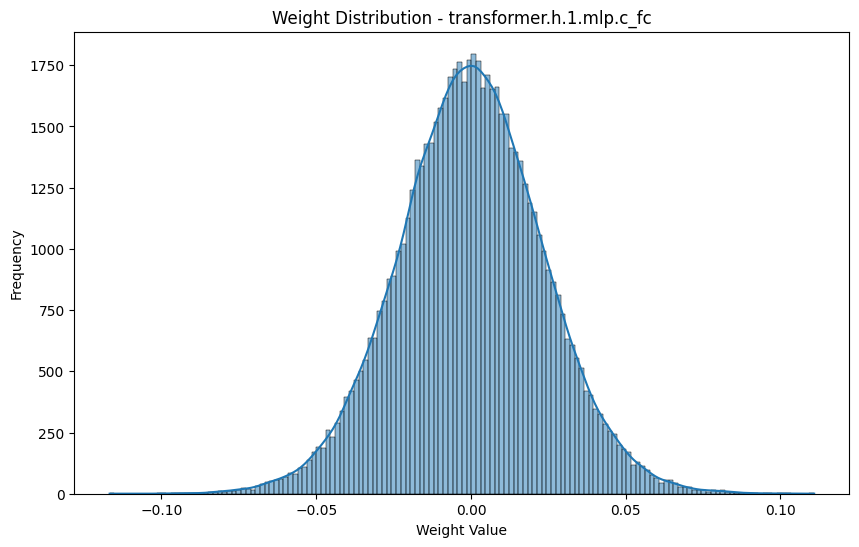


Analyzing transformer.h.1.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0164
  Min: -0.0771
  Max: 0.0659


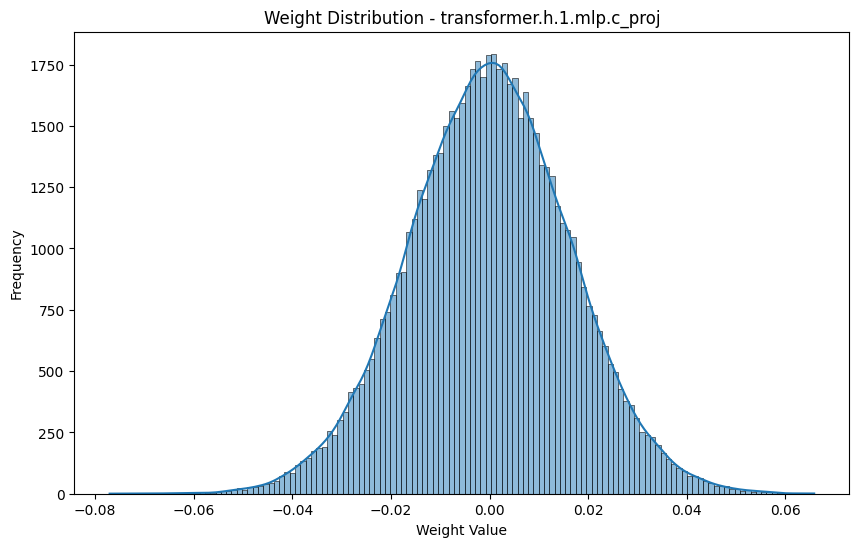


Analyzing transformer.h.2.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2074
  Std Dev: 0.0615
  Min: 1.0730
  Max: 1.4727


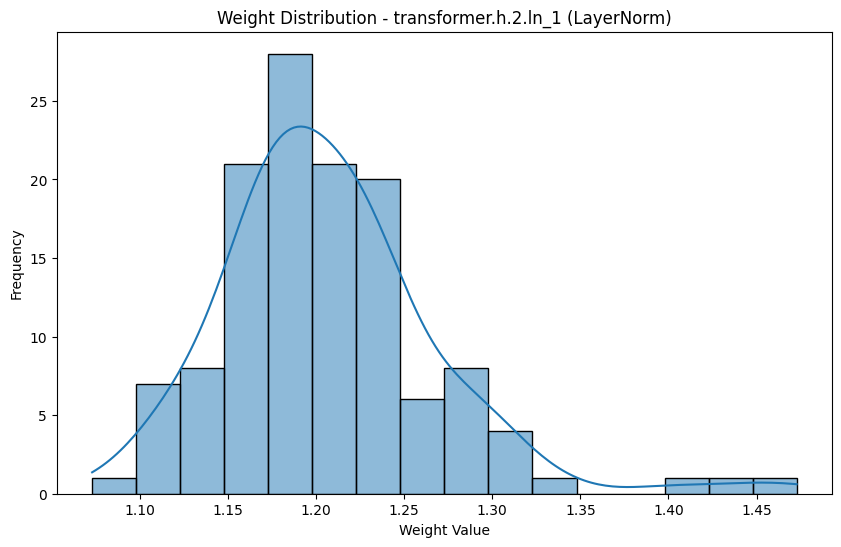


Analyzing transformer.h.2.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0386
  Min: -0.2322
  Max: 0.2491


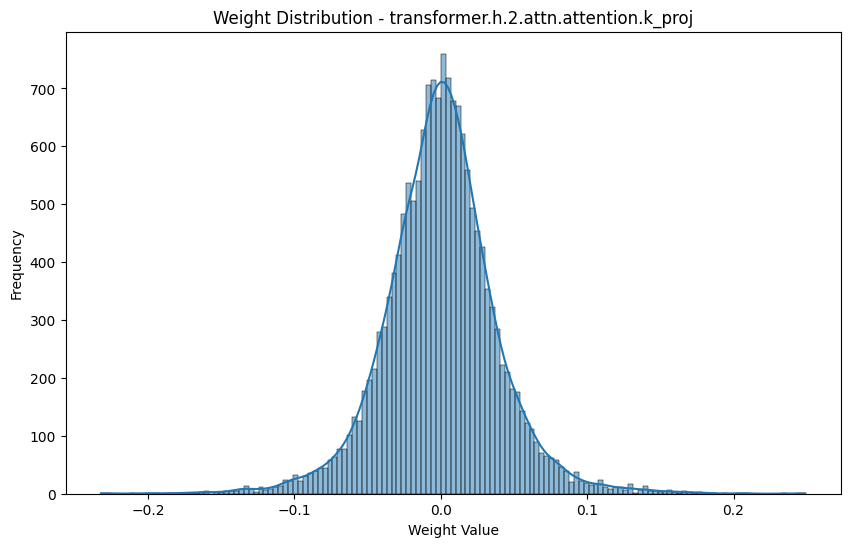


Analyzing transformer.h.2.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0002
  Std Dev: 0.0189
  Min: -0.1038
  Max: 0.0968


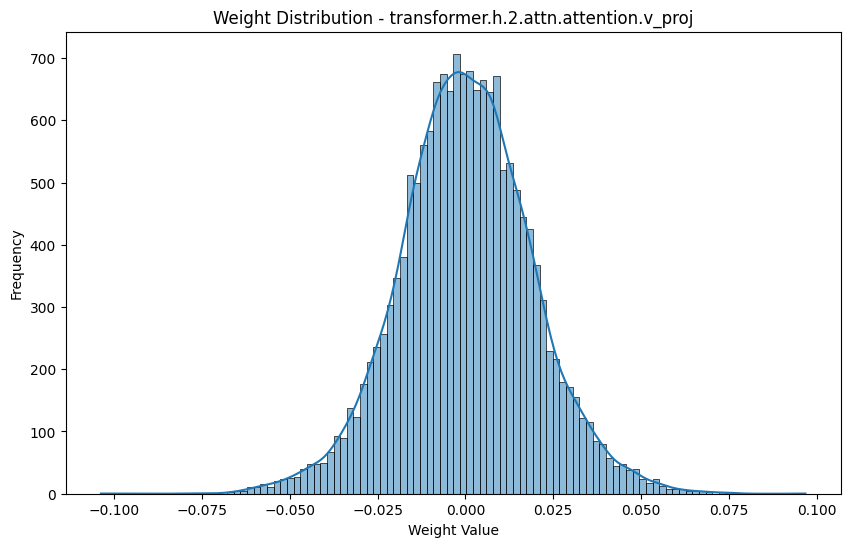


Analyzing transformer.h.2.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0746
  Min: -0.4270
  Max: 0.4094


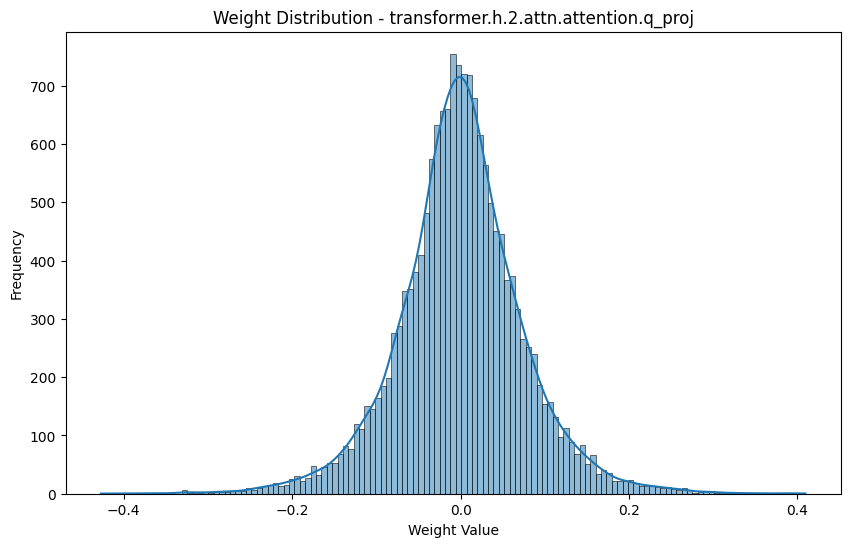


Analyzing transformer.h.2.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0206
  Min: -0.0811
  Max: 0.0990


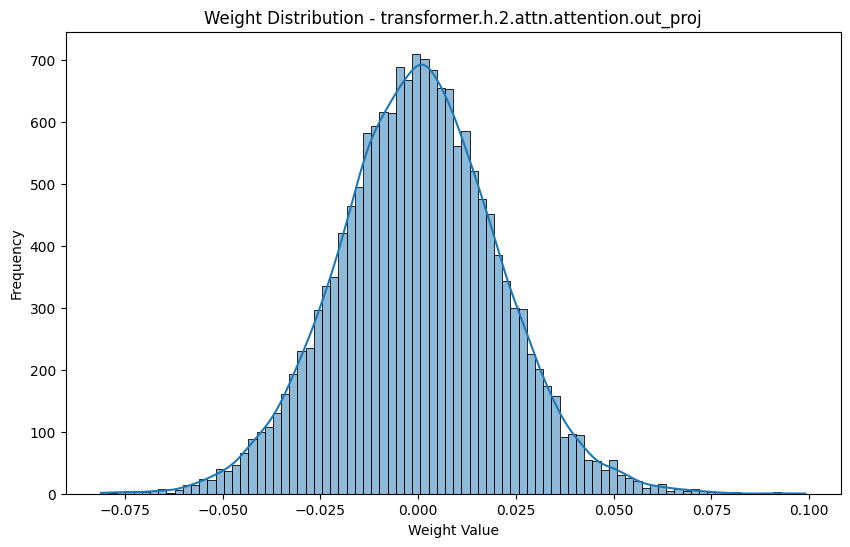


Analyzing transformer.h.2.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2135
  Std Dev: 0.0633
  Min: 1.0492
  Max: 1.4111


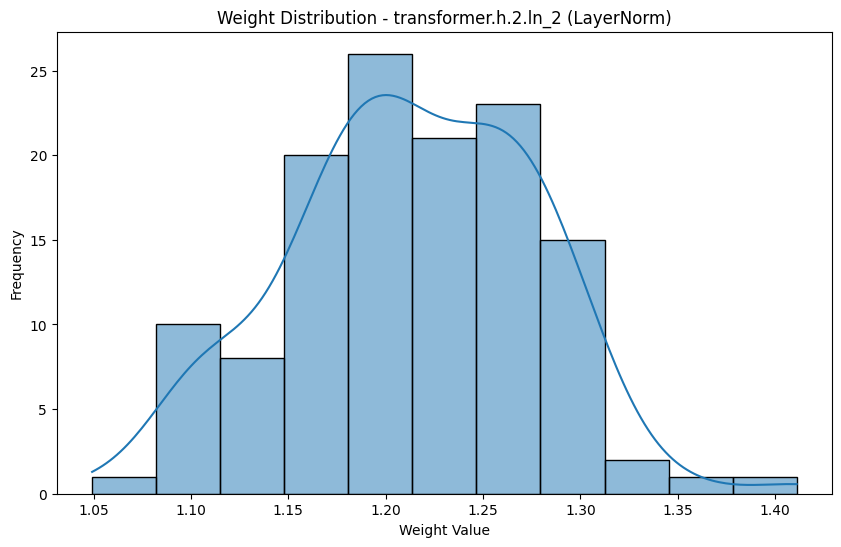


Analyzing transformer.h.2.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0238
  Min: -0.1227
  Max: 0.1084


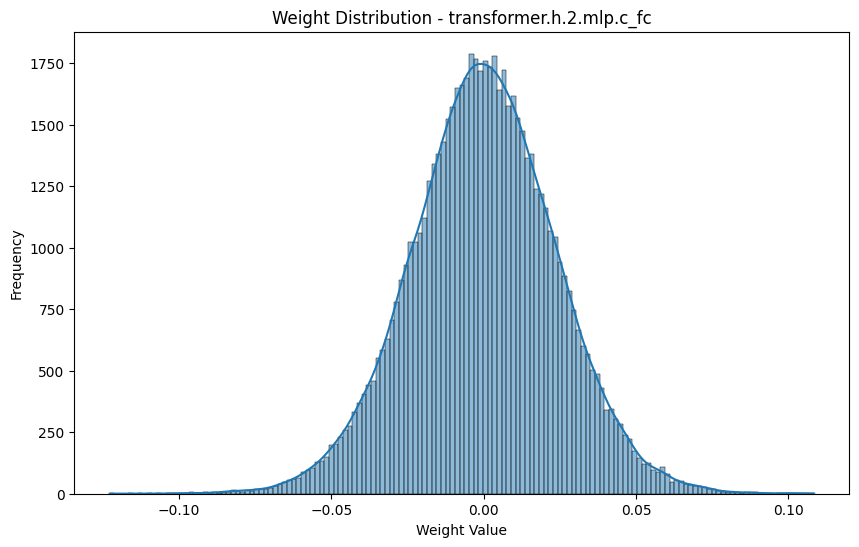


Analyzing transformer.h.2.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0160
  Min: -0.0676
  Max: 0.0636


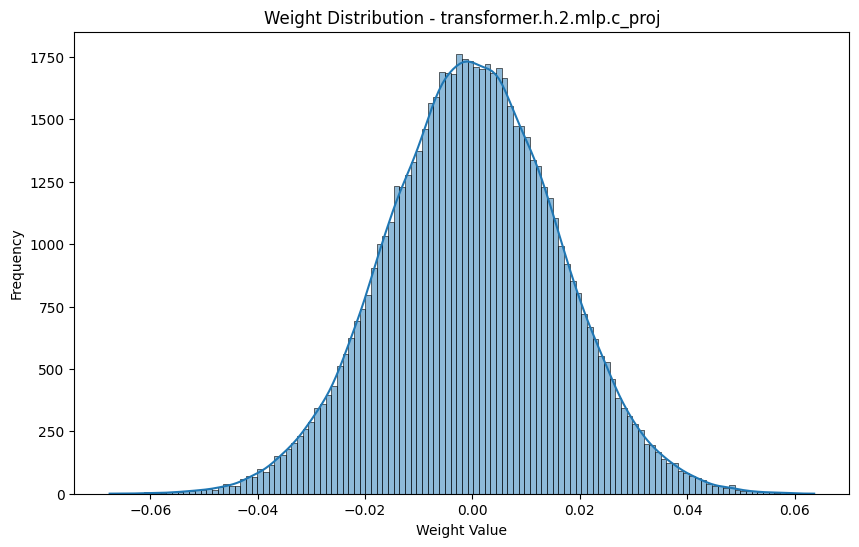


Analyzing transformer.h.3.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2050
  Std Dev: 0.0593
  Min: 1.0811
  Max: 1.4699


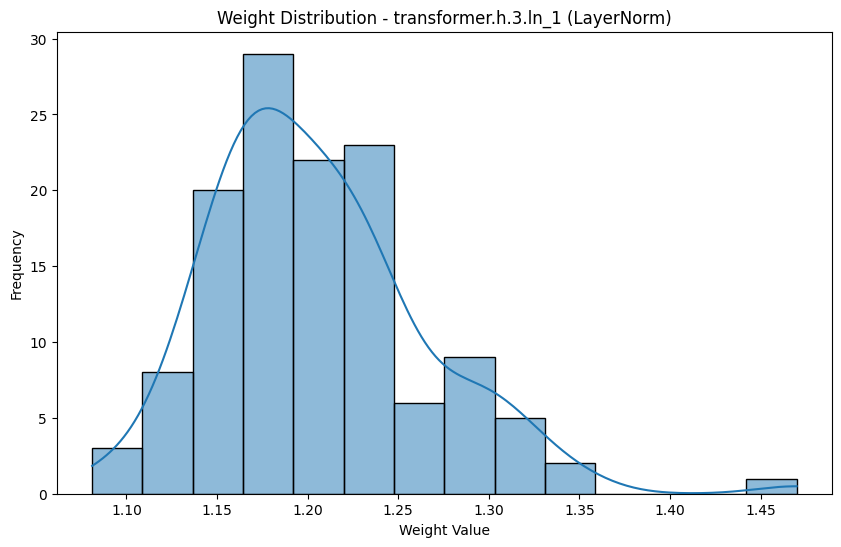


Analyzing transformer.h.3.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0387
  Min: -0.2297
  Max: 0.2232


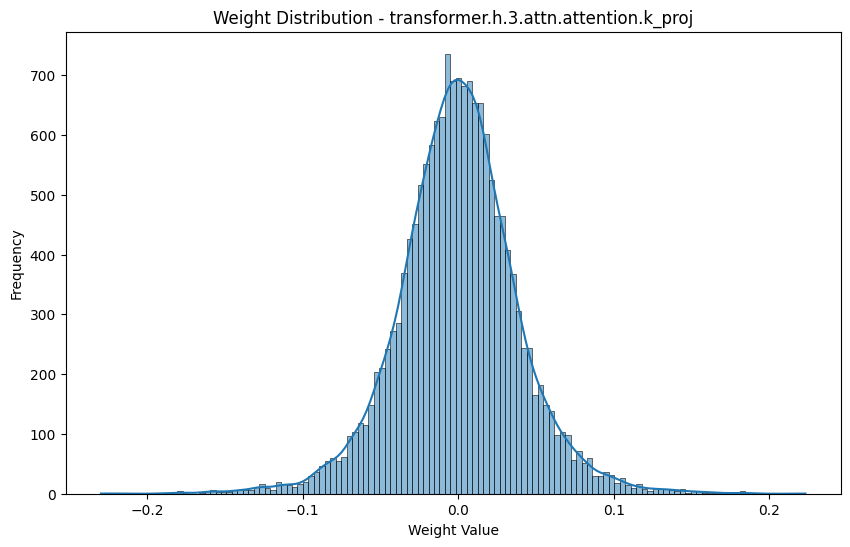


Analyzing transformer.h.3.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0172
  Min: -0.0811
  Max: 0.0761


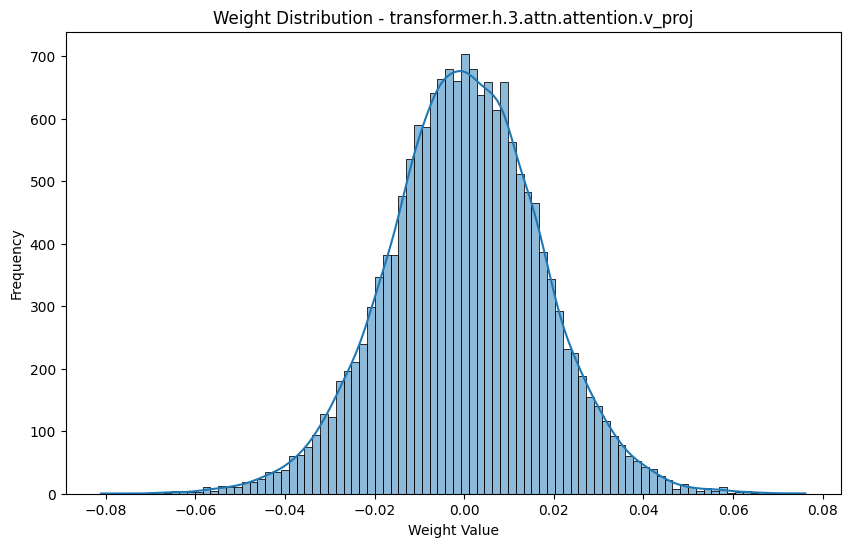


Analyzing transformer.h.3.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0699
  Min: -0.4301
  Max: 0.3726


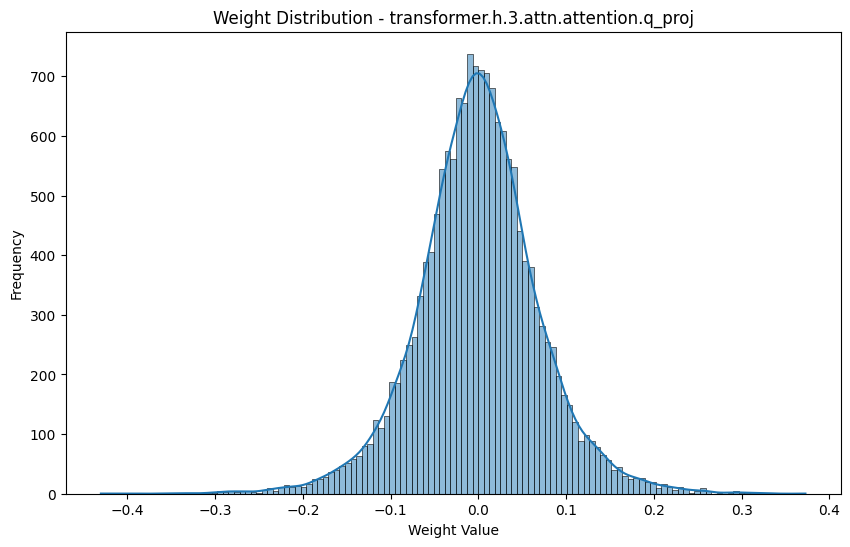


Analyzing transformer.h.3.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0191
  Min: -0.1038
  Max: 0.0899


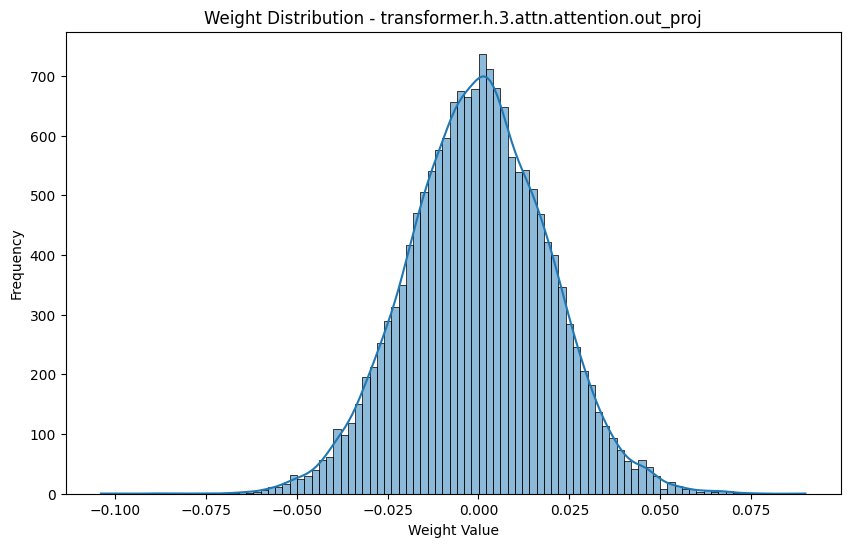


Analyzing transformer.h.3.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2494
  Std Dev: 0.0511
  Min: 1.1114
  Max: 1.3691


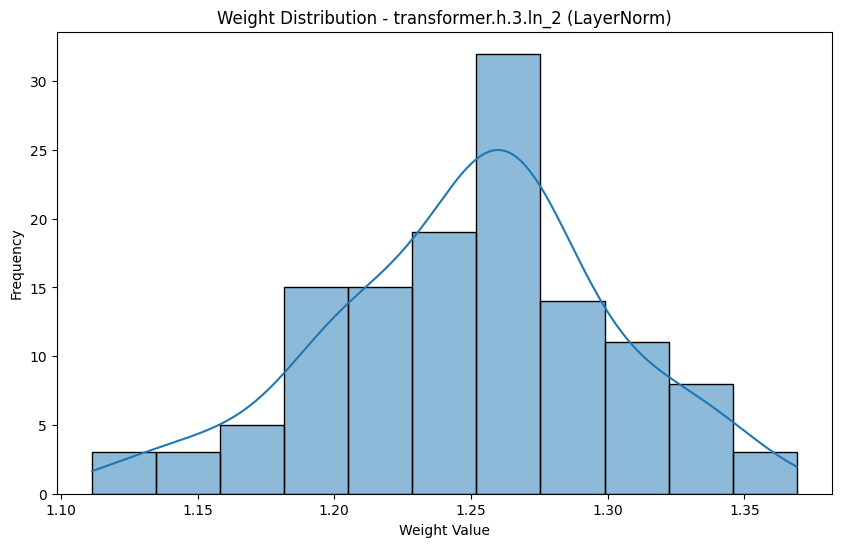


Analyzing transformer.h.3.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0239
  Min: -0.1059
  Max: 0.0996


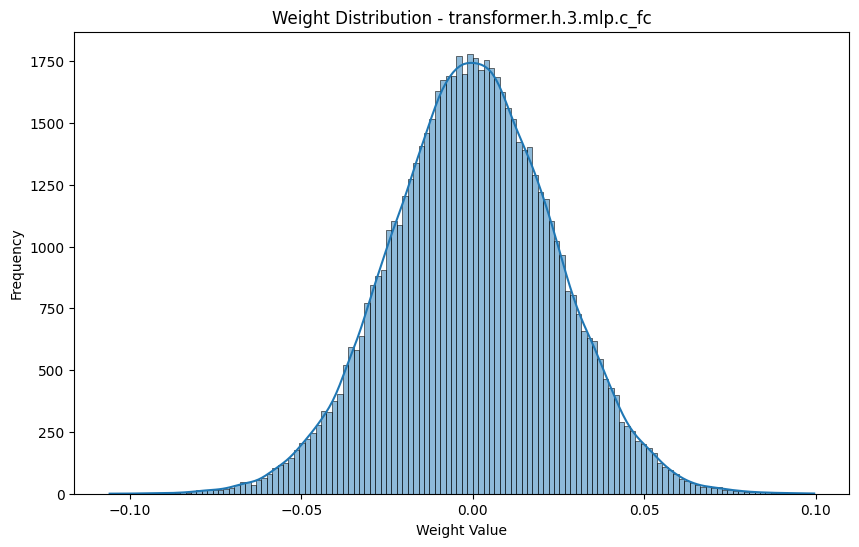


Analyzing transformer.h.3.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0161
  Min: -0.0663
  Max: 0.0679


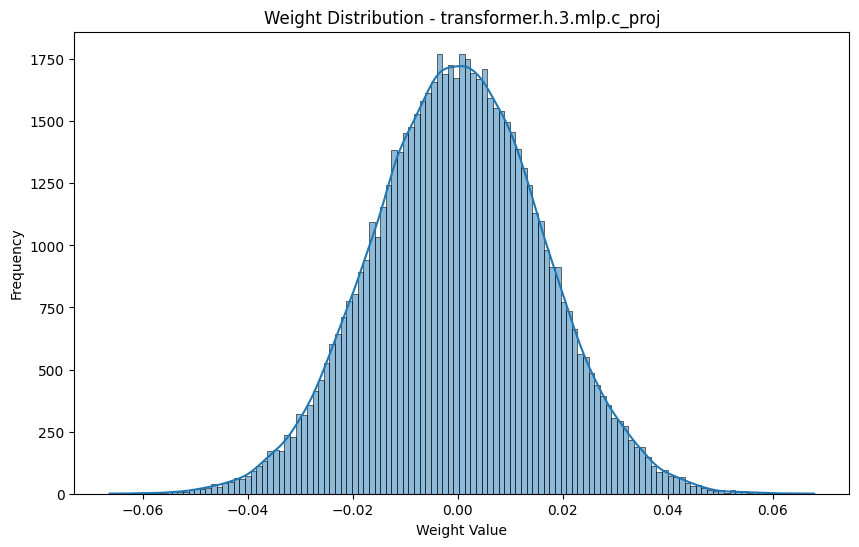


Analyzing transformer.h.4.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2231
  Std Dev: 0.0561
  Min: 1.0463
  Max: 1.4215


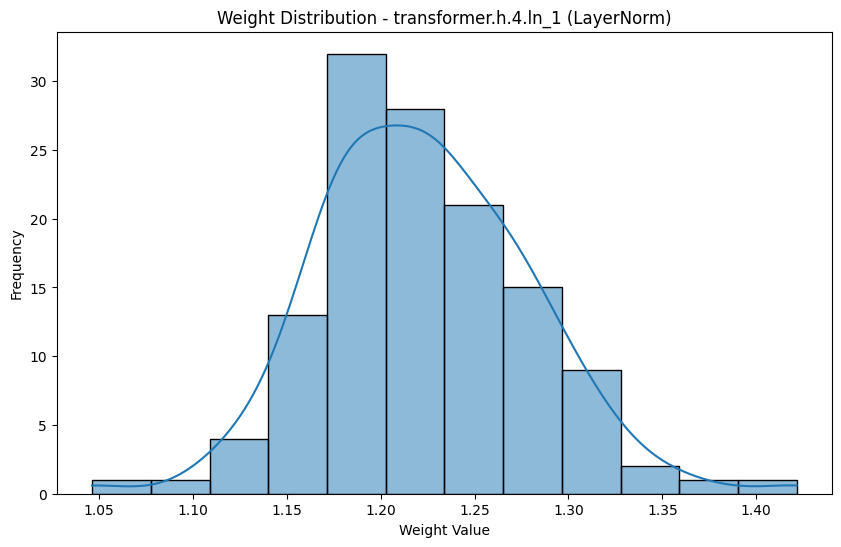


Analyzing transformer.h.4.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0422
  Min: -0.2190
  Max: 0.1949


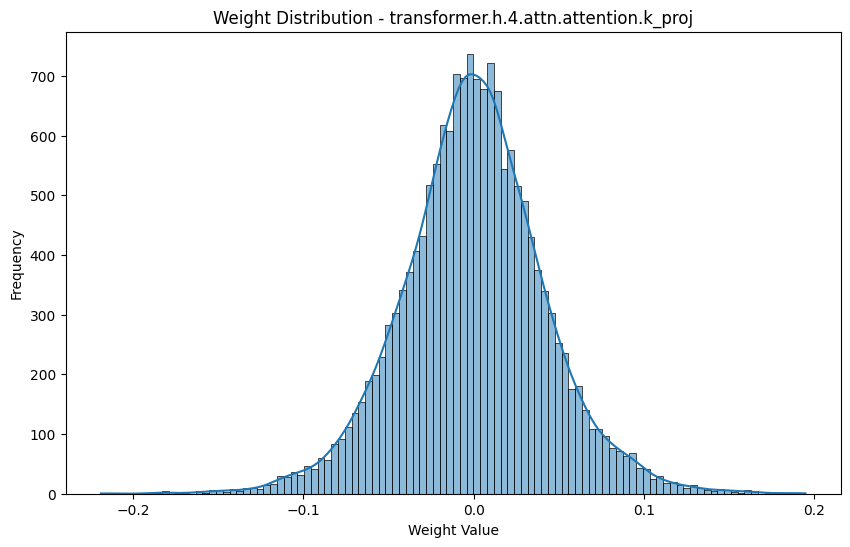


Analyzing transformer.h.4.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0163
  Min: -0.0809
  Max: 0.0683


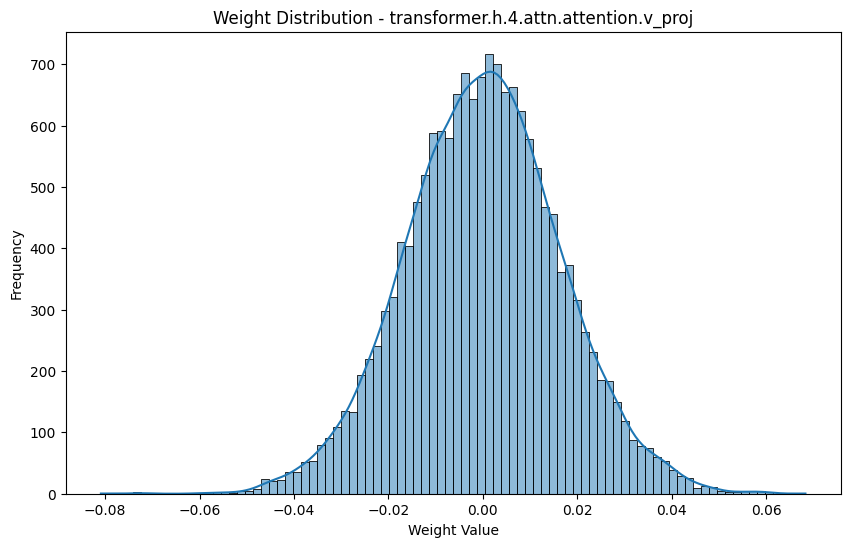


Analyzing transformer.h.4.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0005
  Std Dev: 0.0647
  Min: -0.3440
  Max: 0.3450


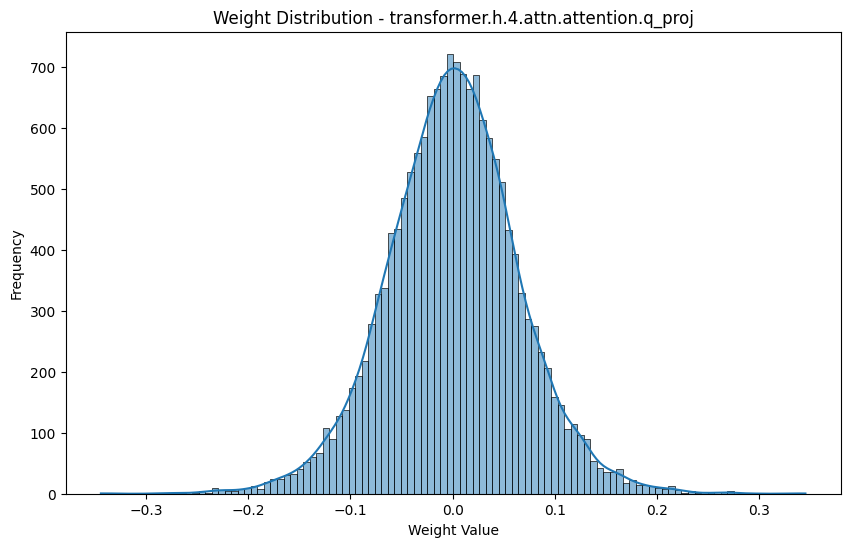


Analyzing transformer.h.4.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0189
  Min: -0.0787
  Max: 0.0896


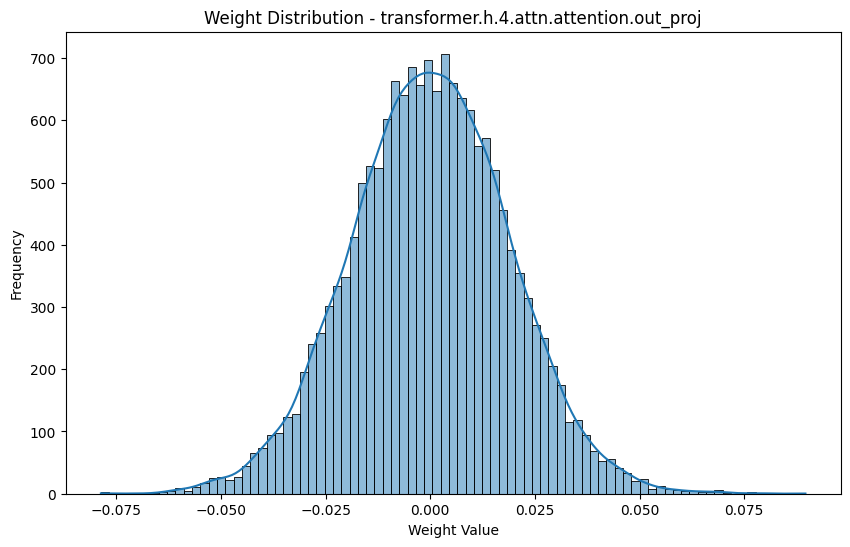


Analyzing transformer.h.4.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2758
  Std Dev: 0.0444
  Min: 1.1383
  Max: 1.3853


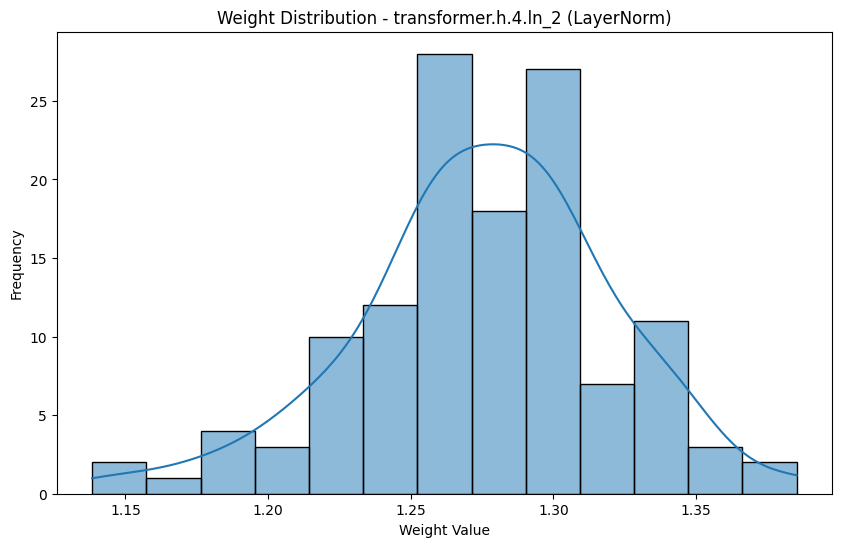


Analyzing transformer.h.4.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0247
  Min: -0.1196
  Max: 0.1101


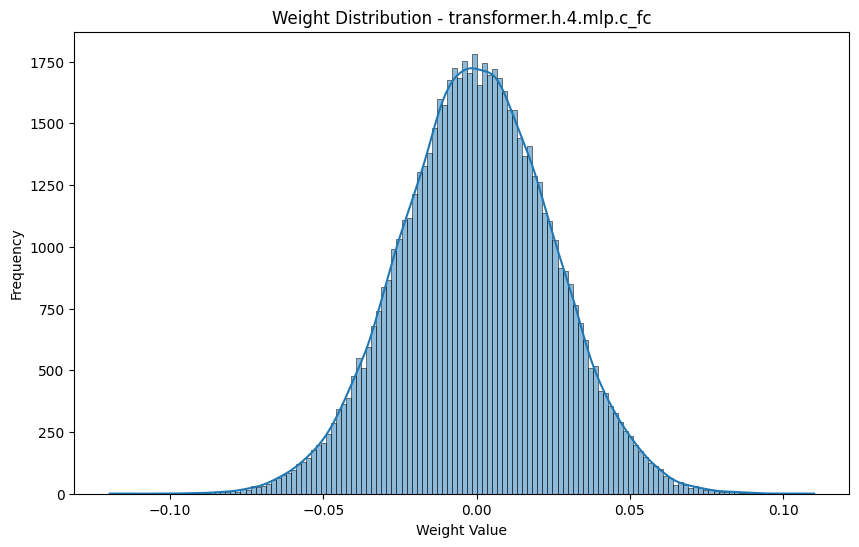


Analyzing transformer.h.4.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0168
  Min: -0.0820
  Max: 0.0697


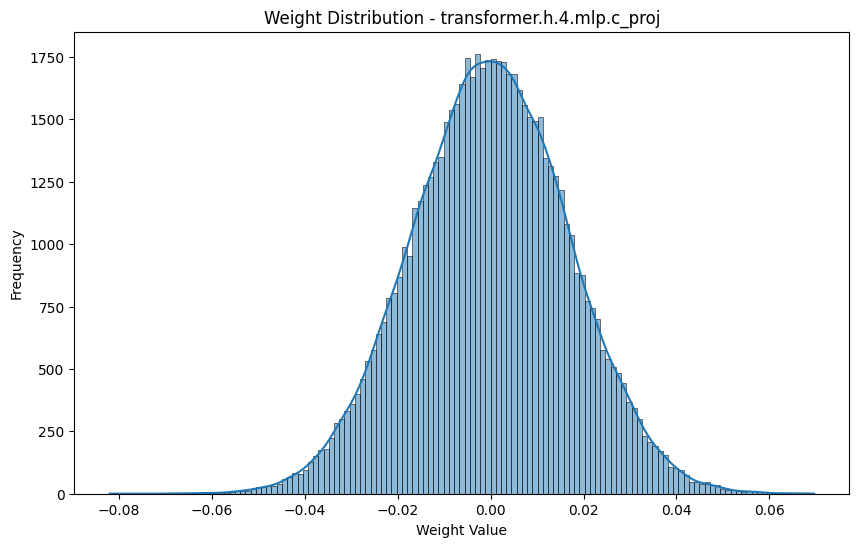


Analyzing transformer.h.5.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.1920
  Std Dev: 0.0525
  Min: 1.0601
  Max: 1.3760


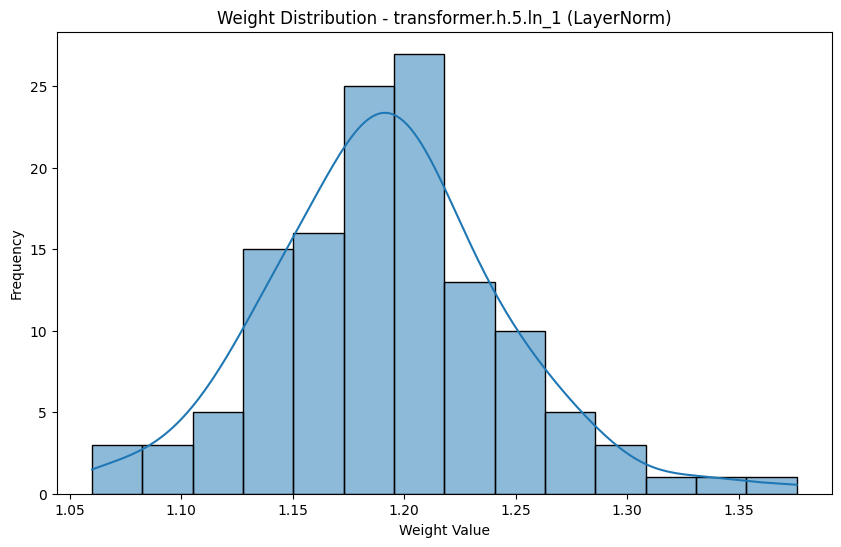


Analyzing transformer.h.5.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0000
  Std Dev: 0.0382
  Min: -0.1698
  Max: 0.1648


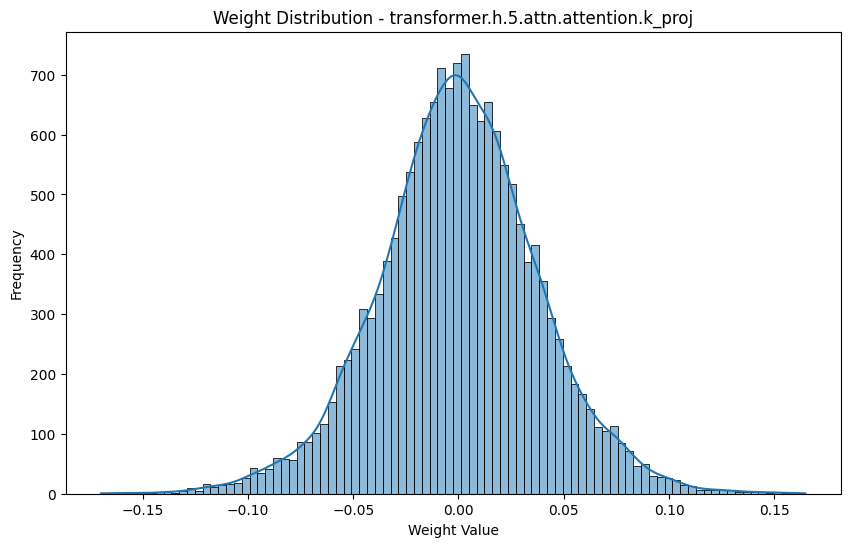


Analyzing transformer.h.5.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0151
  Min: -0.0716
  Max: 0.0629


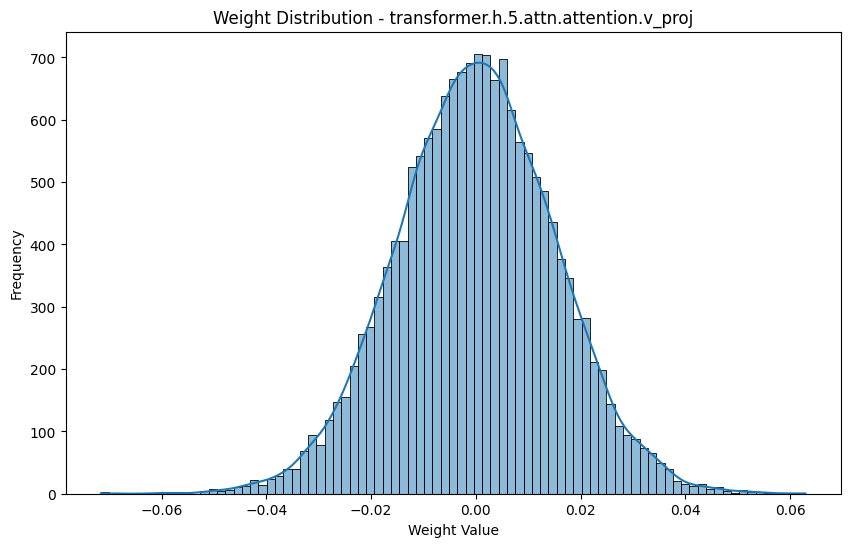


Analyzing transformer.h.5.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0002
  Std Dev: 0.0555
  Min: -0.3290
  Max: 0.2962


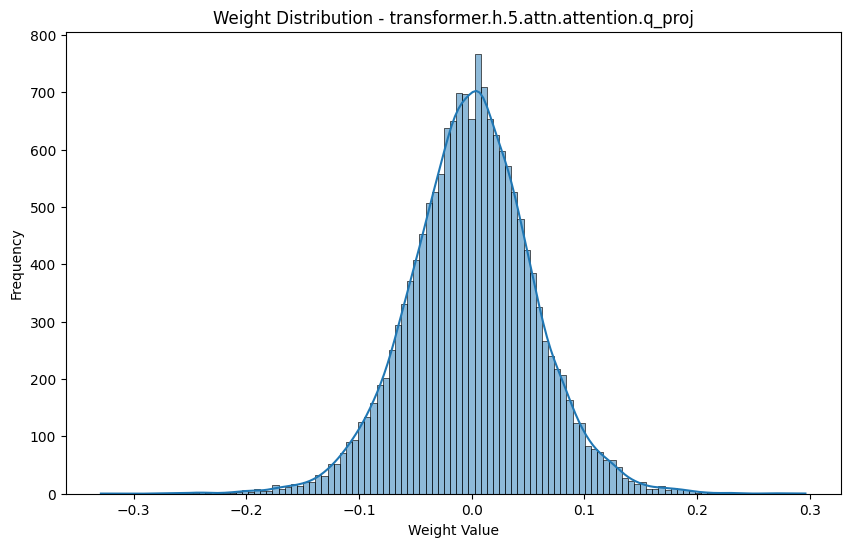


Analyzing transformer.h.5.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0166
  Min: -0.0720
  Max: 0.0665


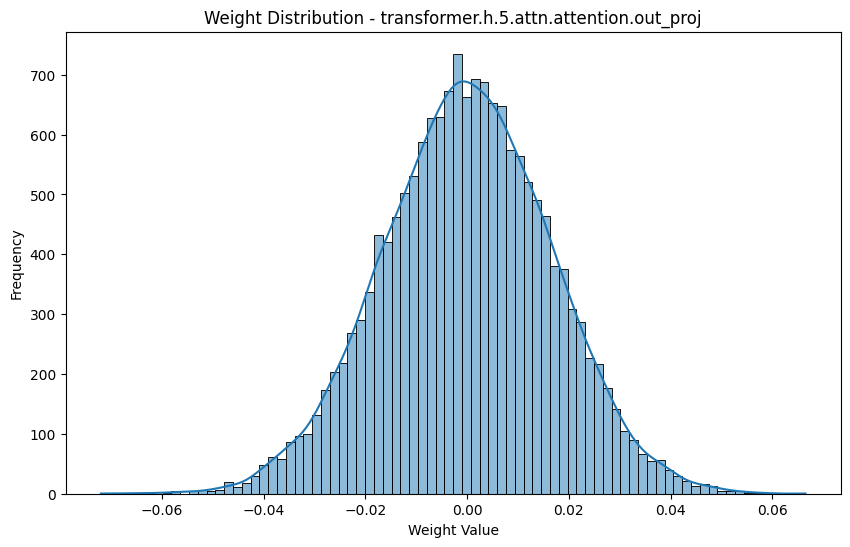


Analyzing transformer.h.5.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2863
  Std Dev: 0.0436
  Min: 1.1871
  Max: 1.3964


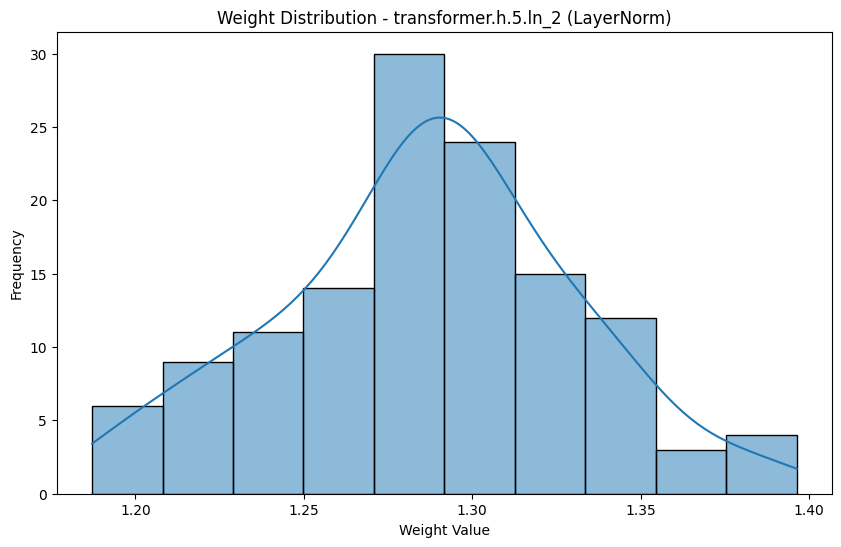


Analyzing transformer.h.5.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0249
  Min: -0.1193
  Max: 0.1418


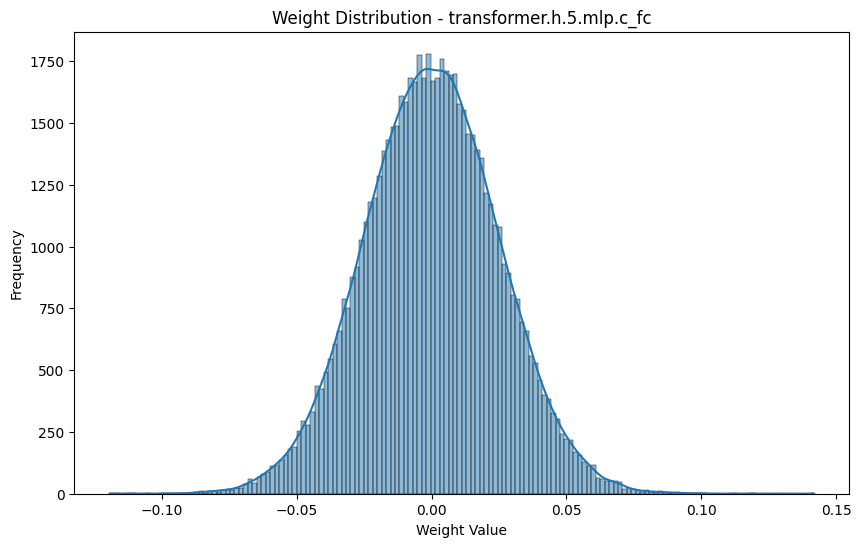


Analyzing transformer.h.5.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0173
  Min: -0.0719
  Max: 0.0767


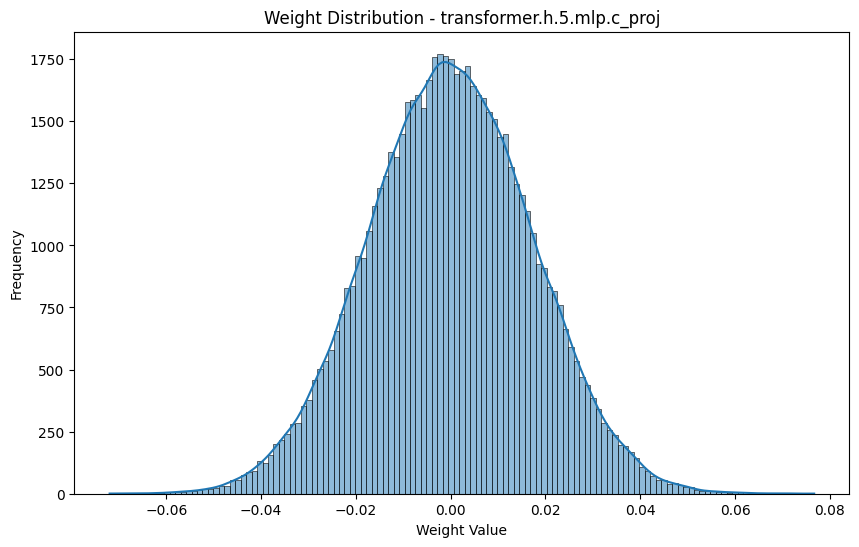


Analyzing transformer.h.6.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2096
  Std Dev: 0.0551
  Min: 1.0556
  Max: 1.3699


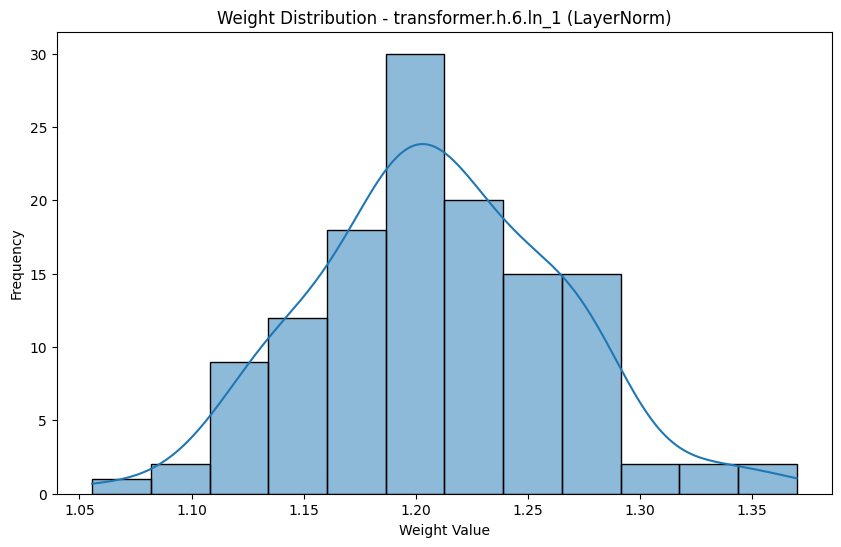


Analyzing transformer.h.6.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0407
  Min: -0.1938
  Max: 0.2005


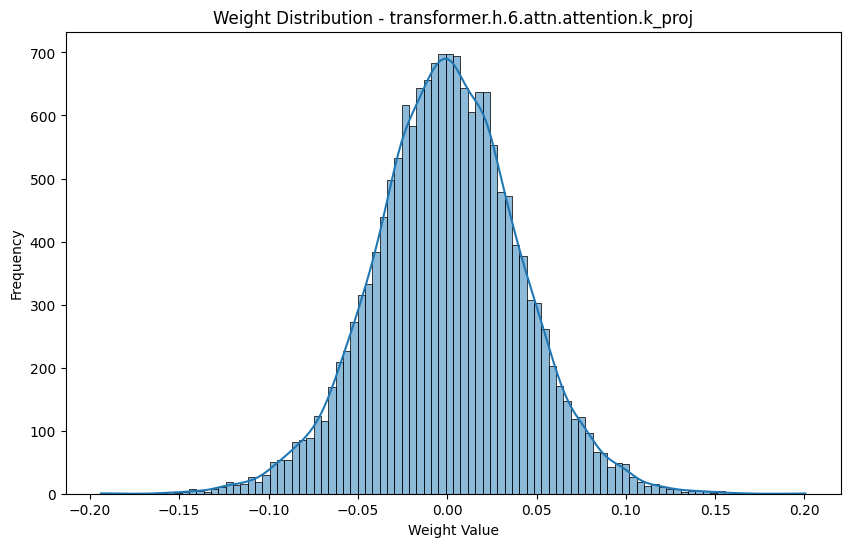


Analyzing transformer.h.6.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0139
  Min: -0.0611
  Max: 0.0583


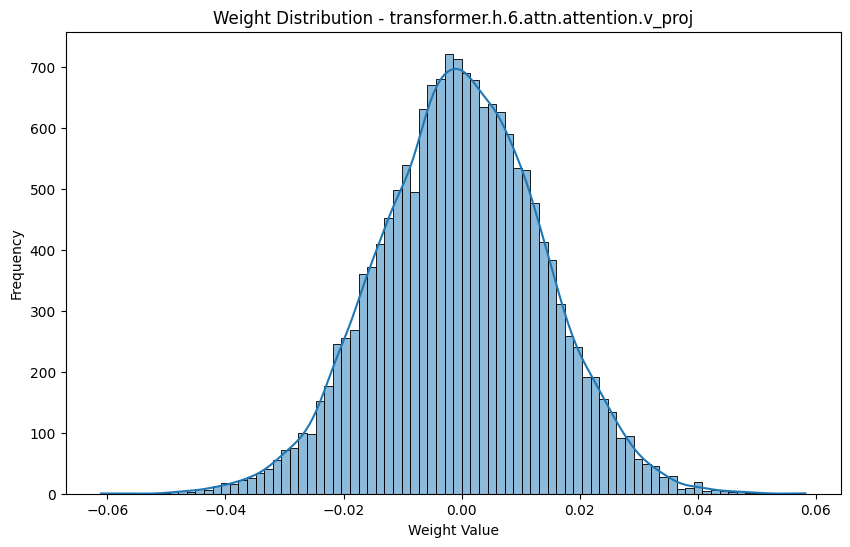


Analyzing transformer.h.6.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0466
  Min: -0.2331
  Max: 0.1961


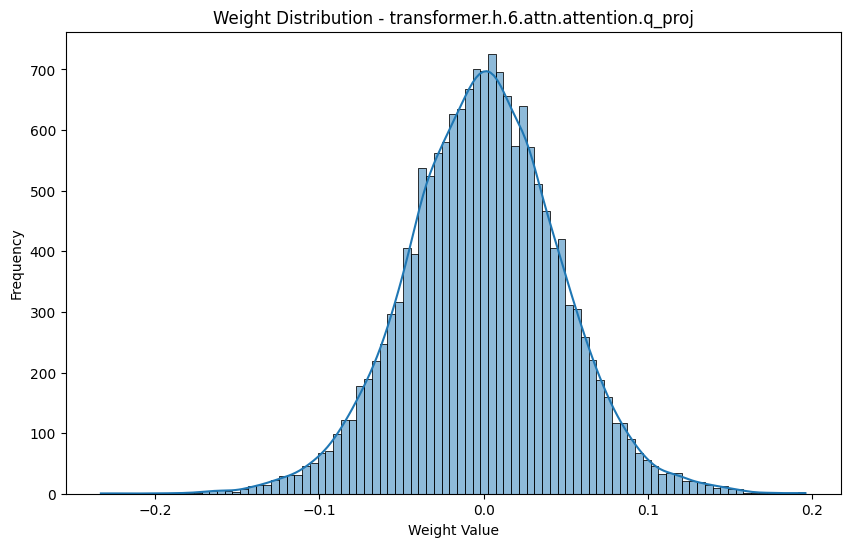


Analyzing transformer.h.6.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0153
  Min: -0.0643
  Max: 0.0679


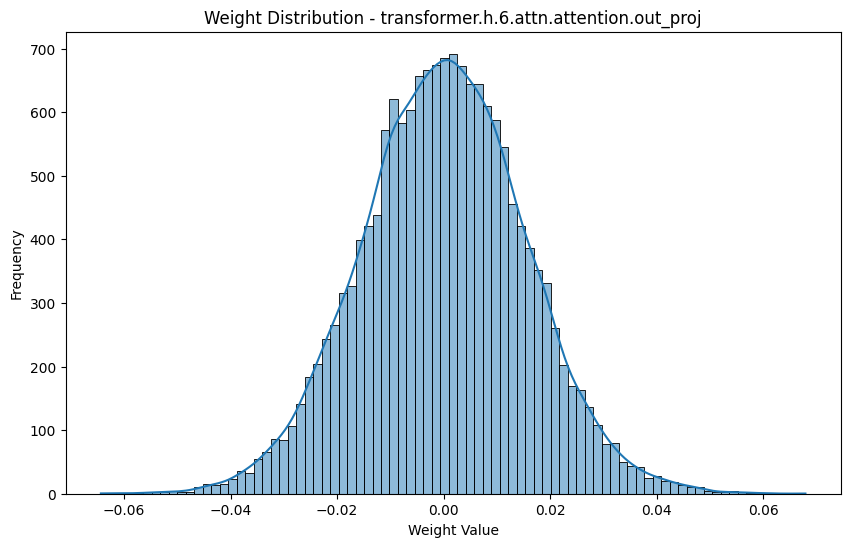


Analyzing transformer.h.6.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2996
  Std Dev: 0.0485
  Min: 1.1502
  Max: 1.3999


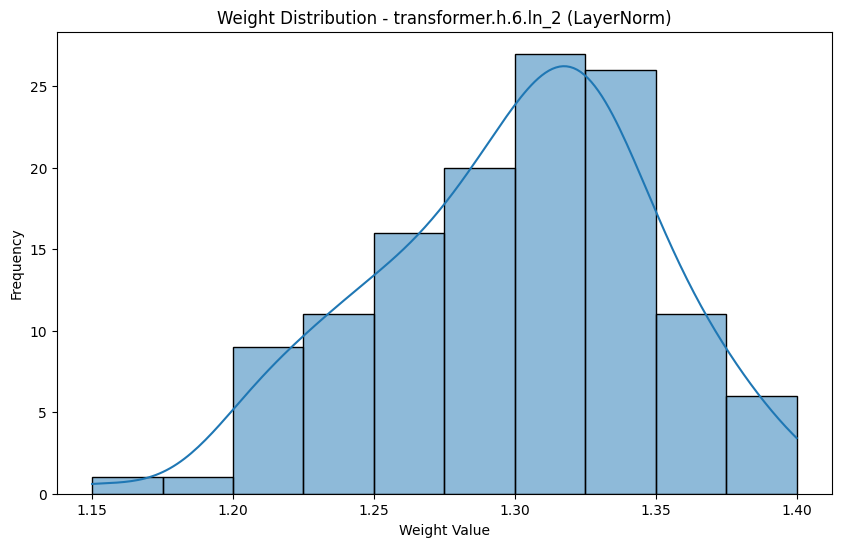


Analyzing transformer.h.6.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0249
  Min: -0.1119
  Max: 0.1058


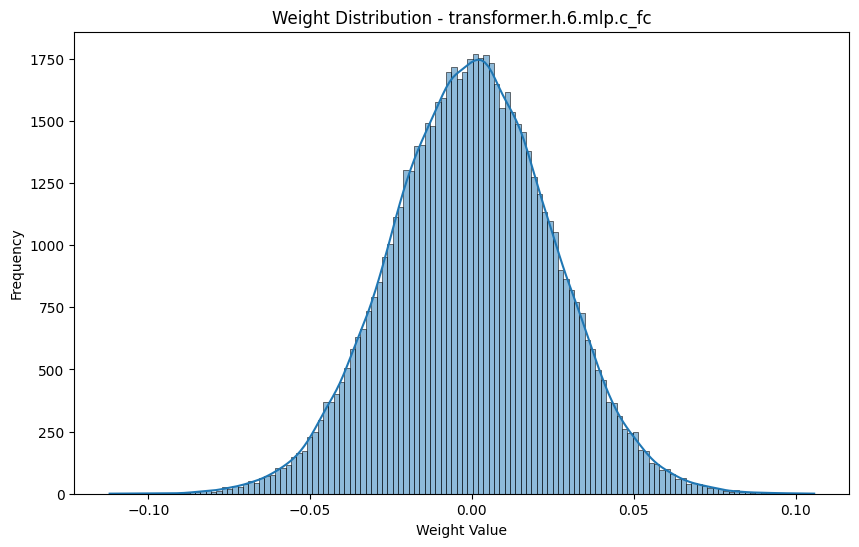


Analyzing transformer.h.6.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0177
  Min: -0.0744
  Max: 0.0723


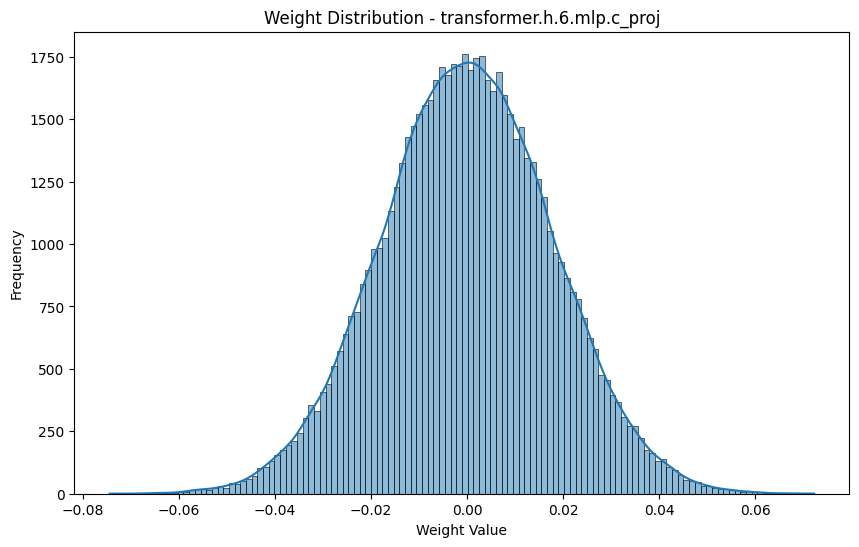


Analyzing transformer.h.7.ln_1 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.2474
  Std Dev: 0.0465
  Min: 1.1237
  Max: 1.3603


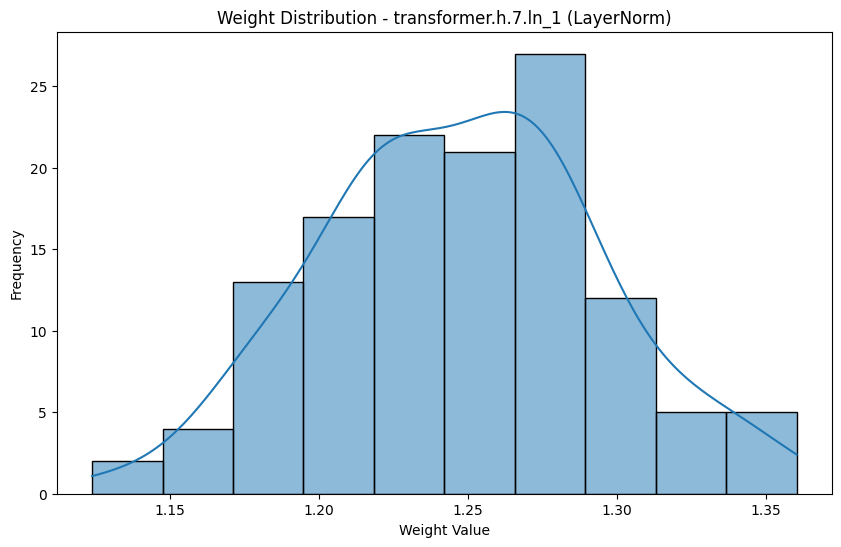


Analyzing transformer.h.7.attn.attention.k_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0428
  Min: -0.1746
  Max: 0.1912


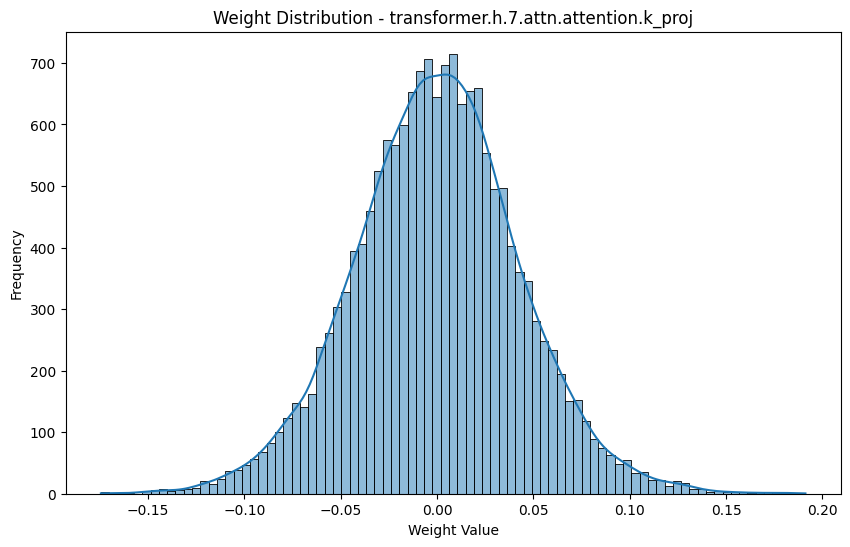


Analyzing transformer.h.7.attn.attention.v_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: 0.0001
  Std Dev: 0.0186
  Min: -0.0919
  Max: 0.0855


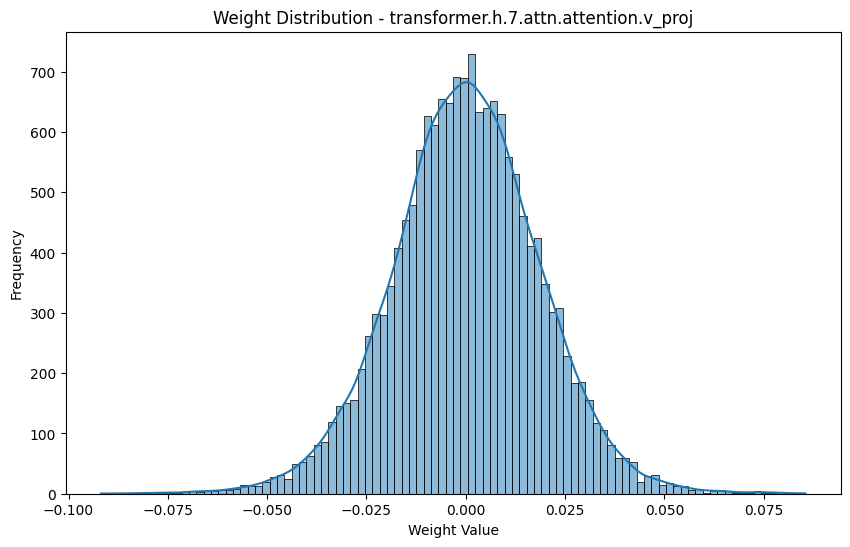


Analyzing transformer.h.7.attn.attention.q_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0540
  Min: -0.2336
  Max: 0.2619


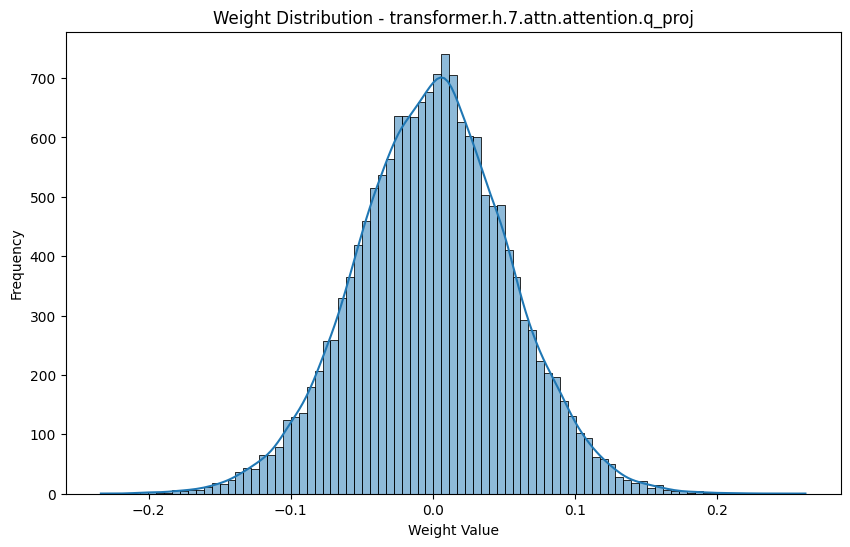


Analyzing transformer.h.7.attn.attention.out_proj
Weight Shape: torch.Size([128, 128])
Weight Stats:
  Mean: -0.0001
  Std Dev: 0.0241
  Min: -0.1584
  Max: 0.1369


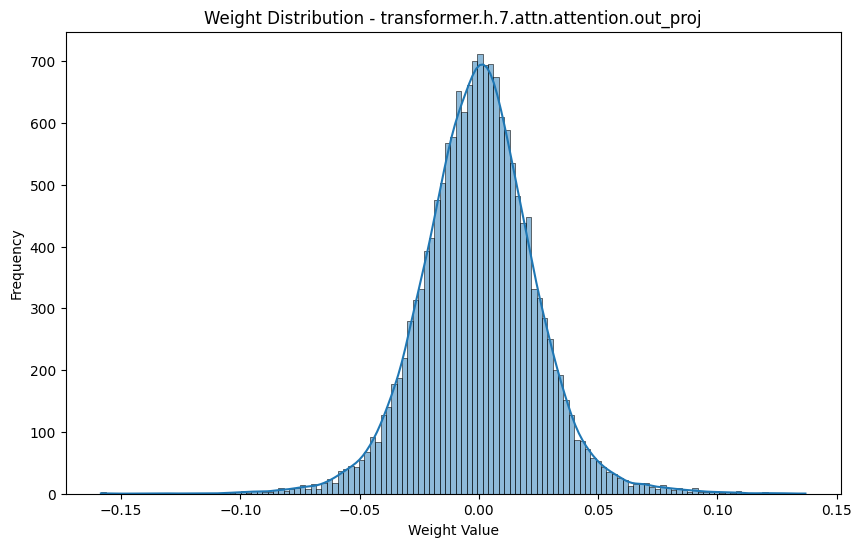


Analyzing transformer.h.7.ln_2 (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 1.3311
  Std Dev: 0.0444
  Min: 1.2217
  Max: 1.4354


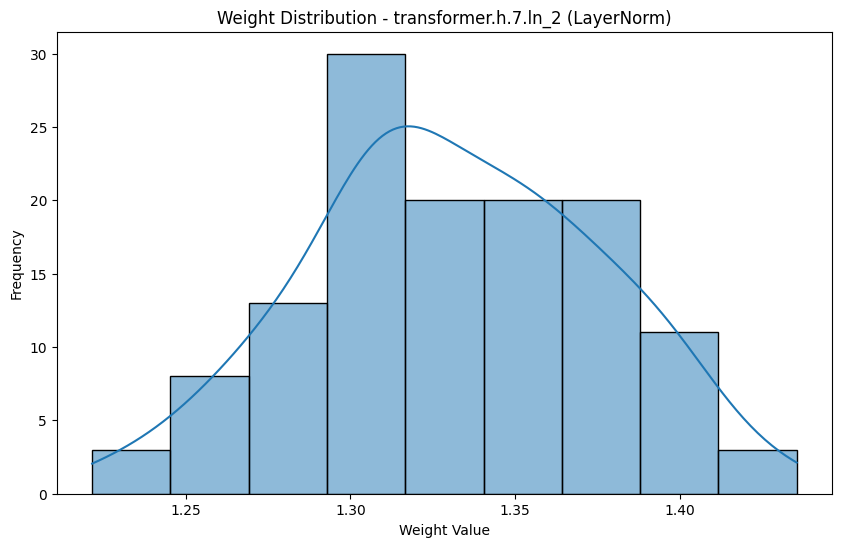


Analyzing transformer.h.7.mlp.c_fc
Weight Shape: torch.Size([512, 128])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0270
  Min: -0.1114
  Max: 0.1230


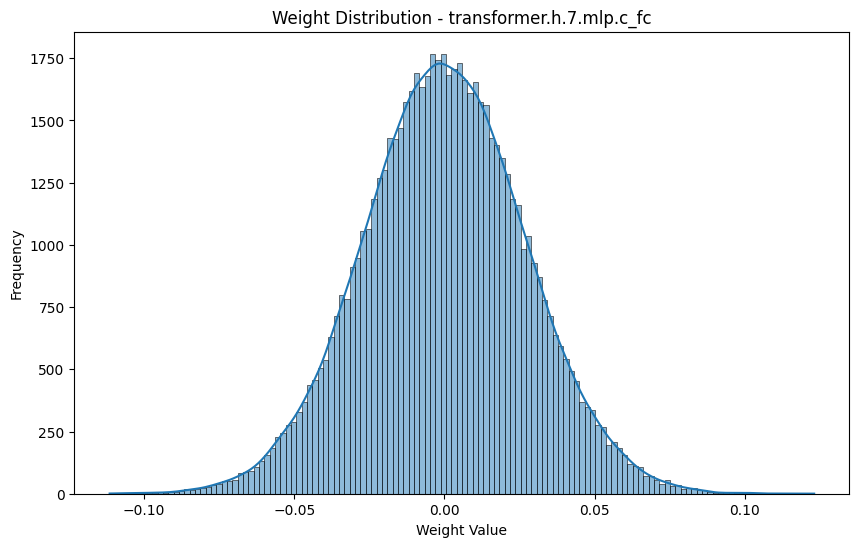


Analyzing transformer.h.7.mlp.c_proj
Weight Shape: torch.Size([128, 512])
Weight Stats:
  Mean: -0.0000
  Std Dev: 0.0216
  Min: -0.0882
  Max: 0.1199


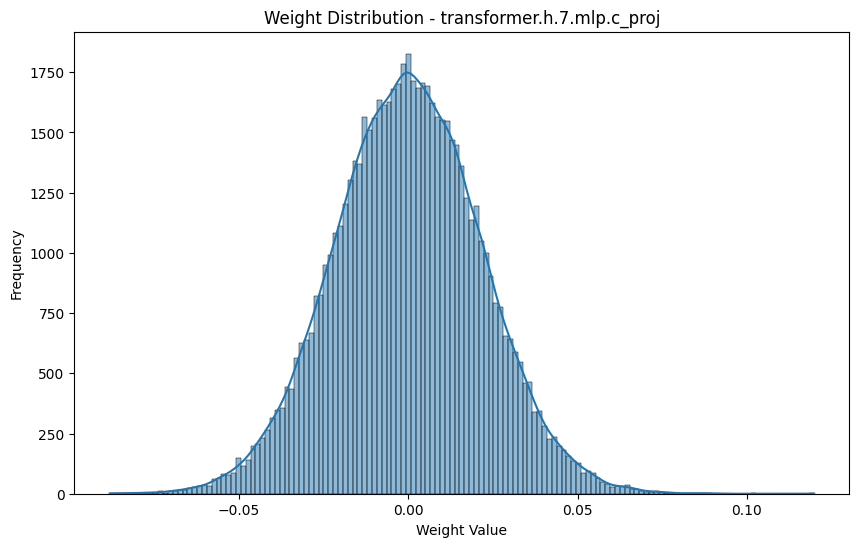


Analyzing transformer.ln_f (LayerNorm)
Weight Shape: torch.Size([128])
Weight Stats:
  Mean: 3.1184
  Std Dev: 0.2449
  Min: 1.9310
  Max: 3.6013


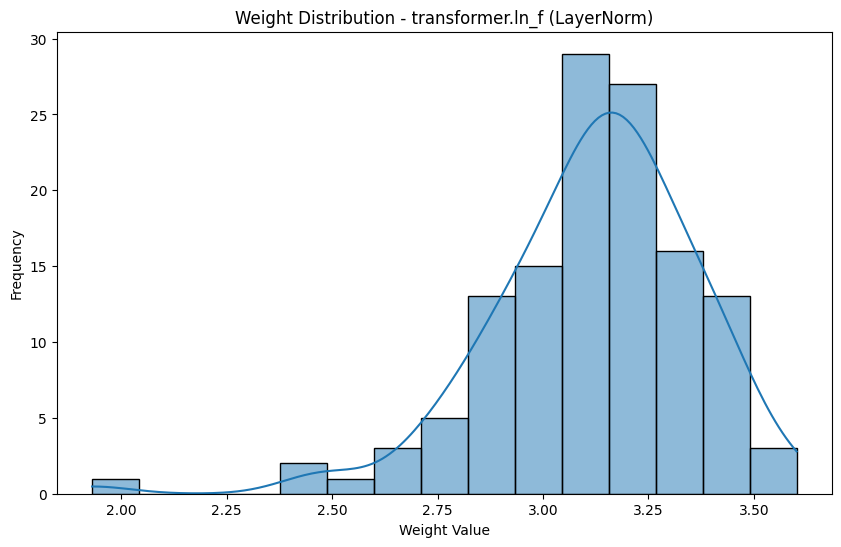


Analyzing lm_head
Weight Shape: torch.Size([50257, 128])
Weight Stats:
  Mean: 0.0029
  Std Dev: 0.0742
  Min: -0.5077
  Max: 0.4817


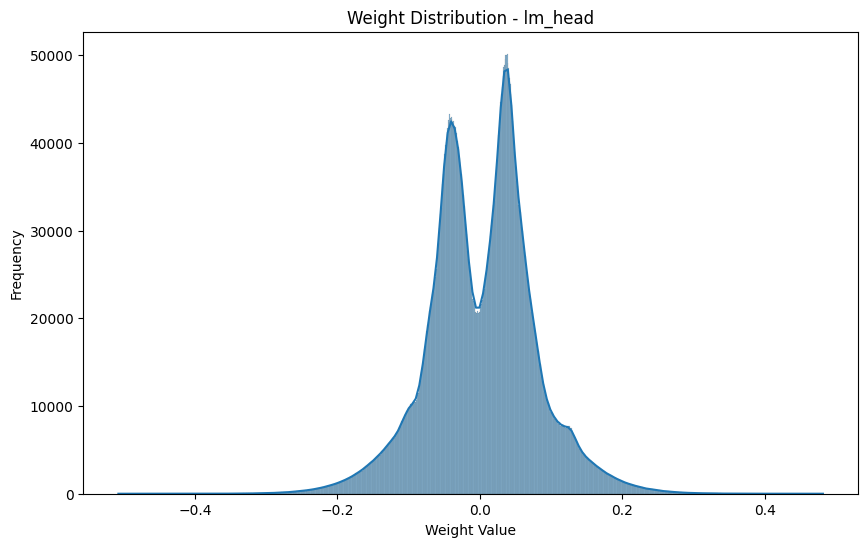

In [13]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_huggingface_transformer_weights(model):
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Linear):
            if not hasattr(module, 'weight'):
                continue
            
            weight = module.weight.detach().cpu().numpy().flatten()
            
            print(f"\nAnalyzing {name}")
            print(f"Weight Shape: {module.weight.shape}")
            print(f"Weight Stats:")
            print(f"  Mean: {weight.mean():.4f}")
            print(f"  Std Dev: {weight.std():.4f}")
            print(f"  Min: {weight.min():.4f}")
            print(f"  Max: {weight.max():.4f}")
            
            plt.figure(figsize=(10, 6))
            sns.histplot(weight, kde=True)
            plt.title(f'Weight Distribution - {name}')
            plt.xlabel('Weight Value')
            plt.ylabel('Frequency')
            plt.show()
        
        elif "LayerNorm" in module.__class__.__name__:
            if hasattr(module, 'weight'):
                weight = module.weight.detach().cpu().numpy().flatten()
                
                print(f"\nAnalyzing {name} (LayerNorm)")
                print(f"Weight Shape: {module.weight.shape}")
                print(f"Weight Stats:")
                print(f"  Mean: {weight.mean():.4f}")
                print(f"  Std Dev: {weight.std():.4f}")
                print(f"  Min: {weight.min():.4f}")
                print(f"  Max: {weight.max():.4f}")
                
                plt.figure(figsize=(10, 6))
                sns.histplot(weight, kde=True)
                plt.title(f'Weight Distribution - {name} (LayerNorm)')
                plt.xlabel('Weight Value')
                plt.ylabel('Frequency')
                plt.show()

# Usage:
analyze_huggingface_transformer_weights(TM3_model)

<>:55: SyntaxWarning: invalid escape sequence '\T'
<>:55: SyntaxWarning: invalid escape sequence '\T'
/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/ipykernel_55320/276923642.py:55: SyntaxWarning: invalid escape sequence '\T'
  print("\TM3 Model - Attention Weight STD Stats:")


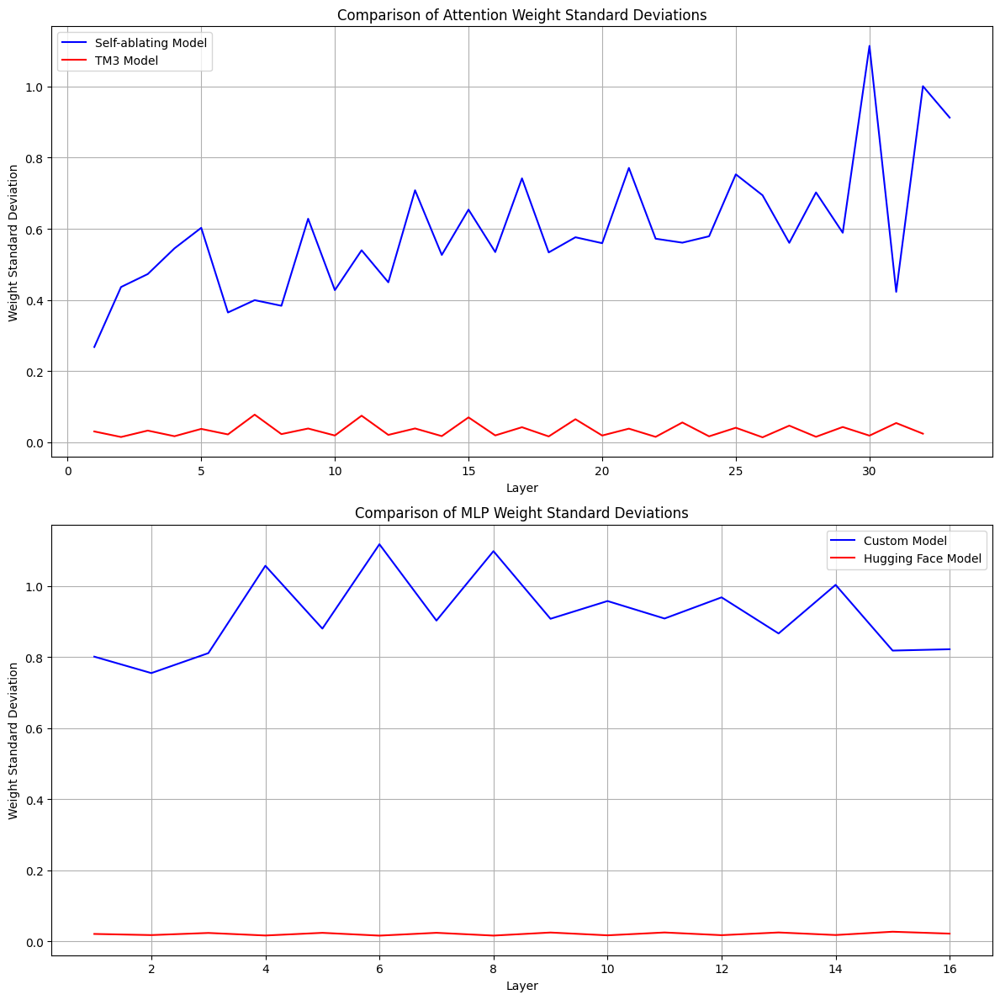

CSelf-ablating model - Attention Weight STD Stats:
  Mean STD: 0.5935
  Min STD: 0.2676
  Max STD: 1.1141

Self-ablating Model - MLP Weight STD Stats:
  Mean STD: 0.9168
  Min STD: 0.7546
  Max STD: 1.1171
\TM3 Model - Attention Weight STD Stats:
  Mean STD: 0.0336
  Min STD: 0.0139
  Max STD: 0.0775

TM3 Model - MLP Weight STD Stats:
  Mean STD: 0.0208
  Min STD: 0.0160
  Max STD: 0.0270


In [16]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def get_separated_weight_stds(model):
    attn_stds = []
    mlp_stds = []
    for name, param in model.named_parameters():
        if 'weight' in name and 'layernorm' not in name.lower():
            std = param.detach().cpu().numpy().std()
            if any(x in name.lower() for x in ['attn', 'attention', 'self']):
                attn_stds.append(std)
            elif 'mlp' in name.lower() or 'ff' in name.lower():
                mlp_stds.append(std)
    return attn_stds, mlp_stds

def compare_model_weight_stds_separated(custom_model, hf_model):
    custom_attn_stds, custom_mlp_stds = get_separated_weight_stds(custom_model)
    hf_attn_stds, hf_mlp_stds = get_separated_weight_stds(hf_model)

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))

    # Attention heads plot
    ax1.plot(range(1, len(custom_attn_stds) + 1), custom_attn_stds, 'b-', label='Self-ablating Model')
    ax1.plot(range(1, len(hf_attn_stds) + 1), hf_attn_stds, 'r-', label='TM3 Model')
    ax1.set_xlabel('Layer')
    ax1.set_ylabel('Weight Standard Deviation')
    ax1.set_title('Comparison of Attention Weight Standard Deviations')
    ax1.legend()
    ax1.grid(True)

    # MLP plot
    ax2.plot(range(1, len(custom_mlp_stds) + 1), custom_mlp_stds, 'b-', label='Custom Model')
    ax2.plot(range(1, len(hf_mlp_stds) + 1), hf_mlp_stds, 'r-', label='Hugging Face Model')
    ax2.set_xlabel('Layer')
    ax2.set_ylabel('Weight Standard Deviation')
    ax2.set_title('Comparison of MLP Weight Standard Deviations')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("CSelf-ablating model - Attention Weight STD Stats:")
    print(f"  Mean STD: {np.mean(custom_attn_stds):.4f}")
    print(f"  Min STD: {np.min(custom_attn_stds):.4f}")
    print(f"  Max STD: {np.max(custom_attn_stds):.4f}")

    print("\nSelf-ablating Model - MLP Weight STD Stats:")
    print(f"  Mean STD: {np.mean(custom_mlp_stds):.4f}")
    print(f"  Min STD: {np.min(custom_mlp_stds):.4f}")
    print(f"  Max STD: {np.max(custom_mlp_stds):.4f}")

    print("\TM3 Model - Attention Weight STD Stats:")
    print(f"  Mean STD: {np.mean(hf_attn_stds):.4f}")
    print(f"  Min STD: {np.min(hf_attn_stds):.4f}")
    print(f"  Max STD: {np.max(hf_attn_stds):.4f}")

    print("\nTM3 Model - MLP Weight STD Stats:")
    print(f"  Mean STD: {np.mean(hf_mlp_stds):.4f}")
    print(f"  Min STD: {np.min(hf_mlp_stds):.4f}")
    print(f"  Max STD: {np.max(hf_mlp_stds):.4f}")

# Usage:
compare_model_weight_stds_separated(model, TM3_model)

# Pre-trained GPT-Neo

Just got it to display attention patterns with a pretrained gpt-neo-125M model. Needs verification. 

In [79]:
%pip install transformer_lens
%pip install git+https://github.com/callummcdougall/CircuitsVis.git#subdirectory=python

Note: you may need to restart the kernel to use updated packages.
  Cloning https://github.com/callummcdougall/CircuitsVis.git to /private/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/pip-req-build-7ysxqi1z
  Running command git clone --filter=blob:none --quiet https://github.com/callummcdougall/CircuitsVis.git /private/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/pip-req-build-7ysxqi1z
  Resolved https://github.com/callummcdougall/CircuitsVis.git to commit 1e6129d08cae7af9242d9ab5d3ed322dd44b4dd3
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for circuitsvis: filename=circuitsvis-0.0.0-py3-none-any.whl size=6172334 sha256=59415c32edc93016c6c42f3b4833706a3be43b700e7573be5495cc7c0ec5f306
  Stored in directory: /private/var/folders/f5/t4n8wk5d419dcc_kskpqnt800000gn/T/pip-ephem-wheel-cache-k4re7tfq/wheels/8d/68/ca/335802ff1c5d5f96504560175cde95668ec33765175a705158
Successfully bui

In [80]:
from transformer_lens.hook_points import HookPoint
from transformer_lens import utils, HookedTransformer, HookedTransformerConfig, FactoredMatrix, ActivationCache
import circuitsvis as cv
import transformer_lens
import circuitsvis as cv
gpt_neo_org : HookedTransformer = HookedTransformer.from_pretrained("gpt-neo-125M").to("cpu")


Loaded pretrained model gpt-neo-125M into HookedTransformer
Moving model to device:  cpu


In [81]:
gpt2_text = "Once upon a time, in a land far away, there lived a brave little mouse."
gpt2_tokens = gpt_neo_org.to_tokens(gpt2_text)
gpt2_logits, gpt2_cache = gpt_neo_org.run_with_cache(gpt2_tokens, remove_batch_dim=True)

In [63]:
import einops 


In [1]:
import torch as t
from torch import Tensor
import circuitsvis as cv
from jaxtyping import Float
from IPython.display import clear_output, display, HTML
from transformer_lens import HookedTransformer

t.set_grad_enabled(False)

gpt2 = HookedTransformer.from_pretrained("gpt-neo-125M")

/Users/luhan/PycharmProjects/self-ablating-transformers/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Loaded pretrained model gpt-neo-125M into HookedTransformer


In [25]:
sentence0 = "When Mary and John went to the shops, John gave a drink to Mary."
sentence1 = "When Mary and John went to the shops, Mary gave a drink to John."
sentence2 = "The cat sat on the mat."
sentence3= "Once upon a time, in a land far away, there lived a brave little mouse."
sentences_all = [sentence3]

names_filter = lambda name: any(name.endswith(f"hook_{s}") for s in ["pattern", "q", "k", "v"])
logits, cache = gpt2.run_with_cache(sentence3, names_filter=names_filter, remove_batch_dim=True)
logits_all, cache_all = gpt2.run_with_cache(sentences_all, names_filter=names_filter)
logits, cache_full = gpt2.run_with_cache(sentence3, remove_batch_dim=True)

attn: Float[Tensor, "layers heads seq_Q seq_K"] = t.stack([cache["pattern", i] for i in range(gpt2.cfg.n_layers)])
attn_all: Float[Tensor, "batch layers heads seq_Q seq_K"] = t.stack([cache_all["pattern", i] for i in range(gpt2.cfg.n_layers)], dim=1)

tokens = gpt2.to_str_tokens(sentence3)
tokens_all = gpt2.to_str_tokens(sentences_all)

In [26]:
# No head dimension or batch dimension:

_attention = cache["pattern", 0][0] # [seqQ seqK]
_tokens = tokens # [seq]

cv.attention.from_values(
    attention = _attention,
    tokens = _tokens,
)

In [27]:
# Head dimension, no batch dimension:

_attention = cache["pattern", 0] # [heads seqQ seqK]
_tokens = tokens # [seq]

cv.attention.from_values(
    attention = _attention,
    tokens = _tokens,
    attention_head_names = [f"0.{H}" for H in range(12)],
)

In [28]:
# Batch dimension, no head dimension:

_attention = cache_all["pattern", 0][:, 0] # [batch heads seqQ seqK]
_tokens = tokens_all # [batch seq]

cv.attention.from_values(
    attention = _attention,
    tokens = _tokens,
)

You're using 2D tokens with a batch dimension of size 1. We have removed the batch dimension for you.
